In [549]:
import pandas as pd
import copy
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import re
import math
import statistics
from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import linkage, dendrogram
from collections import defaultdict


In [551]:

# Read the entire Excel file (first sheet by default)
df = pd.read_excel('annotations_2601_full.xlsx', sheet_name='Clean_doc', index_col=0, nrows=147)


In [552]:
df

,OpenAI_marketing_1,OpenAI_marketing_2,OpenAI_marketing_2_LLM,OpenAI_marketing_3,OpenAI_marketing_3_LLM,OpenAI_marketing_4,OpenAI_marketing_4_LLM,OpenAI_marketing_5,OpenAI_marketing_5_LLM,OpenAI_report_1,...,Microsoft_10,Microsoft_11,Microsoft_12,Microsoft_13,Microsoft_14,Microsoft_15,Microsoft_16,Microsoft_17,Microsoft_18,Unnamed: 133
Document,,,,,,,,,,,,,,,,,,,,,
Link,https://openai.com/solutions/ai-for-finance/,https://openai.com/index/morgan-stanley/,-,https://openai.com/index/hebbia/,-,https://openai.com/chatgpt/overview/,-,https://openai.com/index/introducing-4o-image-...,-,https://cdn.openai.com/pdf/a794887b-5a77-4207-...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Company,OpenAI,OpenAI,OpenAI,OpenAI,OpenAI,OpenAI,OpenAI,OpenAI,OpenAI,OpenAI,...,Microsoft,Microsoft,Microsoft,Microsoft,Microsoft,Microsoft,Microsoft,Microsoft,Microsoft,NaN
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Which genAI do users use?,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
actual,ChatGPT,"""AI @ Morgan Stanley Assistant, Morgan Stanley...","['By embedding GPT‑4 into their workflows, Mor...","""Hebbia’s deep research [..] powered by OpenAI...","['Rather than relying on a single AI model, Ma...",names of models,['Access to GPT‑4.1 mini; Real-time data from ...,NaN,['4o image generation rolls out starting today...,NaN,...,"Microsoft 365 Copilot Chat, GPT-5",ChatGPT and Copilot,NaN,NaN,"""It uses Azure Al Search for retrieval and Azu...",NaN,Microsoft 365 Copilot,NaN,Azure AI Foundry and Azure OpenAI Service,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Method #5 -questions-temporality,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Method #6,NaN,Empirical - Interaction - Observational - Fiel...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Method #6 - relevant quotes,NaN,“The feedback from advisors has been overwhelm...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Compute simple statistics

In [553]:
dict_documents = {"Marketing materials": {"OpenAI":0, "Microsoft":0, "Meta":0, "AI2":0, "Anthropic":0, "Google":0},\
                "Model documentation":  {"OpenAI":0, "Microsoft":0, "Meta":0, "AI2":0, "Anthropic":0, "Google":0},\
                "Developer guides":  {"OpenAI":0, "Microsoft":0, "Meta":0, "AI2":0, "Anthropic":0, "Google":0},\
                "Reports":  {"OpenAI":0, "Microsoft":0, "Meta":0, "AI2":0, "Anthropic":0, "Google":0},\
                "Policies":  {"OpenAI":0, "Microsoft":0, "Meta":0, "AI2":0, "Anthropic":0, "Google":0}} 

for column_name in df.columns:
    if "LLM" not in column_name:
        if "Anthropic_21" not in column_name:
            if "Anthropic_16" not in column_name:
                if "AI2_6" not in column_name:
                    if "AI2_7" not in column_name:
                        if "_old" not in column_name:
                            document_type = df[column_name]["Document categorization"]
                            company = df[column_name]["Company"]
                            if document_type == "Marketing materials":
                                dict_documents["Marketing materials"][company]+=1
                            if document_type == "Reports":
                                dict_documents["Reports"][company]+=1
                            if document_type == "Model documentation":
                                dict_documents["Model documentation"][company]+=1
                            if document_type == "Policies":
                                dict_documents["Policies"][company]+=1
                            if document_type == "Developer guides":
                                dict_documents["Developer guides"][company]+=1
                            if (document_type != "Marketing materials") and (document_type != "Policies") \
                                and (document_type != "Reports") and (document_type != "Developer guides")\
                                and (document_type != "Model documentation"):
                                print(column_name, document_type)
        

total_company = {"OpenAI":0, "Microsoft":0, "Meta":0, "AI2":0, "Anthropic":0, "Google":0}
for elem in dict_documents:
    temp_dict = dict_documents[elem]
    temp_total = 0
    for company in temp_dict:
        temp_total += temp_dict[company]
        total_company[company] += temp_dict[company]
    dict_documents[elem]["total"] = temp_total

print(dict_documents)
print(total_company)

Unnamed: 133 nan
{'Marketing materials': {'OpenAI': 6, 'Microsoft': 9, 'Meta': 7, 'AI2': 6, 'Anthropic': 7, 'Google': 6, 'total': 41}, 'Model documentation': {'OpenAI': 6, 'Microsoft': 1, 'Meta': 3, 'AI2': 3, 'Anthropic': 3, 'Google': 8, 'total': 24}, 'Developer guides': {'OpenAI': 1, 'Microsoft': 4, 'Meta': 10, 'AI2': 0, 'Anthropic': 2, 'Google': 0, 'total': 17}, 'Reports': {'OpenAI': 3, 'Microsoft': 3, 'Meta': 0, 'AI2': 7, 'Anthropic': 8, 'Google': 1, 'total': 22}, 'Policies': {'OpenAI': 0, 'Microsoft': 1, 'Meta': 1, 'AI2': 2, 'Anthropic': 1, 'Google': 2, 'total': 7}}
{'OpenAI': 16, 'Microsoft': 18, 'Meta': 21, 'AI2': 18, 'Anthropic': 21, 'Google': 17}


In [554]:
total_papers = 0
for key, value in dict_documents.items():
    temp_dict = value
    #print(temp_dict)
    #for company, value in temp_dict.items():
    total_papers += temp_dict["total"]
print(total_papers)

totals = copy.deepcopy(total_company)
for elem in dict_documents:
    totals[elem] = dict_documents[elem]["total"]

111


# Create plots without diving per company or document

In [620]:
def dict_disaggregated(row_label, df, totals):
    format_dict = {"total": 0}
        
    start_idx = df.index.get_loc(row_label)
    subset = df.iloc[start_idx+1:start_idx + 16]
    
    dict_to_populate = {row_label + "_actual": copy.deepcopy(format_dict), \
                           row_label + "_potential": copy.deepcopy(format_dict), \
                            row_label + "_projected": copy.deepcopy(format_dict)}
    
    for column_name in df.columns:
        if "LLM" not in column_name:
            if "Anthropic_21" not in column_name:
                if "Anthropic_16" not in column_name:
                    if "AI2_6" not in column_name:
                        if "AI2_7" not in column_name:
                            information_actual = subset[column_name].loc["actual"]
                            information_potential = subset[column_name].loc["potential"]
                            information_projected = subset[column_name].loc["projected"]
                            if not pd.isna(information_actual):
                                dict_to_populate[row_label + "_actual"]["total"] += 1
                                dict_to_populate[row_label + "_actual"]["total"] += 1
                            if not pd.isna(information_potential):
                                dict_to_populate[row_label + "_potential"]["total"] += 1
                                dict_to_populate[row_label + "_potential"]["total"] += 1
                            if not pd.isna(information_projected):
                                dict_to_populate[row_label + "_projected"]["total"] += 1
                                dict_to_populate[row_label + "_projected"]["total"] += 1
    
    return dict_to_populate


list_useQuestions = ["Who uses it?",  "Where do users use it?", "When do users use it?", "What do users use it for?",\
                       "Why do users use it?", "How do users use it?"] #, 
count_dictionary = {}
for row_label in list_useQuestions:
    count_dictionary[row_label] = dict_disaggregated(row_label, df, totals)
print(count_dictionary)

{'Who uses it?': {'Who uses it?_actual': {'total': 68}, 'Who uses it?_potential': {'total': 72}, 'Who uses it?_projected': {'total': 10}}, 'Where do users use it?': {'Where do users use it?_actual': {'total': 48}, 'Where do users use it?_potential': {'total': 44}, 'Where do users use it?_projected': {'total': 8}}, 'When do users use it?': {'When do users use it?_actual': {'total': 18}, 'When do users use it?_potential': {'total': 6}, 'When do users use it?_projected': {'total': 0}}, 'What do users use it for?': {'What do users use it for?_actual': {'total': 72}, 'What do users use it for?_potential': {'total': 180}, 'What do users use it for?_projected': {'total': 14}}, 'Why do users use it?': {'Why do users use it?_actual': {'total': 66}, 'Why do users use it?_potential': {'total': 100}, 'Why do users use it?_projected': {'total': 24}}, 'How do users use it?': {'How do users use it?_actual': {'total': 46}, 'How do users use it?_potential': {'total': 110}, 'How do users use it?_project

# Create plots at the most disaggregated level (questions and temporality)

In [621]:
def map_question_reporting_standard(row_label, df, totals):
    print(row_label)

    format_dict = {"OpenAI": 0, "Anthropic":0, "Meta":0, "Microsoft":0, "Google":0, "AI2":0,\
                 "Marketing materials": 0, "Reports":0, "Model documentation":0, "Policies":0, "Developer guides":0}
    
    start_idx = df.index.get_loc(row_label)
    # Get that row and the next three
    subset = df.iloc[start_idx+1:start_idx + 16]

    dict_to_populate = {row_label + "_actual": copy.deepcopy(format_dict), \
                       row_label + "_potential": copy.deepcopy(format_dict), \
                        row_label + "_projected": copy.deepcopy(format_dict)}

    
    for column_name in df.columns:
        if "LLM" not in column_name:
            if "Anthropic_21" not in column_name:
                if "Anthropic_16" not in column_name:
                    if "AI2_6" not in column_name:
                        if "AI2_7" not in column_name:
                            document_type = df[column_name]["Document categorization"]
                            company = df[column_name]["Company"]
                            information_actual = subset[column_name].loc["actual"]
                            information_potential = subset[column_name].loc["potential"]
                            information_projected = subset[column_name].loc["projected"]
                            if not pd.isna(information_actual):
                                dict_to_populate[row_label + "_actual"][company] += 1
                                dict_to_populate[row_label + "_actual"][document_type] += 1
                            if not pd.isna(information_potential):
                                dict_to_populate[row_label + "_potential"][company] += 1
                                dict_to_populate[row_label + "_potential"][document_type] += 1
                            if not pd.isna(information_projected):
                                dict_to_populate[row_label + "_projected"][company] += 1
                                dict_to_populate[row_label + "_projected"][document_type] += 1

    for elem in dict_to_populate:
        for index in dict_to_populate[elem]:
            dict_to_populate[elem][index] = round(dict_to_populate[elem][index] / totals[index], 2)
        
    return dict_to_populate




list_useQuestions = ["Who uses it?",  "Where do users use it?", "What do users use it for?",\
                     "How do users use it?" , "When do users use it?", "Why do users use it?"] #, 
count_dictionary = {}
for row_label in list_useQuestions:
    count_dictionary[row_label] = map_question_reporting_standard(row_label, df, totals)


Who uses it?
Where do users use it?
What do users use it for?
How do users use it?
When do users use it?
Why do users use it?


In [622]:
count_dictionary

{'Who uses it?': {'Who uses it?_actual': {'OpenAI': 0.25,
   'Anthropic': 0.38,
   'Meta': 0.38,
   'Microsoft': 0.39,
   'Google': 0.29,
   'AI2': 0.11,
   'Marketing materials': 0.44,
   'Reports': 0.5,
   'Model documentation': 0.08,
   'Policies': 0.29,
   'Developer guides': 0.06},
  'Who uses it?_potential': {'OpenAI': 0.25,
   'Anthropic': 0.19,
   'Meta': 0.29,
   'Microsoft': 0.61,
   'Google': 0.35,
   'AI2': 0.28,
   'Marketing materials': 0.41,
   'Reports': 0.27,
   'Model documentation': 0.25,
   'Policies': 0.43,
   'Developer guides': 0.24},
  'Who uses it?_projected': {'OpenAI': 0.12,
   'Anthropic': 0.0,
   'Meta': 0.0,
   'Microsoft': 0.0,
   'Google': 0.12,
   'AI2': 0.06,
   'Marketing materials': 0.1,
   'Reports': 0.05,
   'Model documentation': 0.0,
   'Policies': 0.0,
   'Developer guides': 0.0}},
 'Where do users use it?': {'Where do users use it?_actual': {'OpenAI': 0.12,
   'Anthropic': 0.19,
   'Meta': 0.29,
   'Microsoft': 0.33,
   'Google': 0.29,
   'AI2'

In [623]:


rows = []

for question, subdict in count_dictionary.items():
    # some entries have sub-questions (actual/potential/projected)
    if isinstance(subdict, dict):
        for subkey, values in subdict.items():
            # handle both nested and direct key:value forms
            if isinstance(values, dict):
                stage = "actual"
                if "potential" in subkey:
                    stage = "potential"
                elif "projected" in subkey:
                    stage = "projected"
                rows.append({
                    "Question": question,
                    "Stage": stage,
                    **values
                })
        # handle top-level direct values (e.g. "Which factors impact...")
        if all(isinstance(v, (int, float)) for v in subdict.values()):
            rows.append({
                "Question": question,
                "Stage": "actual",
                **subdict
            })

# Create DataFrame
df_counts = pd.DataFrame(rows)

# Combine question + stage into one label for the row index
df_counts["QuestionStage"] = df_counts["Question"] + " (" + df_counts["Stage"] + ")"
df_counts = df_counts.drop(columns=["Question", "Stage"]).set_index("QuestionStage")

#print(df_counts)

df_counts.index = [
    "Who? (actual)",
    "Who? (potential)",
    "Who? (projected)",
    "Where? (actual)",
    "Where? (potential)",
     "Where? (projected)",
    "What for? (actual)",
    "What for? (potential)",
    "What for? (projected)",
    "How? (actual)",
    "How? (potential)",
     "How? (projected)",
    "When? (actual)",
    "When? (potential)",
    "When? (projected)",
    "Why? (actual)",
    "Why? (potential)",
     "Why? (projected)",
]

In [624]:


new_order_1 = [
    "Who? (actual)",
    "Who? (potential)",
    "Who? (projected)",
    "Where? (actual)",
    "Where? (potential)",
     "Where? (projected)",
    "When? (actual)",
    "When? (potential)",
    "When? (projected)",
     "Why? (actual)",
    "Why? (potential)",
     "Why? (projected)",
    "What for? (actual)",
    "What for? (potential)",
    "What for? (projected)",
    "How? (actual)",
    "How? (potential)",
     "How? (projected)"
]

new_order_2 = [
    "Who? (actual)",
    "Where? (actual)",
    "When? (actual)",
     "Why? (actual)",
    "What for? (actual)",
    "How? (actual)",

    "Who? (potential)",
    "Where? (potential)",
    "When? (potential)",
    "Why? (potential)",
    "What for? (potential)",
    "How? (potential)",

    "Who? (projected)",
     "Where? (projected)",
    "When? (projected)",
     "Why? (projected)",
    "What for? (projected)",
     "How? (projected)"
]

order_type = 2
if order_type ==2:
    df_counts = df_counts.loc[new_order_2]
if order_type ==1:
    df_counts = df_counts.loc[new_order_1]

df_counts = df_counts.rename(columns={
    "Marketing materials": "Marketing",
    "Developer guides": "Guides",
    "Model documentation": "Documentation"
})

In [625]:
df_counts

,OpenAI,Anthropic,Meta,Microsoft,Google,AI2,Marketing,Reports,Documentation,Policies,Guides
Who? (actual),0.25,0.38,0.38,0.39,0.29,0.11,0.44,0.50,0.08,0.29,0.06
Where? (actual),0.12,0.19,0.29,0.33,0.29,0.06,0.29,0.27,0.08,0.43,0.06
When? (actual),0.19,0.05,0.00,0.22,0.00,0.06,0.17,0.05,0.00,0.00,0.06
Why? (actual),0.31,0.43,0.29,0.28,0.24,0.22,0.54,0.36,0.08,0.14,0.00
What for? (actual),0.25,0.48,0.33,0.33,0.41,0.11,0.46,0.55,0.08,0.29,0.06
How? (actual),0.19,0.43,0.05,0.28,0.18,0.11,0.32,0.36,0.04,0.00,0.06
Who? (potential),0.25,0.19,0.29,0.61,0.35,0.28,0.41,0.27,0.25,0.43,0.24
Where? (potential),0.12,0.10,0.00,0.44,0.47,0.11,0.24,0.14,0.12,0.57,0.12
When? (potential),0.06,0.05,0.00,0.06,0.00,0.00,0.02,0.09,0.00,0.00,0.00
Why? (potential),0.44,0.24,0.24,0.78,0.88,0.22,0.66,0.23,0.50,0.43,0.18


In [634]:
def plotIncludingStatistics(df_main, file_name, **kwargs):
    
    # Compute row mean & std
    df_mean = df_main.mean(axis=1)
    df_std = df_main.std(axis=1)
    
    fig = plt.figure(figsize=(16, 8))
    # --- Axis Layout ---
    # [left, bottom, width, height]
    ax_main = fig.add_axes([0.05, 0.1, 0.45, 0.8])      # big heatmap
    ax_mean = fig.add_axes([0.5, 0.1, 0.050, 0.8])      # mean heatmap
    ax_std  = fig.add_axes([0.55, 0.1, 0.050, 0.8])      # std heatmap
    # --- Main heatmap ---
    sns.heatmap(df_main, ax=ax_main, **kwargs)
    ax_main.set_ylabel("")
    ax_main.tick_params(axis='y', labelleft=True)  # hide left labels (we will add our own right labels)
    # --- Mean heatmap ---
    sns.heatmap(df_mean.to_frame(name="mean"),
                annot=True, cmap="YlGnBu",  cbar=False, ax=ax_mean) #fmt=".2f",cmap="Greens",
    ax_mean.set_ylabel("")
    ax_mean.tick_params(axis='y', labelleft=False)  # hide left labels (we will add our own right labels)
    # --- Std heatmap ---
    sns.heatmap(df_std.to_frame(name="std"),
                annot=True,  cmap="Oranges", cbar=True, ax=ax_std) #fmt=".2f",
    ax_std.set_ylabel("")
    ax_std.set_yticks([])
    fig.savefig(file_name, dpi=300, bbox_inches="tight")
    plt.close()

In [635]:
plt.figure(figsize=(12, 8))  # adjust size as needed
sns.heatmap(df_counts[["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]],\
            annot=True, fmt=".2f", cmap="YlGnBu", cbar=True)
plt.savefig("plots/heatmap_disaggregated_companies_" + str(order_type) + ".png", dpi=300, bbox_inches="tight")
plt.close()

df_main = df_counts[["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]].copy()
plotIncludingStatistics(df_main, "plots/heatmap_disaggregated_companies_statistics_" + str(order_type) + ".png",\
                        annot=True, fmt=".2f", cmap="YlGnBu", cbar=True)

# plot the heatmap of questions / company as a binary

df_binary = (df_counts[["OpenAI", "Anthropic", "Google", "Microsoft", "Meta", "AI2"]] > 0).astype(int)
sns.heatmap(
    df_binary,
    annot=False,
    fmt="d",
    cmap="YlGnBu",
    cbar=False,
    linewidths=0.5,
    linecolor="white"
)
plt.savefig("plots/heatmap_disaggregated_companies_binary_" + str(order_type) + ".png", dpi=300, bbox_inches="tight")
plt.close()

plt.figure(figsize=(12, 8))  # adjust size as needed
sns.heatmap(df_counts[["Marketing", "Policies", "Guides", "Documentation", "Reports"]], annot=True, fmt=".2f", cmap="YlGnBu", cbar=True)
plt.savefig("plots/heatmap_disaggregated_documents_" + str(order_type) + ".png", dpi=300, bbox_inches="tight")
plt.close()

df_main = df_counts[["Marketing", "Policies", "Guides", "Documentation", "Reports"]].copy()
plotIncludingStatistics(df_main, "plots/heatmap_disaggregated_documents_statistics_" + str(order_type) + ".png",\
                        annot=True, fmt=".2f", cmap="YlGnBu", cbar=True)

In [636]:
plt.figure(figsize=(12, 8))  # adjust size as needed
sns.heatmap(df_counts[["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]]*100,\
            annot=True,  cmap="YlGnBu", cbar=True)
plt.savefig("plots/heatmap_disaggregated_companies_100_" + str(order_type) + ".png", dpi=300, bbox_inches="tight")
plt.close()

df_main = df_counts[["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]].copy() * 100
plotIncludingStatistics(df_main, "plots/heatmap_disaggregated_companies_statistics_100_" + str(order_type) + ".png",\
                        annot=True, cmap="YlGnBu", cbar=True)



plt.figure(figsize=(12, 8))  # adjust size as needed
sns.heatmap(df_counts[["Marketing", "Policies", "Guides", "Documentation", "Reports"]]*100, annot=True, cmap="YlGnBu", cbar=True)
plt.savefig("plots/heatmap_disaggregated_documents_100_" + str(order_type) + ".png", dpi=300, bbox_inches="tight")
plt.close()

df_main = df_counts[["Marketing", "Policies", "Guides", "Documentation", "Reports"]].copy() * 100
plotIncludingStatistics(df_main, "plots/heatmap_disaggregated_documents_statistics_100_" + str(order_type) + ".png",\
                        annot=True, cmap="YlGnBu", cbar=True)

# Counts of questions answered (disaggregated)

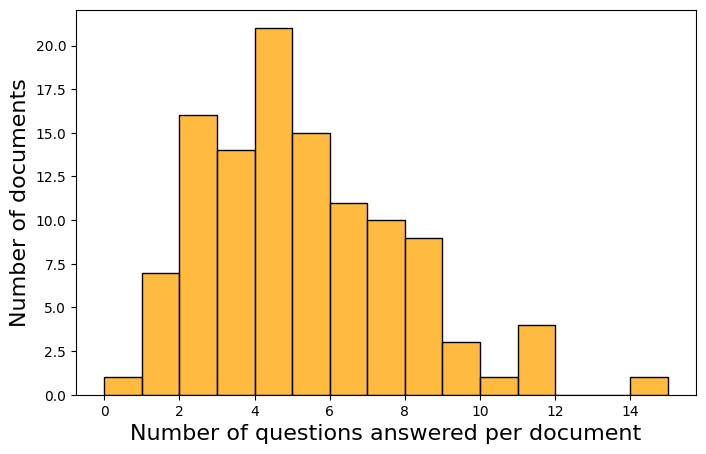

In [564]:

#for doc_type in ["Marketing", "Policies", "guides", "Model documentation", "Reports"]:
#subset_df = df[df.columns[df.loc["Document categorization"].fillna("").str.contains(doc_type)]]
subset_df = df.copy()
subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
temp_total = subset_df.shape[1]
#print(subset_df.shape)
subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]

subset_df_binary = subset_df.notna().astype(int)
    
# Suppose df is your DataFrame with "yes" and NaN
# Step 1: Count "yes" per column
yes_counts = (subset_df_binary == 1).sum(axis=0)
    
# Step 2b: Plot histogram of distribution of counts
plt.figure(figsize=(8, 5))
sns.histplot(yes_counts, bins=range(0, int(yes_counts.max(skipna=True)+2)), color="orange")
plt.ylabel("Number of documents",fontsize=16)      # remove label
plt.xlabel("Number of questions answered per document",fontsize=16)

#axes[ax_count-1].set_ylabel("Number of documents")
plt.savefig("plots/counts_disaggregated_all_absolute.png", dpi=300, bbox_inches="tight")
#fig.close()

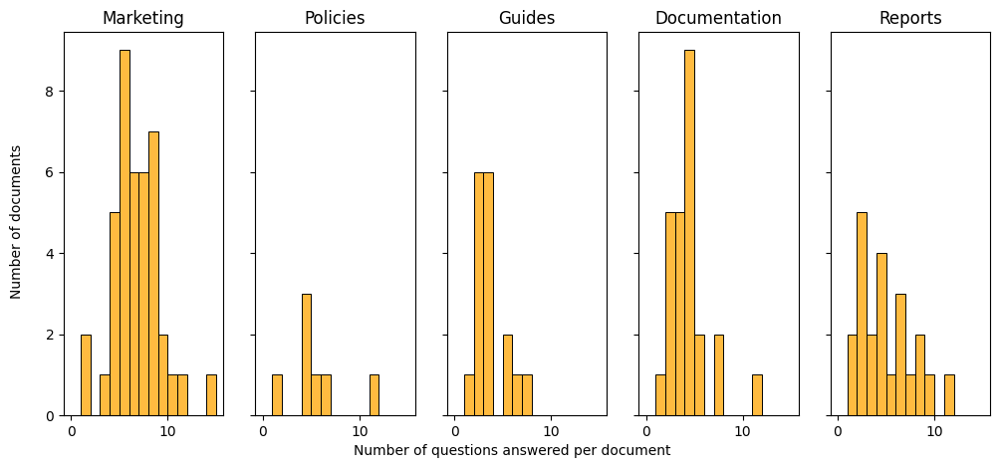

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

In [565]:
# types of documents


# Create figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1,5, figsize=(12, 5), sharex=True, sharey=True) 
ax_count = 0

for doc_type in ["Marketing", "Policies", "guides", "Model documentation", "Reports"]:
    subset_df = df[df.columns[df.loc["Document categorization"].fillna("").str.contains(doc_type)]]
    subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
    temp_total = subset_df.shape[1]
    #print(subset_df.shape)
    subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]

    subset_df_binary = subset_df.notna().astype(int)
    
    # Suppose df is your DataFrame with "yes" and NaN
    # Step 1: Count "yes" per column
    yes_counts = (subset_df_binary == 1).sum(axis=0)
    #print("Number of 'yes' per column:\n", yes_counts)
    #yes_counts_clean = yes_counts.dropna()  # remove NaNs

    #if len(yes_counts_clean) == 0:
    #    print(f"No valid 'yes' counts to plot for {doc_type}. Skipping...")
    #else:
    # Step 2b: Plot histogram of distribution of counts
    plt.figure(figsize=(8, 5))
    sns.histplot(yes_counts, bins=range(0, int(yes_counts.max(skipna=True)+2)), color="orange", ax=axes[ax_count])
    axes[ax_count].set_ylabel("")      # remove label
    if doc_type == "guides":
        doc_type = "Guides"
    if doc_type == "Model documentation":
        doc_type = "Documentation"
    axes[ax_count].set_title(doc_type) #"Distribution of the number of answered questions per document")
    
    ax_count += 1
fig.text(0.5, 0.03, "Number of questions answered per document", ha="center")
fig.text(0.08, 0.5, "Number of documents", va="center", rotation="vertical")

#axes[ax_count-1].set_ylabel("Number of documents")
fig.savefig("plots/counts_disaggregated_documents_absolute.png", dpi=300, bbox_inches="tight")
#fig.close()

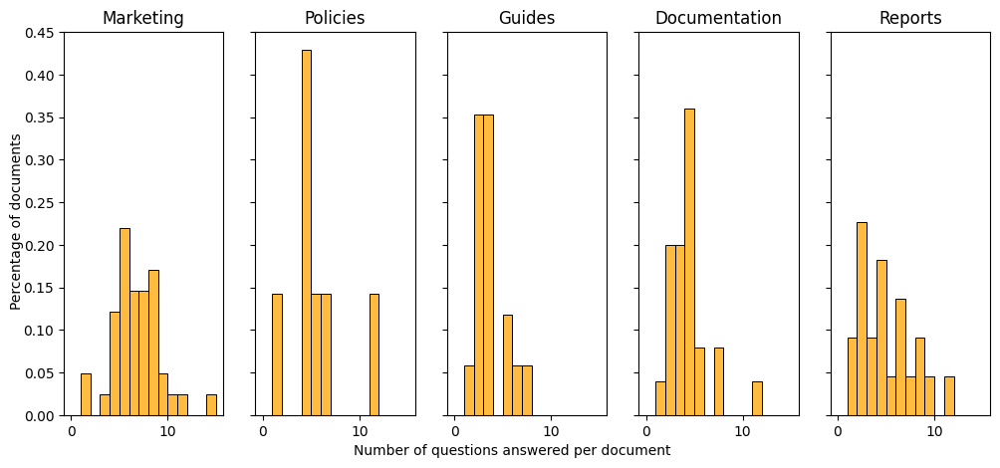

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

In [566]:
# types of documents


# Create figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1,5, figsize=(12, 5), sharex=True, sharey=True) 
ax_count = 0

for doc_type in ["Marketing", "Policies", "guides", "Model documentation", "Reports"]:
    subset_df = df[df.columns[df.loc["Document categorization"].fillna("").str.contains(doc_type)]]
    subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
    temp_total = subset_df.shape[1]
    #print(subset_df.shape)
    subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]

    subset_df_binary = subset_df.notna().astype(int)
    
    # Suppose df is your DataFrame with "yes" and NaN
    # Step 1: Count "yes" per column
    yes_counts = (subset_df_binary == 1).sum(axis=0)
    #print("Number of 'yes' per column:\n", yes_counts)
    #yes_counts_clean = yes_counts.dropna()  # remove NaNs

    #if len(yes_counts_clean) == 0:
    #    print(f"No valid 'yes' counts to plot for {doc_type}. Skipping...")
    #else:
    # Step 2b: Plot histogram of distribution of counts
    plt.figure(figsize=(8, 5))
    sns.histplot(yes_counts, bins=range(0, int(yes_counts.max(skipna=True)+2)), color="orange", ax=axes[ax_count], stat='probability')
    axes[ax_count].set_ylabel("")      # remove label
    if doc_type == "guides":
        doc_type = "Guides"
    if doc_type == "Model documentation":
        doc_type = "Documentation"
    axes[ax_count].set_title(doc_type) #"Distribution of the number of answered questions per document")
    
    ax_count += 1
fig.text(0.5, 0.03, "Number of questions answered per document", ha="center")
fig.text(0.08, 0.5, "Percentage of documents", va="center", rotation="vertical")

#axes[ax_count-1].set_ylabel("Number of documents")
fig.savefig("plots/counts_disaggregated_documents_percentage.png", dpi=300, bbox_inches="tight")
#fig.close()

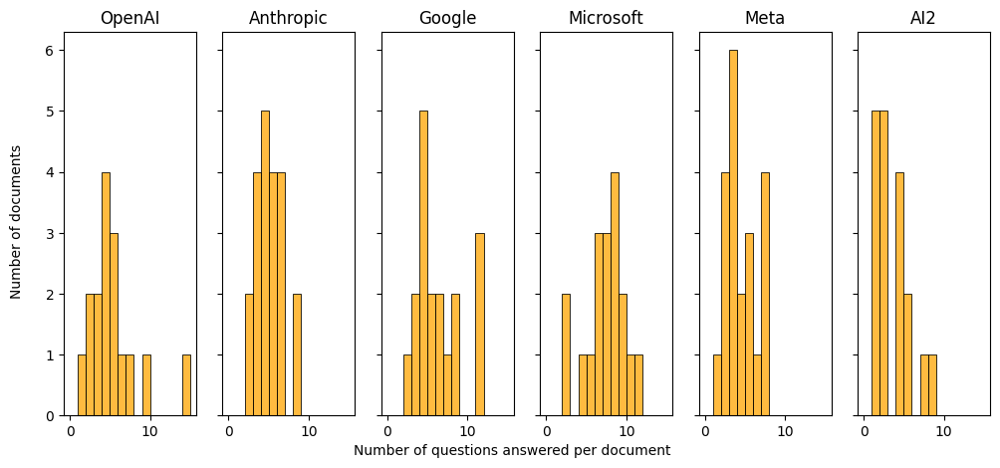

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

In [567]:
# types of documents


# Create figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1,6, figsize=(12, 5), sharex=True, sharey=True) 
ax_count = 0

for company in ["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]:
    subset_df = df[df.columns[df.loc["Company"].fillna("").str.contains(company)]]

    subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]

    subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
    
    subset_df_binary = subset_df.notna().astype(int)
    
    # Suppose df is your DataFrame with "yes" and NaN
    # Step 1: Count "yes" per column
    yes_counts = (subset_df_binary == 1).sum(axis=0)
    #print("Number of 'yes' per column:\n", yes_counts)
    #yes_counts_clean = yes_counts.dropna()  # remove NaNs

    #if len(yes_counts_clean) == 0:
    #    print(f"No valid 'yes' counts to plot for {doc_type}. Skipping...")
    #else:
    # Step 2b: Plot histogram of distribution of counts
    plt.figure(figsize=(8, 5))
    sns.histplot(yes_counts, bins=range(0, int(yes_counts.max(skipna=True)+2)), color="orange", ax=axes[ax_count])
    axes[ax_count].set_ylabel("")      # remove label
    
    axes[ax_count].set_title(company) #"Distribution of the number of answered questions per document")
    
    ax_count += 1
fig.text(0.5, 0.03, "Number of questions answered per document", ha="center")
fig.text(0.08, 0.5, "Number of documents", va="center", rotation="vertical")

#axes[ax_count-1].set_ylabel("Number of documents")
fig.savefig("plots/counts_disaggregated_companies_absolute.png", dpi=300, bbox_inches="tight")
#fig.close()

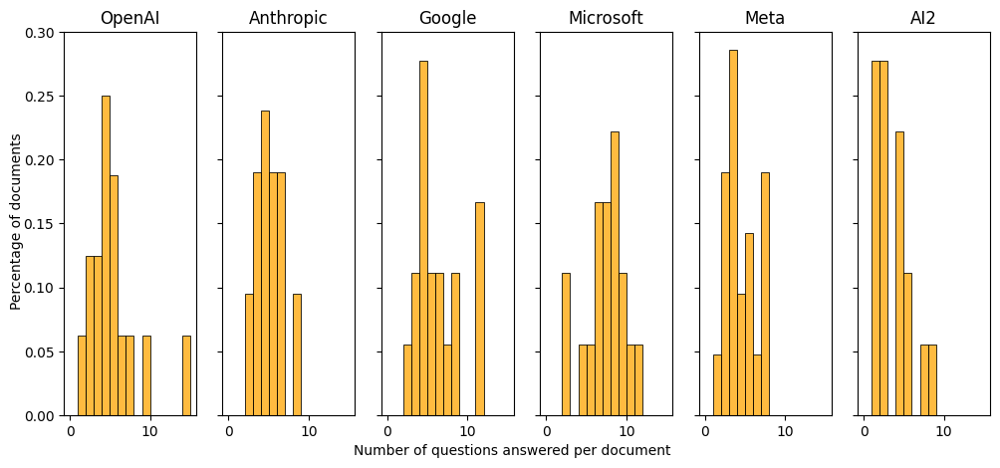

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

In [568]:
# types of documents


# Create figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1,6, figsize=(12, 5), sharex=True, sharey=True) 
ax_count = 0

for company in ["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]:
    subset_df = df[df.columns[df.loc["Company"].fillna("").str.contains(company)]]

    subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]

    subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
    
    subset_df_binary = subset_df.notna().astype(int)
    
    # Suppose df is your DataFrame with "yes" and NaN
    # Step 1: Count "yes" per column
    yes_counts = (subset_df_binary == 1).sum(axis=0)
    #print("Number of 'yes' per column:\n", yes_counts)
    #yes_counts_clean = yes_counts.dropna()  # remove NaNs

    #if len(yes_counts_clean) == 0:
    #    print(f"No valid 'yes' counts to plot for {doc_type}. Skipping...")
    #else:
    # Step 2b: Plot histogram of distribution of counts
    plt.figure(figsize=(8, 5))
    sns.histplot(yes_counts, bins=range(0, int(yes_counts.max(skipna=True)+2)), color="orange", ax=axes[ax_count], stat='probability')
    axes[ax_count].set_ylabel("")      # remove label
    
    axes[ax_count].set_title(company) #"Distribution of the number of answered questions per document")
    
    ax_count += 1
fig.text(0.5, 0.03, "Number of questions answered per document", ha="center")
fig.text(0.08, 0.5, "Percentage of documents", va="center", rotation="vertical")

#axes[ax_count-1].set_ylabel("Number of documents")
fig.savefig("plots/counts_disaggregated_companies_percentage.png", dpi=300, bbox_inches="tight")
#fig.close()

# Counts of questions answered (at the question level)

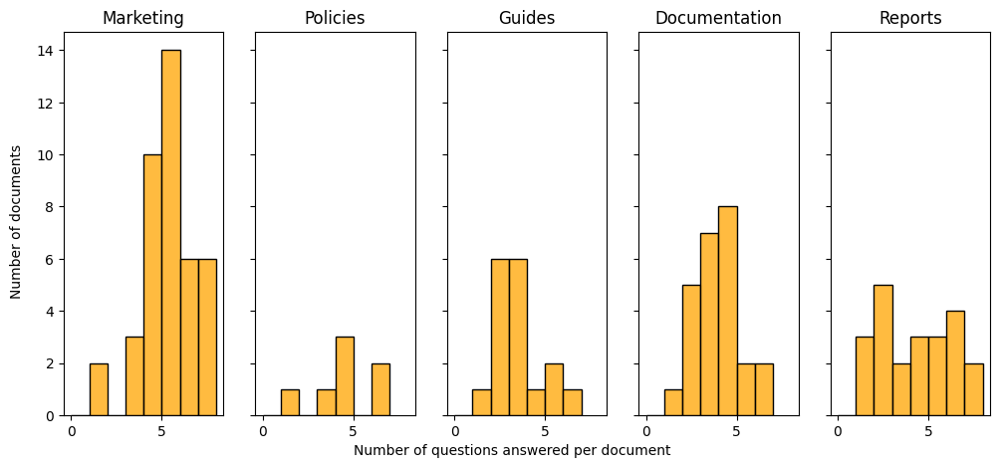

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

In [569]:


# Create figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1,5, figsize=(12, 5), sharex=True, sharey=True) 
ax_count = 0

for doc_type in ["Marketing", "Policies", "guides", "Model documentation", "Reports"]:
    subset_df = df[df.columns[df.loc["Document categorization"].fillna("").str.contains(doc_type)]]
    subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
    #print(subset_df.shape)
    subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]
    #print(subset_df)
    subset_df_binary = subset_df.notna().astype(int)

    group_ids = np.arange(len(subset_df_binary)) // 3

    # Step 3: group by the triplets and check if any value exists in each column
    merged_df = subset_df_binary.groupby(group_ids).any().astype(int)
    
    # Step 4 (optional): rename the merged rows
    merged_df.index = [f"group_{i+1}" for i in merged_df.index]
        
    # Suppose df is your DataFrame with "yes" and NaN
    # Step 1: Count "yes" per column
    yes_counts = (merged_df == 1).sum(axis=0)
    #print("Number of 'yes' per column:\n", yes_counts)
    #yes_counts_clean = yes_counts.dropna()  # remove NaNs

    #if len(yes_counts_clean) == 0:
    #    print(f"No valid 'yes' counts to plot for {doc_type}. Skipping...")
    #else:
    # Step 2b: Plot histogram of distribution of counts
    plt.figure(figsize=(8, 5))
    sns.histplot(yes_counts, bins=range(0, int(yes_counts.max(skipna=True)+2)), color="orange", ax=axes[ax_count])
    axes[ax_count].set_ylabel("")      # remove label
    if doc_type == "guides":
        doc_type = "Guides"
    if doc_type == "Model documentation":
        doc_type = "Documentation"
    axes[ax_count].set_title(doc_type) #"Distribution of the number of answered questions per document")
    
    ax_count += 1
fig.text(0.5, 0.03, "Number of questions answered per document", ha="center")
fig.text(0.08, 0.5, "Number of documents", va="center", rotation="vertical")

#axes[ax_count-1].set_ylabel("Number of documents")
fig.savefig("plots/counts_questions_documents_absolute.png", dpi=300, bbox_inches="tight")
#fig.close()

         OpenAI_marketing_1  OpenAI_marketing_2  OpenAI_marketing_3  \
group_1                   1                   1                   1   
group_2                   1                   1                   1   
group_3                   0                   1                   0   
group_4                   1                   1                   1   
group_5                   1                   1                   1   
group_6                   1                   1                   0   
group_7                   0                   1                   0   

         OpenAI_marketing_4  OpenAI_marketing_5  OpenAI_policy_3  Meta_3  \
group_1                   1                   1                1       1   
group_2                   0                   0                0       1   
group_3                   0                   0                0       0   
group_4                   1                   1                1       1   
group_5                   1                   1    

AttributeError: 'Figure' object has no attribute 'close'

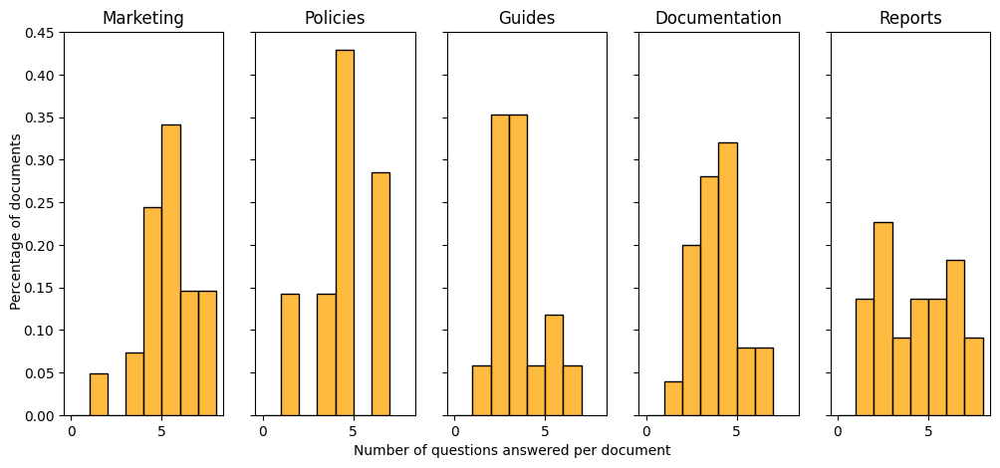

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

In [570]:


# Create figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1,5, figsize=(12, 5), sharex=True, sharey=True) 
ax_count = 0

for doc_type in ["Marketing", "Policies", "guides", "Model documentation", "Reports"]:
    subset_df = df[df.columns[df.loc["Document categorization"].fillna("").str.contains(doc_type)]]
    subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
    #print(subset_df.shape)
    subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]
    #print(subset_df)
    subset_df_binary = subset_df.notna().astype(int)

    group_ids = np.arange(len(subset_df_binary)) // 3

    # Step 3: group by the triplets and check if any value exists in each column
    merged_df = subset_df_binary.groupby(group_ids).any().astype(int)
    
    # Step 4 (optional): rename the merged rows
    merged_df.index = [f"group_{i+1}" for i in merged_df.index]
    
    print(merged_df)
    
    # Suppose df is your DataFrame with "yes" and NaN
    # Step 1: Count "yes" per column
    yes_counts = (merged_df == 1).sum(axis=0)
    #print("Number of 'yes' per column:\n", yes_counts)
    #yes_counts_clean = yes_counts.dropna()  # remove NaNs

    #if len(yes_counts_clean) == 0:
    #    print(f"No valid 'yes' counts to plot for {doc_type}. Skipping...")
    #else:
    # Step 2b: Plot histogram of distribution of counts
    plt.figure(figsize=(8, 5))
    sns.histplot(yes_counts, bins=range(0, int(yes_counts.max(skipna=True)+2)), color="orange", ax=axes[ax_count], stat='probability')
    axes[ax_count].set_ylabel("")      # remove label
    if doc_type == "guides":
        doc_type = "Guides"
    if doc_type == "Model documentation":
        doc_type = "Documentation"
    axes[ax_count].set_title(doc_type) #"Distribution of the number of answered questions per document")
    
    ax_count += 1
fig.text(0.5, 0.03, "Number of questions answered per document", ha="center")
fig.text(0.08, 0.5, "Percentage of documents", va="center", rotation="vertical")

#axes[ax_count-1].set_ylabel("Number of documents")
fig.savefig("plots/counts_questions_documents_percentage.png", dpi=300, bbox_inches="tight")
fig.close()

In [ ]:


# Create figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1,6, figsize=(12, 5), sharex=True, sharey=True) 
ax_count = 0

for company in ["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]:
    subset_df = df[df.columns[df.loc["Company"].fillna("").str.contains(company)]]
    subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
    subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]
    subset_df_binary = subset_df.notna().astype(int)

    group_ids = np.arange(len(subset_df_binary)) // 3

    merged_df = subset_df_binary.groupby(group_ids).any().astype(int)
    merged_df.index = [f"group_{i+1}" for i in merged_df.index]        
    yes_counts = (merged_df == 1).sum(axis=0)
    
    plt.figure(figsize=(8, 5))
    sns.histplot(yes_counts, bins=range(0, int(yes_counts.max(skipna=True)+2)), color="orange", ax=axes[ax_count])
    axes[ax_count].set_ylabel("")      # remove label
    if doc_type == "guides":
        doc_type = "Guides"
    axes[ax_count].set_title(company) #"Distribution of the number of answered questions per document")
    
    ax_count += 1
fig.text(0.5, 0.03, "Number of questions answered per document", ha="center")
fig.text(0.08, 0.5, "Number of documents", va="center", rotation="vertical")

#axes[ax_count-1].set_ylabel("Number of documents")
fig.savefig("plots/counts_aggregated_questions_companies_absolute.png", dpi=300, bbox_inches="tight")
#fig.close()

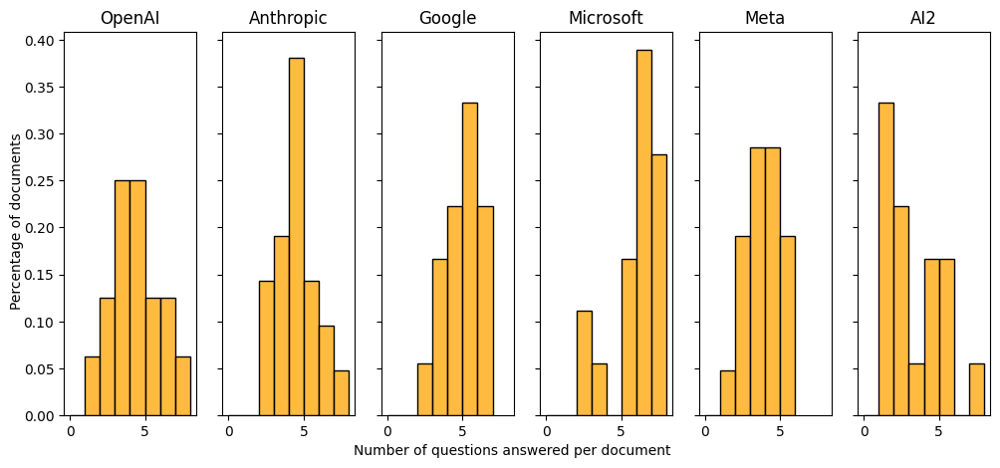

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

In [571]:


# Create figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1,6, figsize=(12, 5), sharex=True, sharey=True) 
ax_count = 0

for company in ["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]:
    subset_df = df[df.columns[df.loc["Company"].fillna("").str.contains(company)]]
    subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
    #print(subset_df.shape)
    subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]
    #print(subset_df)
    subset_df_binary = subset_df.notna().astype(int)

    group_ids = np.arange(len(subset_df_binary)) // 3

    # Step 3: group by the triplets and check if any value exists in each column
    merged_df = subset_df_binary.groupby(group_ids).any().astype(int)
    
    # Step 4 (optional): rename the merged rows
    merged_df.index = [f"group_{i+1}" for i in merged_df.index]
        
    # Suppose df is your DataFrame with "yes" and NaN
    # Step 1: Count "yes" per column
    yes_counts = (merged_df == 1).sum(axis=0)
    #print("Number of 'yes' per column:\n", yes_counts)
    #yes_counts_clean = yes_counts.dropna()  # remove NaNs

    #if len(yes_counts_clean) == 0:
    #    print(f"No valid 'yes' counts to plot for {doc_type}. Skipping...")
    #else:
    # Step 2b: Plot histogram of distribution of counts
    plt.figure(figsize=(8, 5))
    sns.histplot(yes_counts, bins=range(0, int(yes_counts.max(skipna=True)+2)), stat='probability', color="orange", ax=axes[ax_count])
    axes[ax_count].set_ylabel("")      # remove label
    if doc_type == "guides":
        doc_type = "Guides"
    axes[ax_count].set_title(company) #"Distribution of the number of answered questions per document")
    
    ax_count += 1
fig.text(0.5, 0.03, "Number of questions answered per document", ha="center")
fig.text(0.08, 0.5, "Percentage of documents", va="center", rotation="vertical")

#axes[ax_count-1].set_ylabel("Number of documents")
fig.savefig("plots/counts_questions_companies_percentage.png", dpi=300, bbox_inches="tight")
#fig.close()

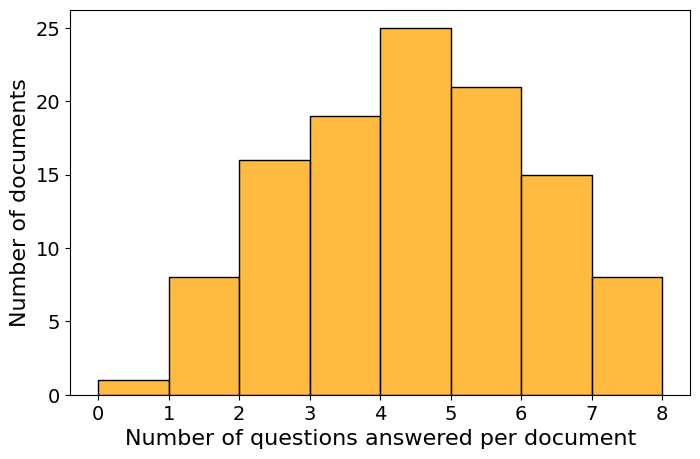

In [572]:


subset_df = df.copy()
subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]
subset_df_binary = subset_df.notna().astype(int)

group_ids = np.arange(len(subset_df_binary)) // 3

# Step 3: group by the triplets and check if any value exists in each column
merged_df = subset_df_binary.groupby(group_ids).any().astype(int)
    
# Step 4 (optional): rename the merged rows
merged_df.index = [f"group_{i+1}" for i in merged_df.index]
        
# Suppose df is your DataFrame with "yes" and NaN
# Step 1: Count "yes" per column
yes_counts = (merged_df == 1).sum(axis=0)
# Step 2b: Plot histogram of distribution of counts
plt.figure(figsize=(8, 5))
sns.histplot(yes_counts, bins=range(0, int(yes_counts.max(skipna=True)+2)), color="orange")
if doc_type == "guides":
    doc_type = "Guides"
if doc_type == "Model documentation":
    doc_type = "Documentation"
#    axes[ax_count].set_title(doc_type) #"Distribution of the number of answered questions per document")
plt.ylabel("Number of documents",fontsize=16)      # remove label
plt.xlabel("Number of questions answered per document",fontsize=16)    
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.savefig("plots/counts_questions_documents_absolute_aggregated.png", dpi=300, bbox_inches="tight")


# Create plots aggregated at the question level

In [573]:
def map_question_reporting_standard(row_label, df, totals):
    print(row_label)

    format_dict = {"OpenAI": 0, "Anthropic":0, "Meta":0, "Microsoft":0, "Google":0, "AI2":0,\
                 "Marketing materials": 0, "Reports":0, "Model documentation":0, "Policies":0, "Developer guides":0}
    
    start_idx = df.index.get_loc(row_label)
    # Get that row and the next three
    subset = df.iloc[start_idx+1:start_idx + 16]

    dict_to_populate = {row_label: copy.deepcopy(format_dict)}

    
    for column_name in df.columns:
        if "LLM" not in column_name:
            if "Anthropic_21" not in column_name:
                if "Anthropic_16" not in column_name:
                    if "AI2_6" not in column_name:
                        if "AI2_7" not in column_name:
                            document_type = df[column_name]["Document categorization"]
                            company = df[column_name]["Company"]
                            information_actual = subset[column_name].loc["actual"]
                            information_potential = subset[column_name].loc["potential"]
                            information_projected = subset[column_name].loc["projected"]
                            if (not pd.isna(information_actual)) or (not pd.isna(information_potential)) or (not pd.isna(information_projected)):
                                dict_to_populate[row_label][company] += 1
                                dict_to_populate[row_label][document_type] += 1
                            
    for elem in dict_to_populate:
        for index in dict_to_populate[elem]:
            dict_to_populate[elem][index] = round(dict_to_populate[elem][index] / totals[index], 2)
        
    return dict_to_populate




list_useQuestions = ["Who uses it?",  "Where do users use it?", "What do users use it for?",\
                     "How do users use it?" , "When do users use it?", "Why do users use it?"]  
count_dictionary = {}
for row_label in list_useQuestions:
    count_dictionary[row_label] = map_question_reporting_standard(row_label, df, totals)


Who uses it?
Where do users use it?
What do users use it for?
How do users use it?
When do users use it?
Why do users use it?


In [574]:
# Flatten the nested structure into a single dictionary
flat = {outer_k: list(inner_v.values())[0] for outer_k, inner_v in count_dictionary.items()}

# Convert to DataFrame
df_counts = pd.DataFrame.from_dict(flat, orient='index')

df_counts.index = [
    "Who?",
    "Where?",
    "What for?",
    "How?",
    "When?",
    "Why?",
]

In [575]:


new_order = [
    "Who?",
    "Where?",
    "When?",
     "Why?",
    "What for?",
    "How?"
]

df_counts = df_counts.loc[new_order]

df_counts = df_counts.rename(columns={
    "Marketing materials": "Marketing",
    "Developer guides": "Guides",
    "Model documentation" : "Documentation"
})

In [576]:
def plotIncludingStatistics2(df_main, file_name, **kwargs):
    
    # Compute row mean & std
    df_mean = df_main.mean(axis=1)
    df_std = df_main.std(axis=1)
    
    fig = plt.figure(figsize=(10, 6))
    # --- Axis Layout ---
    # [left, bottom, width, height]
    ax_main = fig.add_axes([0.05, 0.1, 0.55, 0.8])      # big heatmap
    ax_mean = fig.add_axes([0.64, 0.1, 0.10, 0.8])      # mean heatmap
    ax_std  = fig.add_axes([0.76, 0.1, 0.10, 0.8])      # std heatmap
    # --- Main heatmap ---
    sns.heatmap(df_main, ax=ax_main, **kwargs)
    ax_main.set_ylabel("")
    ax_main.tick_params(axis='y', labelleft=True)  # hide left labels (we will add our own right labels)
    # --- Mean heatmap ---
    sns.heatmap(df_mean.to_frame(name="mean"),
                annot=True, cmap="YlGnBu",  cbar=False, ax=ax_mean) #fmt=".2f",cmap="Greens",
    ax_mean.set_ylabel("")
    ax_mean.tick_params(axis='y', labelleft=True)  # hide left labels (we will add our own right labels)
    # --- Std heatmap ---
    sns.heatmap(df_std.to_frame(name="std"),
                annot=True,  cmap="Oranges", cbar=True, ax=ax_std) #fmt=".2f",
    ax_std.set_ylabel("")
    ax_std.set_yticks([])
    fig.savefig(file_name, dpi=300, bbox_inches="tight")
    plt.close()

In [577]:
plt.figure(figsize=(12, 8))  # adjust size as needed
sns.heatmap(df_counts[["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]]*100, annot=True, cmap="YlGnBu", cbar=True)
plt.savefig("plots/heatmap_questions_companies.png", dpi=300, bbox_inches="tight")
plt.close()

df_main = df_counts[["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]].copy() *100
plotIncludingStatistics2(df_main, "plots/heatmap_questions_statistics_companies.png",\
                        annot=True,  cmap="YlGnBu", cbar=True)

# plot the heatmap of questions / company as a binary
df_binary = (df_counts[["OpenAI", "Anthropic", "Google", "Microsoft", "Meta", "AI2"]] > 0).astype(int)
sns.heatmap(
    df_binary,
    annot=False,
    fmt="d",
    cmap="YlGnBu",
    cbar=False,
    linewidths=0.5,
    linecolor="white"
)
plt.savefig("plots/heatmap_questions_companies_binary.png", dpi=300, bbox_inches="tight")
plt.close()

plt.figure(figsize=(12, 8))  # adjust size as needed
sns.heatmap(df_counts[["Marketing", "Policies", "Guides", "Documentation", "Reports"]]*100, annot=True, cmap="YlGnBu", cbar=True)
plt.savefig("plots/heatmap_questions_documents.png", dpi=300, bbox_inches="tight")
plt.close()
df_main = df_counts[["Marketing", "Policies", "Guides", "Documentation", "Reports"]].copy() * 100
plotIncludingStatistics2(df_main, "plots/heatmap_questions_statistics_documents.png",\
                        annot=True, cmap="YlGnBu", cbar=True)

# Create plots aggregated at the temporality level

In [578]:
def map_temporality_reporting_standard(row_label, df, totals):
    print(row_label)

    format_dict = {"OpenAI": 0, "Anthropic":0, "Meta":0, "Microsoft":0, "Google":0, "AI2":0,\
                 "Marketing materials": 0, "Reports":0, "Model documentation":0, "Policies":0, "Developer guides":0}
    
    subset = df[df.index == row_label]
    binary_cols = subset.notna().any(axis=0).astype(int)

    dict_to_populate = {row_label: copy.deepcopy(format_dict)}

    for column_name in df.columns:
        if "LLM" not in column_name:
            if "Anthropic_21" not in column_name:
                if "Anthropic_16" not in column_name:
                    if "AI2_6" not in column_name:
                        if "AI2_7" not in column_name:
                            document_type = df[column_name]["Document categorization"]
                            company = df[column_name]["Company"]
                            if binary_cols[column_name] > 0:
                                dict_to_populate[row_label][company] += 1
                                dict_to_populate[row_label][document_type] += 1
                            
    for elem in dict_to_populate:
        for index in dict_to_populate[elem]:
            dict_to_populate[elem][index] = round(dict_to_populate[elem][index] / totals[index], 2)
        
    return dict_to_populate




list_temporality = ["actual",  "potential", "projected"]  
count_dictionary = {}
for row_label in list_temporality:
    count_dictionary[row_label] = map_temporality_reporting_standard(row_label, df, totals)


actual
potential
projected


In [579]:
# Flatten the nested structure into a single dictionary
flat = {outer_k: list(inner_v.values())[0] for outer_k, inner_v in count_dictionary.items()}

# Convert to DataFrame
df_counts = pd.DataFrame.from_dict(flat, orient='index')

df_counts = df_counts.rename(columns={
    "Marketing materials": "Marketing",
    "Developer guides": "Guides",
    "Model documentation": "Documentation"
})

In [580]:
def plotIncludingStatistics3(df_main, file_name, **kwargs):
    
    # Compute row mean & std
    df_mean = df_main.mean(axis=1)
    df_std = df_main.std(axis=1)
    
    fig = plt.figure(figsize=(10, 4))
    # --- Axis Layout ---
    # [left, bottom, width, height]
    ax_main = fig.add_axes([0.05, 0.1, 0.55, 0.8])      # big heatmap
    ax_mean = fig.add_axes([0.64, 0.1, 0.10, 0.8])      # mean heatmap
    ax_std  = fig.add_axes([0.76, 0.1, 0.10, 0.8])      # std heatmap
    # --- Main heatmap ---
    sns.heatmap(df_main, ax=ax_main, **kwargs)
    ax_main.set_ylabel("")
    ax_main.tick_params(axis='y', labelleft=True)  # hide left labels (we will add our own right labels)
    # --- Mean heatmap ---
    sns.heatmap(df_mean.to_frame(name="mean"),
                annot=True, cmap="YlGnBu",  cbar=False, ax=ax_mean) #fmt=".2f",cmap="Greens",
    ax_mean.set_ylabel("")
    ax_mean.tick_params(axis='y', labelleft=True)  # hide left labels (we will add our own right labels)
    # --- Std heatmap ---
    sns.heatmap(df_std.to_frame(name="std"),
                annot=True,  cmap="Oranges", cbar=True, ax=ax_std) #fmt=".2f",
    ax_std.set_ylabel("")
    ax_std.set_yticks([])
    fig.savefig(file_name, dpi=300, bbox_inches="tight")
    plt.close()

In [581]:
plt.figure(figsize=(12, 8))  # adjust size as needed
sns.heatmap(df_counts[["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]]*100, annot=True,  cmap="YlGnBu", cbar=True)
plt.savefig("plots/heatmap_temporality_companies.png", dpi=300, bbox_inches="tight")
plt.close()

df_main =df_counts[["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]].copy()*100
plotIncludingStatistics3(df_main, "plots/heatmap_temporality_statistics_companies.png",\
                        annot=True,  cmap="YlGnBu", cbar=True)

# plot the heatmap of questions / company as a binary

df_binary = (df_counts[["OpenAI", "Anthropic", "Google", "Microsoft", "Meta", "AI2"]] > 0).astype(int)
sns.heatmap(
    df_binary,
    annot=False,
    fmt="d",
    cmap="YlGnBu",
    cbar=False,
    linewidths=0.5,
    linecolor="white"
)
plt.savefig("plots/heatmap_temporality_companies_binary.png", dpi=300, bbox_inches="tight")
plt.close()

plt.figure(figsize=(12, 8))  # adjust size as needed
sns.heatmap(df_counts[["Marketing", "Policies", "Guides", "Documentation", "Reports"]]*100, annot=True, cmap="YlGnBu", cbar=True)
plt.savefig("plots/heatmap_temporality_documents.png", dpi=300, bbox_inches="tight")
plt.close()
df_main =df_counts[["Marketing", "Policies", "Guides", "Documentation", "Reports"]].copy()*100
plotIncludingStatistics3(df_main, "plots/heatmap_temporality_statistics_documents.png",\
                        annot=True,  cmap="YlGnBu", cbar=True)

# Additional miscallenaous plots

In [582]:
def map_question_reporting_standard(row_label, df, totals):
    print(row_label)

    
    start_idx = df.index.get_loc(row_label)
    # Get that row and the next three
    subset = df.iloc[start_idx+1:start_idx + 16]

    dict_to_populate = {"_count": 0,\
                    "_actual": 0, \
                       "_potential": 0, \
                        "_projected": 0}

    
    for column_name in df.columns:
        if "LLM" not in column_name:
            if "Anthropic_21" not in column_name:
                if "Anthropic_16" not in column_name:
                    if "AI2_6" not in column_name:
                        if "AI2_7" not in column_name:
                            information_actual = subset[column_name].loc["actual"]
                            information_potential = subset[column_name].loc["potential"]
                            information_projected = subset[column_name].loc["projected"]
                            if (not pd.isna(information_actual)) or (not pd.isna(information_potential)) or (not pd.isna(information_projected)):
                                dict_to_populate["_count"] += 1
                                if not pd.isna(information_actual):
                                    dict_to_populate["_actual"] += 1
                                if not pd.isna(information_potential):
                                    dict_to_populate["_potential"] += 1
                                if not pd.isna(information_projected):
                                    dict_to_populate["_projected"] += 1

   
    dict_to_populate["_actual"] = round(dict_to_populate["_actual"] / dict_to_populate["_count"], 2)
    dict_to_populate["_potential"] = round(dict_to_populate["_potential"] / dict_to_populate["_count"], 2)
    dict_to_populate["_projected"] = round(dict_to_populate["_projected"] / dict_to_populate["_count"], 2)
        
    return dict_to_populate




list_useQuestions = ["Which genAI do users use?", "Who uses it?",  "Where do users use it?",  "When do users use it?",\
                     "Why do users use it?", "What do users use it for?",\
                     "How do users use it?" ] #, 
count_dictionary = {}
for row_label in list_useQuestions:
    count_dictionary[row_label] = map_question_reporting_standard(row_label, df, totals)


Which genAI do users use?
Who uses it?
Where do users use it?
When do users use it?
Why do users use it?
What do users use it for?
How do users use it?


In [583]:
df_counts = pd.DataFrame(count_dictionary).T * 100
df_counts.columns = ["count", "actual", "potential", "projected"]

plt.figure(figsize=(5, 5))  # adjust size as needed
sns.heatmap(df_counts[["actual", "potential", "projected"]], annot=True,  cmap="YlGnBu", cbar=True)
plt.savefig("plots/heatmap_temporality_questions_all.png", dpi=300, bbox_inches="tight")
plt.close()

df_main = df_counts[["actual", "potential", "projected"]].copy()
plotIncludingStatistics2(df_main, "plots/heatmap_temporality_statistics_questions_all.png",\
                        annot=True, cmap="YlGnBu", cbar=True)

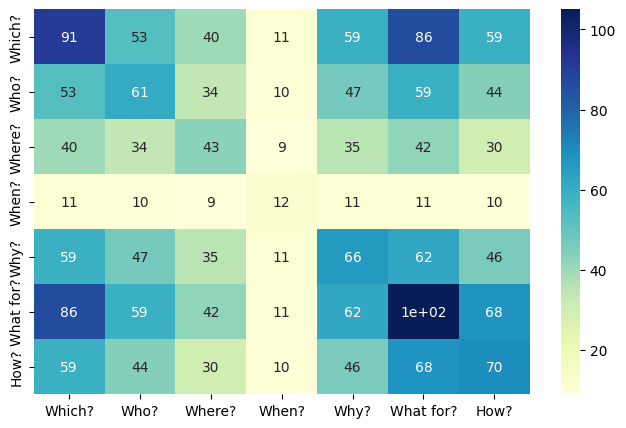

In [584]:
## Co-occurence matrix across all documents

subset_df = df.loc[:, ~df.columns.str.contains("_LLM")]
subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]
subset_df_binary = subset_df.notna().astype(int)

group_ids = np.arange(len(subset_df_binary)) // 3

# Step 3: group by the triplets and check if any value exists in each column
merged_df = subset_df_binary.groupby(group_ids).any().astype(int)
names = ["Which?", "Who?", "Where?", "Why?", "What for?", "How?", "When?"]
merged_df.index = names
    
new_order = [
        "Which?",
        "Who?",
        "Where?",
        "When?",
         "Why?",
        "What for?",
        "How?"
    ]
merged_df = merged_df.loc[new_order]
        
cooccurrence = merged_df.dot(merged_df.T)
  
plt.figure(figsize=(8, 5))
sns.heatmap(cooccurrence, annot=True, cmap="YlGnBu")

plt.savefig("plots/cooccurence_questions_all_absolute.png", dpi=300, bbox_inches="tight")
#fig.close()

           Which?   Who?  Where?  When?   Why?  What for?   How?
Which?      100.0   58.0    44.0   12.0   65.0       95.0   65.0
Who?         87.0  100.0    56.0   16.0   77.0       97.0   72.0
Where?       93.0   79.0   100.0   21.0   81.0       98.0   70.0
When?        92.0   83.0    75.0  100.0   92.0       92.0   83.0
Why?         89.0   71.0    53.0   17.0  100.0       94.0   70.0
What for?    82.0   56.0    40.0   10.0   59.0      100.0   65.0
How?         84.0   63.0    43.0   14.0   66.0       97.0  100.0


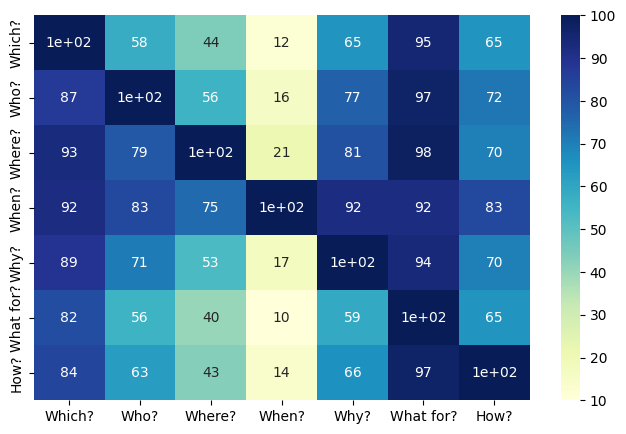

In [585]:
## Co-occurence matrix

subset_df = df.loc[:, ~df.columns.str.contains("_LLM")]
subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]
subset_df_binary = subset_df.notna().astype(int)

group_ids = np.arange(len(subset_df_binary)) // 3

merged_df = subset_df_binary.groupby(group_ids).any().astype(int)

names = ["Which?", "Who?", "Where?", "Why?", "What for?", "How?", "When?"]
merged_df.index = names

new_order = [
        "Which?",
        "Who?",
        "Where?",
        "When?",
         "Why?",
        "What for?",
        "How?"
    ]
merged_df = merged_df.loc[new_order]
        
    
cooccurrence = merged_df.dot(merged_df.T)
cooccurrence_normalized = cooccurrence.div(cooccurrence.max(axis=1), axis=0)
cooccurrence_normalized  = cooccurrence_normalized.round(2)*100
print(cooccurrence_normalized)
    
# Step 2b: Plot histogram of distribution of counts
plt.figure(figsize=(8, 5))
sns.heatmap(cooccurrence_normalized, annot=True, cmap="YlGnBu")

plt.savefig("plots/cooccurence_questions_all_percentage.png", dpi=300, bbox_inches="tight")
#fig.close()

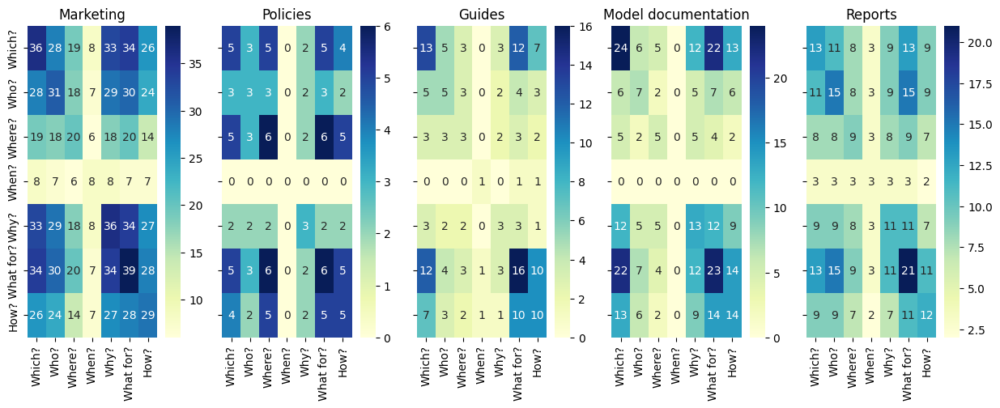

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

In [586]:
## Co-occurence matrix per type of document


# Create figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1,5, figsize=(15, 5), sharex=True, sharey=True) 
ax_count = 0

for doc_type in ["Marketing", "Policies", "guides", "Model documentation", "Reports"]:
    subset_df = df[df.columns[df.loc["Document categorization"].fillna("").str.contains(doc_type)]]
    subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
    #print(subset_df.shape)
    subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]
    #print(subset_df)
    subset_df_binary = subset_df.notna().astype(int)

    group_ids = np.arange(len(subset_df_binary)) // 3

    # Step 3: group by the triplets and check if any value exists in each column
    merged_df = subset_df_binary.groupby(group_ids).any().astype(int)

    names = ["Which?", "Who?", "Where?", "Why?", "What for?", "How?", "When?"]
    merged_df.index = names
    
    new_order = [
        "Which?",
        "Who?",
        "Where?",
        "When?",
         "Why?",
        "What for?",
        "How?"
    ]
    merged_df = merged_df.loc[new_order]
        
    cooccurrence = merged_df.dot(merged_df.T)
    #row_sums = cooccurrence.sum(axis=1)  # sum over each row
    #cooccurrence_normalized = cooccurrence.div(row_sums, axis=0)
    
    # Step 2b: Plot histogram of distribution of counts
    plt.figure(figsize=(8, 5))
    sns.heatmap(cooccurrence, annot=True, cmap="YlGnBu", ax=axes[ax_count])

    #sns.histplot(yes_counts, bins=range(0, int(yes_counts.max(skipna=True)+2)), color="orange", ax=axes[ax_count])
    axes[ax_count].set_ylabel("")      # remove label
    if doc_type == "guides":
        doc_type = "Guides"
    axes[ax_count].set_title(doc_type) #"Distribution of the number of answered questions per document")
    
    ax_count += 1
#fig.text(0.5, 0.03, "Number of questions answered per document", ha="center")
#fig.text(0.08, 0.5, "Number of documents", va="center", rotation="vertical")

#axes[ax_count-1].set_ylabel("Number of documents")
fig.savefig("plots/cooccurence_questions_documents_absolute.png", dpi=300, bbox_inches="tight")
#fig.close()

           Which?  Who?  Where?  When?  Why?  What for?  How?
Which?       1.00  0.78    0.53   0.22  0.92       0.94  0.72
Who?         0.90  1.00    0.58   0.23  0.94       0.97  0.77
Where?       0.95  0.90    1.00   0.30  0.90       1.00  0.70
When?        1.00  0.88    0.75   1.00  1.00       0.88  0.88
Why?         0.92  0.81    0.50   0.22  1.00       0.94  0.75
What for?    0.87  0.77    0.51   0.18  0.87       1.00  0.72
How?         0.90  0.83    0.48   0.24  0.93       0.97  1.00
           Which?  Who?  Where?  When?  Why?  What for?  How?
Which?       1.00  0.60    1.00    0.0  0.40       1.00  0.80
Who?         1.00  1.00    1.00    0.0  0.67       1.00  0.67
Where?       0.83  0.50    1.00    0.0  0.33       1.00  0.83
When?         NaN   NaN     NaN    NaN   NaN        NaN   NaN
Why?         0.67  0.67    0.67    0.0  1.00       0.67  0.67
What for?    0.83  0.50    1.00    0.0  0.33       1.00  0.83
How?         0.80  0.40    1.00    0.0  0.40       1.00  1.00
        

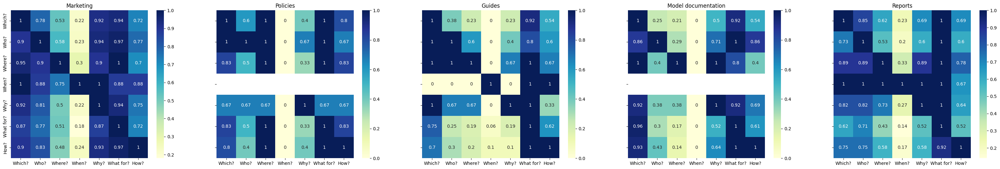

<Figure size 900x600 with 0 Axes>

<Figure size 900x600 with 0 Axes>

<Figure size 900x600 with 0 Axes>

<Figure size 900x600 with 0 Axes>

<Figure size 900x600 with 0 Axes>

In [587]:
## Co-occurence matrix



# Create figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1,5, figsize=(40, 6), sharex=True, sharey=True) 
ax_count = 0

for doc_type in ["Marketing", "Policies", "guides", "Model documentation", "Reports"]:
    subset_df = df[df.columns[df.loc["Document categorization"].fillna("").str.contains(doc_type)]]
    subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
    #print(subset_df.shape)
    subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]
    #print(subset_df)
    subset_df_binary = subset_df.notna().astype(int)

    group_ids = np.arange(len(subset_df_binary)) // 3

    # Step 3: group by the triplets and check if any value exists in each column
    merged_df = subset_df_binary.groupby(group_ids).any().astype(int)

    names = ["Which?", "Who?", "Where?", "Why?", "What for?", "How?", "When?"]
    merged_df.index = names

    new_order = [
        "Which?",
        "Who?",
        "Where?",
        "When?",
         "Why?",
        "What for?",
        "How?"
    ]
    merged_df = merged_df.loc[new_order]
        
    
    cooccurrence = merged_df.dot(merged_df.T)
    #row_sums = cooccurrence.sum(axis=1)  # sum over each row
    #cooccurrence_normalized = cooccurrence.div(row_sums, axis=0)
    cooccurrence_normalized = cooccurrence.div(cooccurrence.max(axis=1), axis=0)
    cooccurrence_normalized  = cooccurrence_normalized.round(2)
    print(cooccurrence_normalized)
    
    # Step 2b: Plot histogram of distribution of counts
    plt.figure(figsize=(9, 6))
    sns.heatmap(cooccurrence_normalized, annot=True, cmap="YlGnBu", ax=axes[ax_count])

    #sns.histplot(yes_counts, bins=range(0, int(yes_counts.max(skipna=True)+2)), color="orange", ax=axes[ax_count])
    axes[ax_count].set_ylabel("")      # remove label
    if doc_type == "guides":
        doc_type = "Guides"
    axes[ax_count].set_title(doc_type) #"Distribution of the number of answered questions per document")
    
    ax_count += 1
#fig.text(0.5, 0.03, "Number of questions answered per document", ha="center")
#fig.text(0.08, 0.5, "Number of documents", va="center", rotation="vertical")

#axes[ax_count-1].set_ylabel("Number of documents")
fig.savefig("plots/cooccurence_questions_documents_percentage.png", dpi=300, bbox_inches="tight")
#fig.close()

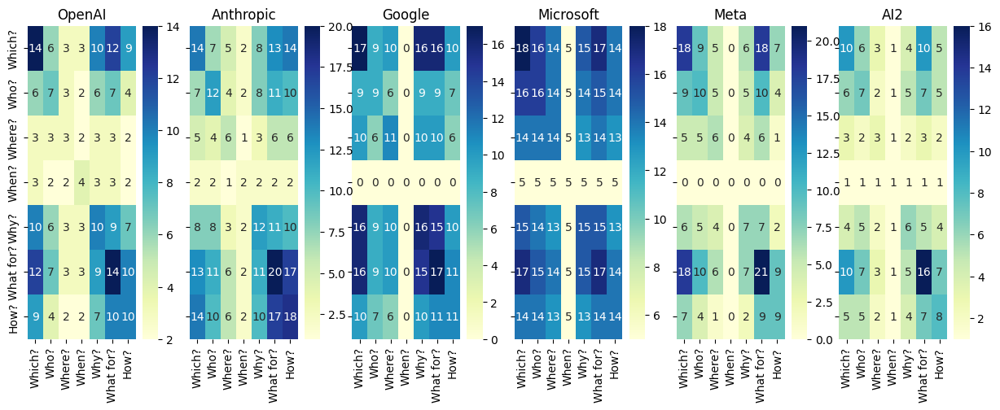

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

In [588]:
## Co-occurence matrix



# Create figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1,6, figsize=(15, 5), sharex=True, sharey=True) 
ax_count = 0

for company in ["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]:
    subset_df = df[df.columns[df.loc["Company"].fillna("").str.contains(company)]]
    subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
    #print(subset_df.shape)
    subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]
    #print(subset_df)
    subset_df_binary = subset_df.notna().astype(int)

    group_ids = np.arange(len(subset_df_binary)) // 3

    # Step 3: group by the triplets and check if any value exists in each column
    merged_df = subset_df_binary.groupby(group_ids).any().astype(int)

    names = ["Which?", "Who?", "Where?", "Why?", "What for?", "How?", "When?"]
    merged_df.index = names
    
    new_order = [
        "Which?",
        "Who?",
        "Where?",
        "When?",
         "Why?",
        "What for?",
        "How?"
    ]
    merged_df = merged_df.loc[new_order]
        
    cooccurrence = merged_df.dot(merged_df.T)
    #row_sums = cooccurrence.sum(axis=1)  # sum over each row
    #cooccurrence_normalized = cooccurrence.div(row_sums, axis=0)
    
    # Step 2b: Plot histogram of distribution of counts
    plt.figure(figsize=(8, 5))
    sns.heatmap(cooccurrence, annot=True, cmap="YlGnBu", ax=axes[ax_count])

    #sns.histplot(yes_counts, bins=range(0, int(yes_counts.max(skipna=True)+2)), color="orange", ax=axes[ax_count])
    axes[ax_count].set_ylabel("")      # remove label
    if doc_type == "guides":
        doc_type = "Guides"
    axes[ax_count].set_title(company) #"Distribution of the number of answered questions per document")
    
    ax_count += 1
#fig.text(0.5, 0.03, "Number of questions answered per document", ha="center")
#fig.text(0.08, 0.5, "Number of documents", va="center", rotation="vertical")

#axes[ax_count-1].set_ylabel("Number of documents")
fig.savefig("plots/cooccurence_questions_companies_absolute.png", dpi=300, bbox_inches="tight")
#fig.close()

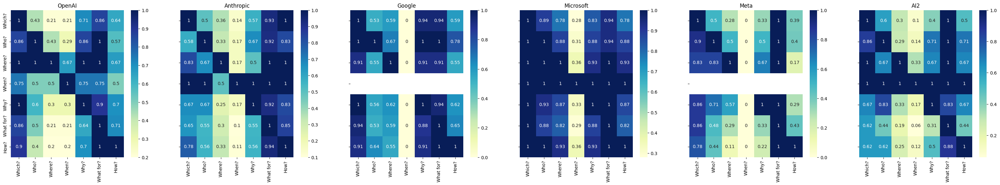

<Figure size 900x600 with 0 Axes>

<Figure size 900x600 with 0 Axes>

<Figure size 900x600 with 0 Axes>

<Figure size 900x600 with 0 Axes>

<Figure size 900x600 with 0 Axes>

<Figure size 900x600 with 0 Axes>

In [589]:
## Co-occurence matrix



# Create figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1,6, figsize=(40, 6), sharex=True, sharey=True) 
ax_count = 0

for company in ["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]:
    subset_df = df[df.columns[df.loc["Company"].fillna("").str.contains(company)]]
    subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
    #print(subset_df.shape)
    subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]
    #print(subset_df)
    subset_df_binary = subset_df.notna().astype(int)

    group_ids = np.arange(len(subset_df_binary)) // 3

    # Step 3: group by the triplets and check if any value exists in each column
    merged_df = subset_df_binary.groupby(group_ids).any().astype(int)

    names = ["Which?", "Who?", "Where?", "Why?", "What for?", "How?", "When?"]
    merged_df.index = names
    
    new_order = [
        "Which?",
        "Who?",
        "Where?",
        "When?",
         "Why?",
        "What for?",
        "How?"
    ]
    merged_df = merged_df.loc[new_order]
        
    cooccurrence = merged_df.dot(merged_df.T)
    cooccurrence_normalized = cooccurrence.div(cooccurrence.max(axis=1), axis=0)
    cooccurrence_normalized  = cooccurrence_normalized.round(2)
    
    # Step 2b: Plot histogram of distribution of counts
    plt.figure(figsize=(9, 6))
    sns.heatmap(cooccurrence_normalized, annot=True, cmap="YlGnBu", ax=axes[ax_count])

    #sns.histplot(yes_counts, bins=range(0, int(yes_counts.max(skipna=True)+2)), color="orange", ax=axes[ax_count])
    axes[ax_count].set_ylabel("")      # remove label
    if doc_type == "guides":
        doc_type = "Guides"
    axes[ax_count].set_title(company) #"Distribution of the number of answered questions per document")
    
    ax_count += 1
#fig.text(0.5, 0.03, "Number of questions answered per document", ha="center")
#fig.text(0.08, 0.5, "Number of documents", va="center", rotation="vertical")

#axes[ax_count-1].set_ylabel("Number of documents")
fig.savefig("plots/cooccurence_questions_companies_percentage.png", dpi=300, bbox_inches="tight")
#fig.close()

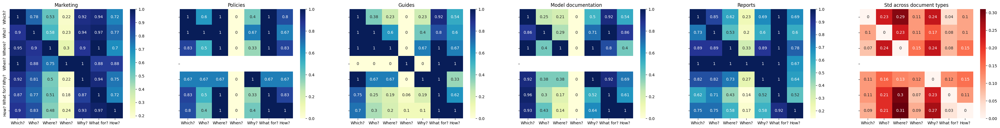

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

In [590]:
## Co-occurence matrix



# Create figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1,6, figsize=(45, 5), sharex=True, sharey=True) 
ax_count = 0

cooccurrence_matrices = []

for doc_type in ["Marketing", "Policies", "guides", "Model documentation", "Reports"]:
    subset_df = df[df.columns[df.loc["Document categorization"].fillna("").str.contains(doc_type)]]
    subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
    #print(subset_df.shape)
    subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]
    #print(subset_df)
    subset_df_binary = subset_df.notna().astype(int)

    group_ids = np.arange(len(subset_df_binary)) // 3

    # Step 3: group by the triplets and check if any value exists in each column
    merged_df = subset_df_binary.groupby(group_ids).any().astype(int)

    names = ["Which?", "Who?", "Where?", "Why?", "What for?", "How?", "When?"]
    merged_df.index = names

    new_order = [
        "Which?",
        "Who?",
        "Where?",
        "When?",
         "Why?",
        "What for?",
        "How?"
    ]
    merged_df = merged_df.loc[new_order]
        
    
    cooccurrence = merged_df.dot(merged_df.T)
    #row_sums = cooccurrence.sum(axis=1)  # sum over each row
    #cooccurrence_normalized = cooccurrence.div(row_sums, axis=0)
    cooccurrence_normalized = cooccurrence.div(cooccurrence.max(axis=1), axis=0)
    cooccurrence_normalized  = cooccurrence_normalized.round(2)
    cooccurrence_matrices.append(cooccurrence_normalized)

    
    # Step 2b: Plot histogram of distribution of counts
    plt.figure(figsize=(8, 5))
    sns.heatmap(cooccurrence_normalized, annot=True, cmap="YlGnBu", ax=axes[ax_count])

    #sns.histplot(yes_counts, bins=range(0, int(yes_counts.max(skipna=True)+2)), color="orange", ax=axes[ax_count])
    axes[ax_count].set_ylabel("")      # remove label
    if doc_type == "guides":
        doc_type = "Guides"
    axes[ax_count].set_title(doc_type) #"Distribution of the number of answered questions per document")
    
    ax_count += 1

stacked = np.stack([m.values for m in cooccurrence_matrices])

# Compute std across companies (axis=0)
std_matrix = np.std(stacked, axis=0)

# Back to DataFrame for plotting
std_df = pd.DataFrame(
    std_matrix,
    index=cooccurrence_matrices[0].index,
    columns=cooccurrence_matrices[0].columns
).round(2)
sns.heatmap(
    std_df,
    annot=True,
    cmap="Reds",
    ax=axes[5],
    cbar=True
)

axes[5].set_title("Std across document types")
axes[5].set_ylabel("")


fig.savefig("plots/cooccurence_questions_documents_percentage.png", dpi=300, bbox_inches="tight")
#fig.close()

In [591]:


# Create figure with 2 rows, 3 columns of subplots
fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharex=True, sharey=True)  # adjust figsize
axes = axes.flatten()  # flatten for easy indexing

ax_count = 0
cooccurrence_matrices = []

for doc_type in ["Marketing", "Policies", "guides", "Model documentation", "Reports"]:
    subset_df = df[df.columns[df.loc["Document categorization"].fillna("").str.contains(doc_type)]]
    subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
    subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]
    subset_df_binary = subset_df.notna().astype(int)

    group_ids = np.arange(len(subset_df_binary)) // 3
    merged_df = subset_df_binary.groupby(group_ids).any().astype(int)

    names = ["Which?", "Who?", "Where?", "Why?", "What for?", "How?", "When?"]
    merged_df.index = names

    new_order = ["Which?", "Who?", "Where?", "When?", "Why?", "What for?", "How?"]
    merged_df = merged_df.loc[new_order]
        
    cooccurrence = merged_df.dot(merged_df.T)
    cooccurrence_normalized = cooccurrence.div(cooccurrence.max(axis=1), axis=0).round(2) *100
    cooccurrence_matrices.append(cooccurrence_normalized)

    # Plot heatmap in the appropriate subplot
    sns.heatmap(cooccurrence_normalized, annot=True, cmap="YlGnBu", ax=axes[ax_count])
    axes[ax_count].set_ylabel("")
    if doc_type == "guides":
        doc_type = "Guides"
    axes[ax_count].set_title(doc_type)
    
    ax_count += 1

# Compute std across document types
stacked = np.stack([m.values for m in cooccurrence_matrices])
std_matrix = np.std(stacked, axis=0)
std_df = pd.DataFrame(std_matrix, index=cooccurrence_matrices[0].index, columns=cooccurrence_matrices[0].columns).round(2)

# Plot std heatmap in the next available subplot
sns.heatmap(std_df, annot=True, cmap="Reds", ax=axes[ax_count], cbar=True)
axes[ax_count].set_title("Std across document types")
axes[ax_count].set_ylabel("")

# Hide any unused axes if needed
for i in range(ax_count+1, len(axes)):
    axes[i].axis("off")

# Adjust layout and save
plt.tight_layout()
fig.savefig("plots/cooccurence_questions_documents_percentage.png", dpi=300, bbox_inches="tight")
plt.close(fig)


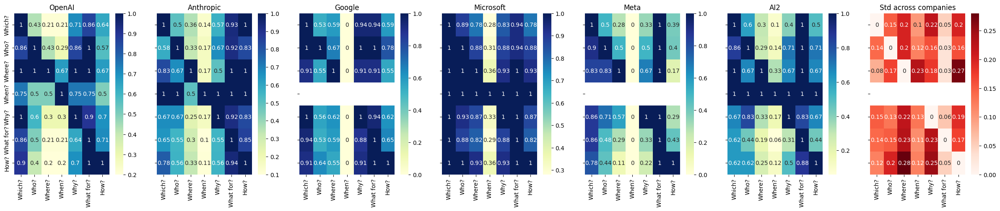

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

In [592]:
## Co-occurence matrix



# Create figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1,7, figsize=(30, 5), sharex=True, sharey=True) 
ax_count = 0

cooccurrence_matrices = []

for company in ["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]:
    subset_df = df[df.columns[df.loc["Company"].fillna("").str.contains(company)]]
    subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
    #print(subset_df.shape)
    subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]
    #print(subset_df)
    subset_df_binary = subset_df.notna().astype(int)

    group_ids = np.arange(len(subset_df_binary)) // 3

    # Step 3: group by the triplets and check if any value exists in each column
    merged_df = subset_df_binary.groupby(group_ids).any().astype(int)

    names = ["Which?", "Who?", "Where?", "Why?", "What for?", "How?", "When?"]
    merged_df.index = names
    
    new_order = [
        "Which?",
        "Who?",
        "Where?",
        "When?",
         "Why?",
        "What for?",
        "How?"
    ]
    merged_df = merged_df.loc[new_order]
        
    cooccurrence = merged_df.dot(merged_df.T)
    cooccurrence_normalized = cooccurrence.div(cooccurrence.max(axis=1), axis=0)
    cooccurrence_normalized  = cooccurrence_normalized.round(2)
    cooccurrence_matrices.append(cooccurrence_normalized)

    
    # Step 2b: Plot histogram of distribution of counts
    plt.figure(figsize=(8, 5))
    sns.heatmap(cooccurrence_normalized, annot=True, cmap="YlGnBu", ax=axes[ax_count])

    #sns.histplot(yes_counts, bins=range(0, int(yes_counts.max(skipna=True)+2)), color="orange", ax=axes[ax_count])
    axes[ax_count].set_ylabel("")      # remove label
    if doc_type == "guides":
        doc_type = "Guides"
    axes[ax_count].set_title(company) #"Distribution of the number of answered questions per document")
    
    ax_count += 1


stacked = np.stack([m.values for m in cooccurrence_matrices])

# Compute std across companies (axis=0)
std_matrix = np.std(stacked, axis=0)

# Back to DataFrame for plotting
std_df = pd.DataFrame(
    std_matrix,
    index=cooccurrence_matrices[0].index,
    columns=cooccurrence_matrices[0].columns
).round(2)
sns.heatmap(
    std_df,
    annot=True,
    cmap="Reds",
    ax=axes[6],
    cbar=True
)

axes[6].set_title("Std across companies")
axes[6].set_ylabel("")

fig.savefig("plots/cooccurence_questions_companies_percentage.png", dpi=300, bbox_inches="tight")
#fig.close()

In [593]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# List of companies
companies = ["OpenAI", "Anthropic", "Google", "Microsoft", "Meta", "AI2"]

# Create figure with 2 rows, 4 columns (last subplot will be std)
fig, axes = plt.subplots(2, 4, figsize=(24, 12), sharex=True, sharey=True)
axes = axes.flatten()  # flatten for easy indexing

ax_count = 0
cooccurrence_matrices = []

for company in companies:
    subset_df = df[df.columns[df.loc["Company"].fillna("").str.contains(company)]]
    subset_df = subset_df.loc[:, ~subset_df.columns.str.contains("_LLM")]
    subset_df = subset_df.loc[subset_df.index.isin(["actual", "potential", "projected"])]
    subset_df_binary = subset_df.notna().astype(int)

    group_ids = np.arange(len(subset_df_binary)) // 3
    merged_df = subset_df_binary.groupby(group_ids).any().astype(int)

    names = ["Which?", "Who?", "Where?", "Why?", "What for?", "How?", "When?"]
    merged_df.index = names
    
    new_order = ["Which?", "Who?", "Where?", "When?", "Why?", "What for?", "How?"]
    merged_df = merged_df.loc[new_order]
        
    cooccurrence = merged_df.dot(merged_df.T)
    cooccurrence_normalized = cooccurrence.div(cooccurrence.max(axis=1), axis=0).round(2) * 100
    cooccurrence_matrices.append(cooccurrence_normalized)

    # Plot heatmap in the correct subplot
    sns.heatmap(cooccurrence_normalized, annot=True, cmap="YlGnBu", ax=axes[ax_count])
    axes[ax_count].set_ylabel("")
    axes[ax_count].set_title(company)
    ax_count += 1

# Compute std across companies
stacked = np.stack([m.values for m in cooccurrence_matrices])
std_matrix = np.std(stacked, axis=0)
std_df = pd.DataFrame(std_matrix, index=cooccurrence_matrices[0].index, columns=cooccurrence_matrices[0].columns).round(2)

# Plot std heatmap in the last subplot
sns.heatmap(std_df, annot=True, cmap="Reds", ax=axes[ax_count], cbar=True)
axes[ax_count].set_title("Std across companies")
axes[ax_count].set_ylabel("")

# Hide any unused axes (in case 2x4 > 7)
for i in range(ax_count+1, len(axes)):
    axes[i].axis("off")

# Adjust layout and save
plt.tight_layout()
fig.savefig("plots/cooccurence_questions_companies_percentage.png", dpi=300, bbox_inches="tight")
plt.close(fig)


# Investigation of the units of analysis

In [594]:
def stringToList(temp_string):
    list_string = re.split(r"\s*[,;]\s*", temp_string.strip())
    clean_list_string = []
    for elem in list_string:
        clean_list_string.append(elem.lower())
    return(clean_list_string)

def populateDict(elem, dic):
    if elem in dic:
        dic[elem] += 1
    else:
        dic[elem] = 1
    return dic

In [595]:
def map_question_reporting_standard(row_label, df):
    print(row_label)

    format_dict = {"OpenAI": {}, "Anthropic":{}, "Meta":{}, "Microsoft":{}, "Google":{}, "AI2":{},\
                 "Marketing materials": {}, "Reports":{}, "Model documentation":{}, "Policies":{}, "Developer guides":{},\
                  "all":{}}
    
    start_idx = df.index.get_loc(row_label)
    # Get that row and the next three
    subset = df.iloc[start_idx+1:start_idx + 17]
    #print(subset)

    dict_to_populate = {row_label + "_actual": copy.deepcopy(format_dict), \
                       row_label + "_potential": copy.deepcopy(format_dict), \
                        row_label + "_projected": copy.deepcopy(format_dict), \
                       row_label + "_questionLevel": copy.deepcopy(format_dict)}

    
    for column_name in df.columns:
        if "LLM" not in column_name:
            if "Anthropic_21" not in column_name:
                if "Anthropic_16" not in column_name:
                    if "AI2_6" not in column_name:
                        if "AI2_7" not in column_name:
                            document_type = df[column_name]["Document categorization"]
                            company = df[column_name]["Company"]
                            information_actual = subset[column_name].loc["actual -category"]
                            information_potential = subset[column_name].loc["potential -category"]
                            information_projected = subset[column_name].loc["projected -category"]
                            if not pd.isna(information_actual):
                                temp_string = stringToList(information_actual)
                                for elem in temp_string:
                                    populateDict(elem, dict_to_populate[row_label + "_actual"][company])
                                    populateDict(elem, dict_to_populate[row_label + "_actual"][document_type])
                                    populateDict(elem, dict_to_populate[row_label + "_actual"]["all"])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"][company])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"][document_type])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"]["all"])
                            if not pd.isna(information_potential):
                                temp_string = stringToList(information_potential)
                                for elem in temp_string:
                                    populateDict(elem, dict_to_populate[row_label + "_potential"][company])
                                    populateDict(elem, dict_to_populate[row_label + "_potential"][document_type])
                                    populateDict(elem, dict_to_populate[row_label + "_potential"]["all"])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"][company])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"][document_type])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"]["all"])
                            if not pd.isna(information_projected):
                                temp_string = stringToList(information_projected)
                                for elem in temp_string:
                                    populateDict(elem, dict_to_populate[row_label + "_potential"][company])
                                    populateDict(elem, dict_to_populate[row_label + "_projected"][document_type])
                                    populateDict(elem, dict_to_populate[row_label + "_projected"]["all"])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"][company])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"][document_type])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"]["all"])

    return dict_to_populate


list_useQuestions = ["Who uses it?",  "Where do users use it?",  "When do users use it?" ,\
                    "What do users use it for?", "Why do users use it?", "How do users use it?" ] #, 
count_dictionary = {}
for row_label in list_useQuestions:
    count_dictionary[row_label] = map_question_reporting_standard(row_label, df)


Who uses it?
Where do users use it?
When do users use it?
What do users use it for?
Why do users use it?
How do users use it?


# Plots without merging temporalities

In [596]:
# Transformation of some units
def find_key_clustering(target, my_dict):
    for key, values in my_dict.items():
        if target in values:
            return(key)
    print(target + " key not found")
    return(None)
            


who_clustering = {"organizational group": ['industry', 'company', 'department'], \
                "business size and maturity": ['business size', 'business maturity'],\
                "industry/government/civil society": ['for-profit/non-profit', 'public/private sector', 'regulated/unregulated industries'],\
                 "professional role": ['professional/personal', 'professional role', 'career stage'],\
                 "area and level of expertise": ['expertise', 'field of study'], \
                 "geography": ["country", "state", "geography"],\
                 "early/late adopter": ['innovator/adopter', 'early/late adopter'],\
                  'service provider/service consumer': ['service provider/service consumer'],\
                  'socio-demographic factors': ['user','nationality','language','age','income','disability'],\
                  'IP address':['ip address'],\
                  'legitimate/illegitimate user':['legitimate/illegitimate user']
                 }

temp_who = {}
for key in who_clustering:
    temp_who[key] = 0


In [597]:
dictionary_units_temporality = {}
for question in count_dictionary:
    dictionary_units_temporality[question] = {}
    for temporality in ["_actual", "_potential", "_projected"]:
        dictionary_units_temporality[question][temporality] = count_dictionary[question][question+temporality]["all"]


for temporality in ["_actual", "_potential", "_projected"]:    
    temp_who = {}
    for key in who_clustering:
        temp_who[key] = 0
    for elem in dictionary_units_temporality['Who uses it?'][temporality]:
        new_key = find_key_clustering(elem, who_clustering)
        if new_key != None:
            temp_who[new_key] += dictionary_units_temporality['Who uses it?'][temporality][elem]
    dictionary_units_temporality['Who uses it?'][temporality] = temp_who

for dictionary_key in count_dictionary['Who uses it?']:
    for sub_dictionary_key in count_dictionary['Who uses it?'][dictionary_key]:
        dictionary_to_replace = count_dictionary['Who uses it?'][dictionary_key][sub_dictionary_key]
        temp_dictionary = {}
        for elem in dictionary_to_replace:
            new_key = find_key_clustering(elem, who_clustering)
            if new_key != None:
                if new_key in temp_dictionary:
                    temp_dictionary[new_key] += dictionary_to_replace[elem]
                else:
                    temp_dictionary[new_key] = dictionary_to_replace[elem]
        count_dictionary['Who uses it?'][dictionary_key][sub_dictionary_key] = temp_dictionary

customer loyalty key not found
underspecified background key not found
customer loyalty key not found
customer loyalty key not found
customer loyalty key not found
underspecified background key not found
underspecified background key not found
underspecified background key not found
underspecified background key not found
customer loyalty key not found
customer loyalty key not found
underspecified background key not found
underspecified background key not found
customer loyalty key not found


In [598]:
dictionary_units_temporality

{'Who uses it?': {'_actual': {'organizational group': 13,
   'business size and maturity': 8,
   'industry/government/civil society': 3,
   'professional role': 21,
   'area and level of expertise': 3,
   'geography': 7,
   'early/late adopter': 3,
   'service provider/service consumer': 2,
   'socio-demographic factors': 14,
   'IP address': 1,
   'legitimate/illegitimate user': 1},
  '_potential': {'organizational group': 15,
   'business size and maturity': 2,
   'industry/government/civil society': 1,
   'professional role': 21,
   'area and level of expertise': 4,
   'geography': 3,
   'early/late adopter': 0,
   'service provider/service consumer': 5,
   'socio-demographic factors': 11,
   'IP address': 0,
   'legitimate/illegitimate user': 1},
  '_projected': {'organizational group': 1,
   'business size and maturity': 1,
   'industry/government/civil society': 0,
   'professional role': 5,
   'area and level of expertise': 1,
   'geography': 1,
   'early/late adopter': 0,
   's

/var/folders/96/blzs496n26j3l5wls5rml_500000gn/T/ipykernel_77301/2005681664.py:38: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="upper right", fontsize="small")
/var/folders/96/blzs496n26j3l5wls5rml_500000gn/T/ipykernel_77301/2005681664.py:38: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="upper right", fontsize="small")
/var/folders/96/blzs496n26j3l5wls5rml_500000gn/T/ipykernel_77301/2005681664.py:38: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="upper right", fontsize="small")
/var/folders/96/blzs496n26j3l5wls5rml_500000gn/T/ipykernel_77301/2005681664.py:38: UserWarning

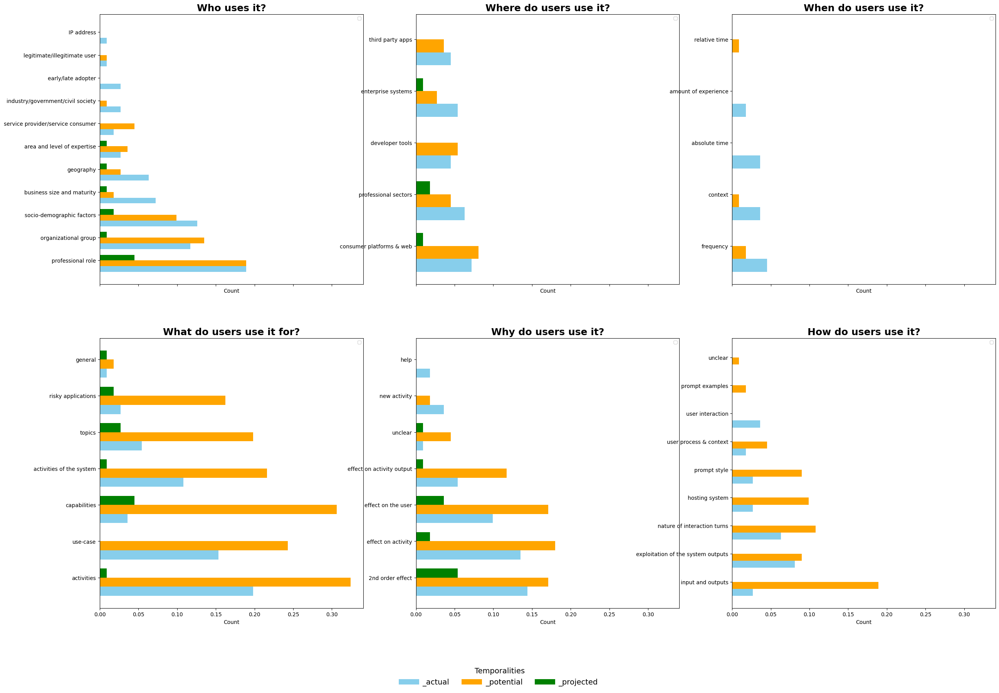

In [599]:
colors = {
    "_actual": "skyblue",
    "_potential": "orange",
    "_projected": "green"
}
total_doc = 111

# ---- Plot ----
fig, axes = plt.subplots(2, 3, figsize=(30, 20), sharex=True)

row = 0
col = 0

for question in dictionary_units_temporality.keys():
    ax = axes[row, col]
    # Convert nested dict → dataframe
    temp_df = pd.DataFrame(dictionary_units_temporality[question]).fillna(0) / total_doc
    # Sort categories by total descending
    temp_df = temp_df.loc[temp_df.sum(axis=1).sort_values(ascending=False).index]
    y = np.arange(len(temp_df))
    bar_height = 0.25

    # Plot each temporality
    for i, temporality in enumerate(temp_df.columns):
        ax.barh(
            y + i * bar_height,
            temp_df[temporality],
            height=bar_height,
            label=temporality,
            color=colors.get(temporality, "gray")
        )

    #ax.set_yticks(y + bar_height * (len(df.columns) / 2))
    ax.set_yticks(y + bar_height * (len(temp_df.columns) / 2))
    ax.set_yticklabels(temp_df.index, fontsize=10)
    ax.set_title(question, fontsize=18, fontweight="bold")
    ax.set_xlabel("Count")
    ax.legend(loc="upper right", fontsize="small")

    col +=1
    if col > 2:
        row = 1
        col = 0

# ---- GLOBAL LEGEND (one legend for entire figure) ----
temporalities = ["_actual", "_potential", "_projected"]  # for legend order

handles = [
    plt.Line2D([0], [0], color=colors[t], lw=10)
    for t in temporalities
    if any(t in subdict for subdict in dictionary_units_temporality.values())
]
labels = [t for t in temporalities if any(t in subdict for subdict in dictionary_units_temporality.values())]

fig.legend(
    handles,
    labels,
    loc="lower center",
    ncol=len(labels),
    frameon=False,
    fontsize=14,
    title="Temporalities",
    title_fontsize=14
    # bbox_to_anchor=(1.06, 0.5)
)

#plt.tight_layout()
fig.savefig("plots/units_all_frequency_temporality.png")
#lt.show()


### Merge all temporalities

In [600]:
list_units = {}
# Get all relevant information
for question in list_useQuestions:
    list_units[question] = count_dictionary[question][question + '_questionLevel']["all"]
for elem in list_units['Who uses it?']:
    new_key = find_key_clustering(elem, who_clustering)
    if new_key != None:
        temp_who[new_key] += list_units['Who uses it?'][elem]


list_units['Who uses it?'] = temp_who

organizational group key not found
area and level of expertise key not found
socio-demographic factors key not found
industry/government/civil society key not found
business size and maturity key not found
IP address key not found


In [610]:
import textwrap


def wrap_labels(labels, width=25):
    return ["\n".join(textwrap.wrap(label, width)) for label in labels]

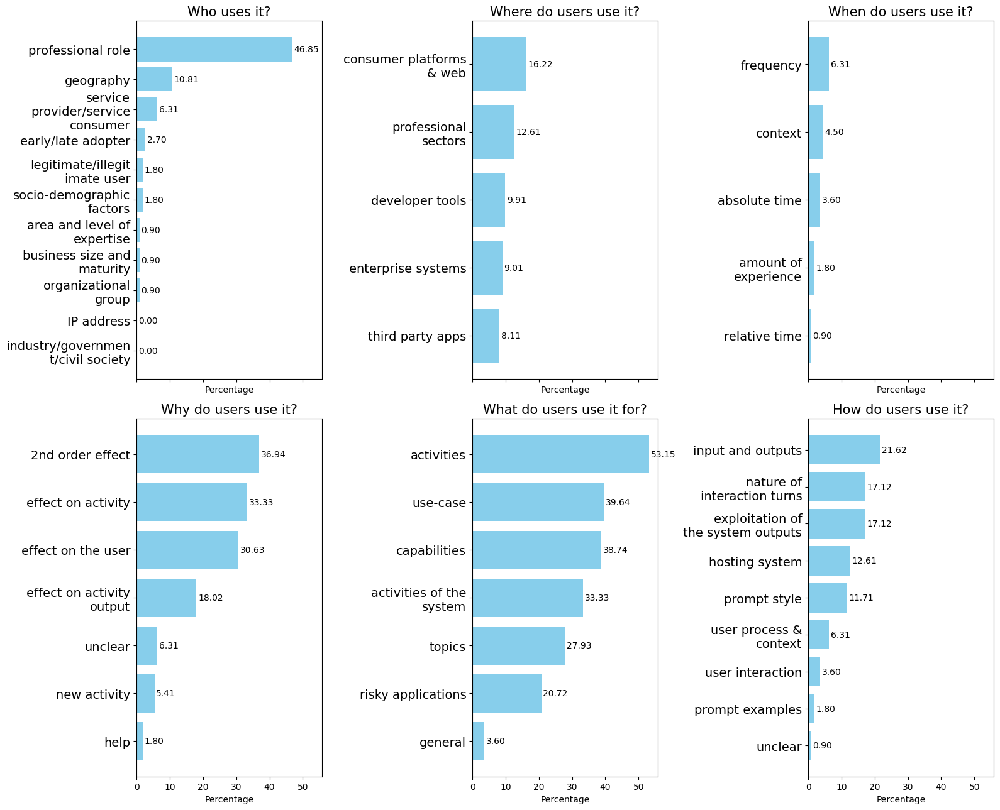

In [619]:
# Convert nested dict to long-form DataFrame
# Create figure
total_doc = 111
temp_data  = list_units
data = {}
for question in temp_data:
    temp_dic = {}
    for key in temp_data[question]:
        temp_dic[key] = round(temp_data[question][key] / total_doc * 100, 3)
    data[question] = temp_dic



# Number of questions
num_questions = len(new_order := ['Who uses it?', 'Where do users use it?', 'When do users use it?',
                                  'Why do users use it?', 'What do users use it for?', 'How do users use it?'])

cols = math.ceil(num_questions / 2)  # Number of columns
rows = 2  # Two rows

# Create the figure
fig, axes = plt.subplots(rows, cols, figsize=(16, 13), sharex=True)
axes = axes.flatten()  # flatten to 1D array for easy iteration

for ax, question in zip(axes, new_order):
    counts = data[question]  # get the dictionary of categories for this question

    # Sort categories by count descending
    sorted_counts = dict(sorted(counts.items(), key=lambda x: x[1], reverse=False))
    categories = list(sorted_counts.keys())
    values = list(sorted_counts.values())

    wrapped_categories = wrap_labels(categories, width=18)
    ax.set_yticks(range(len(categories)))
    ax.set_yticklabels(wrapped_categories, fontsize=14)
    
    # Horizontal bar chart
    ax.barh(categories, values, color="skyblue")
    ax.set_title(question, fontsize=15)
    ax.set_xlabel("Percentage")
    ax.set_ylabel("")
    
    # Display counts next to bars
    for i, v in enumerate(values):
        ax.text(v + 0.5, i, str("{:.2f}".format(v)), va='center', fontsize=10)

# Hide any unused subplots
for ax in axes[num_questions:]:
    ax.axis('off')

plt.tight_layout()
#plt.show()
plt.savefig("plots/units_frequencyQuestions_all.png", dpi=300, bbox_inches="tight")


### Plot units of analysis per company

                                   OpenAI  Anthropic  Google  Microsoft  Meta  \
professional role                    11.0        7.0     8.0       11.0   4.0   
organizational group                  6.0        6.0     1.0        7.0   9.0   
socio-demographic factors             3.0        2.0     6.0        9.0   5.0   
geography                             0.0        1.0     3.0        1.0   3.0   
business size and maturity            0.0        1.0     4.0        0.0   6.0   
area and level of expertise           2.0        2.0     0.0        1.0   0.0   
service provider/service consumer     1.0        2.0     0.0        2.0   2.0   
industry/government/civil society     1.0        0.0     0.0        0.0   3.0   
early/late adopter                    0.0        2.0     0.0        0.0   1.0   
legitimate/illegitimate user          0.0        2.0     0.0        0.0   0.0   
IP address                            0.0        0.0     0.0        0.0   0.0   

                           

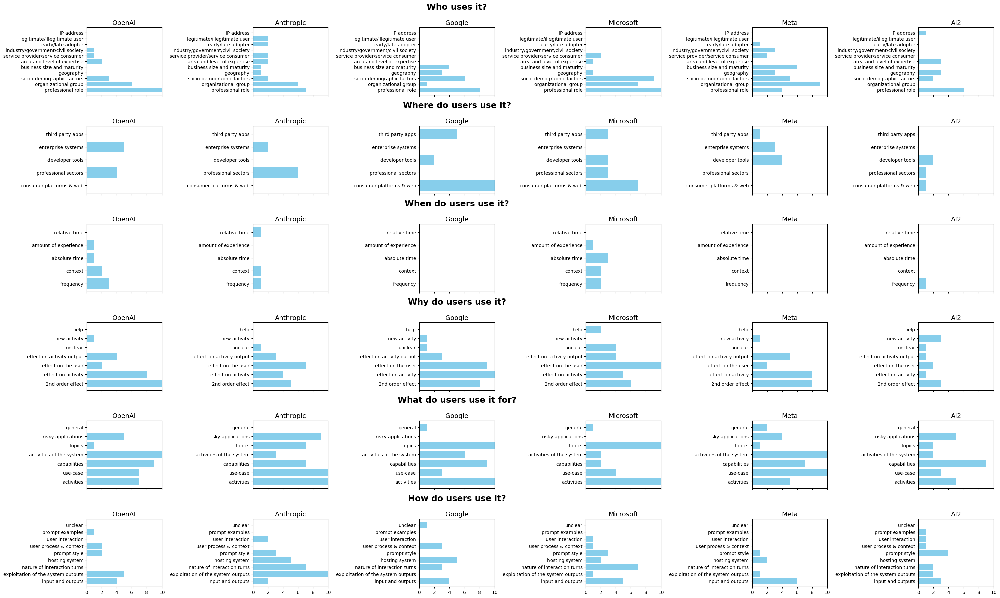

In [602]:
fig, axes = plt.subplots(6, 6, figsize=(30, 18), sharex=True, sharey=False)
#axes = axes.flatten()
question_id = 0

new_order = ['Who uses it?', 'Where do users use it?', 'When do users use it?',
                                  'Why do users use it?', 'What do users use it for?', 'How do users use it?']
for question in new_order:
    # Create a new list with all the data for each company that we aggregate across temporalities.
    #data_per_company = {"OpenAI": {}, "Anthropic":{}, "Meta":{}, "Microsoft":{}, "Google":{}, "AI2":{}}
    #data_per_document = "Marketing materials": {}, "Reports":{}, "Model documentation":{}, "Policies":{}, "Developer guides":{}
    #for company in ["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]:
    #for temporality in count_dictionary[question]
    temp_dic = count_dictionary[question][question + "_questionLevel"]
    data_per_company = {}
    data_per_document = {}
    for company in ["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]:
        data_per_company[company] = temp_dic[company]

    df_count = pd.DataFrame(data_per_company).fillna(0)

    # Sort rows by total count (optional but makes plots more aligned)
    df_count = df_count.loc[df_count.sum(axis=1).sort_values(ascending=False).index]
    print(df_count)
    
    # Shared x-axis limit
    max_val = df_count.values.max()
    #df_count.index = df_count.index.astype(str)
    #axes[question_id, 0].set_ylabel(question, fontsize=16, rotation=0, labelpad=120)
    left_ax = axes[question_id, 2]
    left_ax.annotate(
        question,
        xy=(0.5, 1.3),
        xycoords='axes fraction',
        ha='center', va='center',
        fontsize=18, fontweight='bold'
    )
    
    # ---- Create plots ----
    company_id = 0
    for company in df_count.columns:
        axes[question_id, company_id].barh(df_count.index, df_count[company], color="skyblue")
        axes[question_id, company_id].set_title(company, fontsize=14)
        axes[question_id, company_id].set_xlim(0, max_val)
        company_id += 1
    
    
    question_id += 1

plt.tight_layout()
plt.savefig("plots/units_frequencyQuestions_perCompany.png")
  
    

                                   OpenAI  Anthropic  Google  Microsoft  Meta  \
professional role                    11.0        7.0     8.0       11.0   4.0   
organizational group                  6.0        6.0     1.0        7.0   9.0   
socio-demographic factors             3.0        2.0     6.0        9.0   5.0   
geography                             0.0        1.0     3.0        1.0   3.0   
business size and maturity            0.0        1.0     4.0        0.0   6.0   
area and level of expertise           2.0        2.0     0.0        1.0   0.0   
service provider/service consumer     1.0        2.0     0.0        2.0   2.0   
industry/government/civil society     1.0        0.0     0.0        0.0   3.0   
early/late adopter                    0.0        2.0     0.0        0.0   1.0   
legitimate/illegitimate user          0.0        2.0     0.0        0.0   0.0   
IP address                            0.0        0.0     0.0        0.0   0.0   

                           

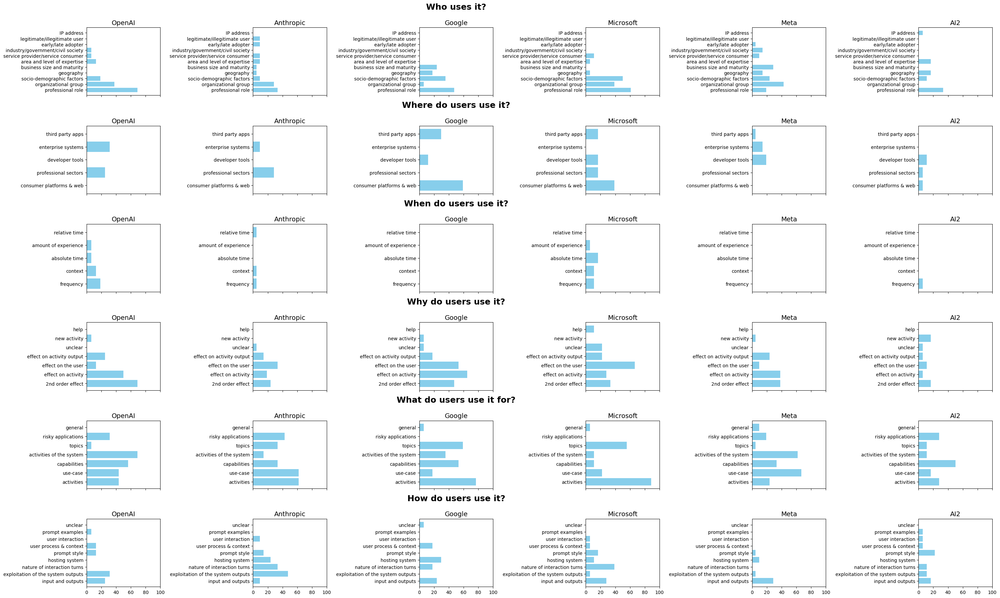

In [603]:
# Percentages

fig, axes = plt.subplots(6, 6, figsize=(30, 18), sharex=True, sharey=False)
#axes = axes.flatten()
question_id = 0

new_order = ['Who uses it?', 'Where do users use it?', 'When do users use it?',
                                  'Why do users use it?', 'What do users use it for?', 'How do users use it?']
for question in new_order:
    # Create a new list with all the data for each company that we aggregate across temporalities.
    #data_per_company = {"OpenAI": {}, "Anthropic":{}, "Meta":{}, "Microsoft":{}, "Google":{}, "AI2":{}}
    #data_per_document = "Marketing materials": {}, "Reports":{}, "Model documentation":{}, "Policies":{}, "Developer guides":{}
    #for company in ["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]:
    #for temporality in count_dictionary[question]
    temp_dic = count_dictionary[question][question + "_questionLevel"]
    data_per_company = {}
    data_per_document = {}
    for company in ["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]:
        data_per_company[company] = temp_dic[company]

    df_count = pd.DataFrame(data_per_company).fillna(0)

    # Sort rows by total count (optional but makes plots more aligned)
    df_count = df_count.loc[df_count.sum(axis=1).sort_values(ascending=False).index]
    print(df_count)
    
    # Shared x-axis limit
    max_val = 100
    #df_count.index = df_count.index.astype(str)
    #axes[question_id, 0].set_ylabel(question, fontsize=16, rotation=0, labelpad=120)
    left_ax = axes[question_id, 2]
    left_ax.annotate(
        question,
        xy=(0.5, 1.3),
        xycoords='axes fraction',
        ha='center', va='center',
        fontsize=18, fontweight='bold'
    )
    
    # ---- Create plots ----
    company_id = 0
    for company in df_count.columns:
        denominator = total_company[company]
        axes[question_id, company_id].barh(df_count.index, df_count[company] / denominator * 100, color="skyblue")
        axes[question_id, company_id].set_title(company, fontsize=14)
        axes[question_id, company_id].set_xlim(0, max_val)
        company_id += 1
    
    
    question_id += 1

plt.tight_layout()
plt.savefig("plots/units_frequencyQuestions_perCompany_percentage.png")
  
    

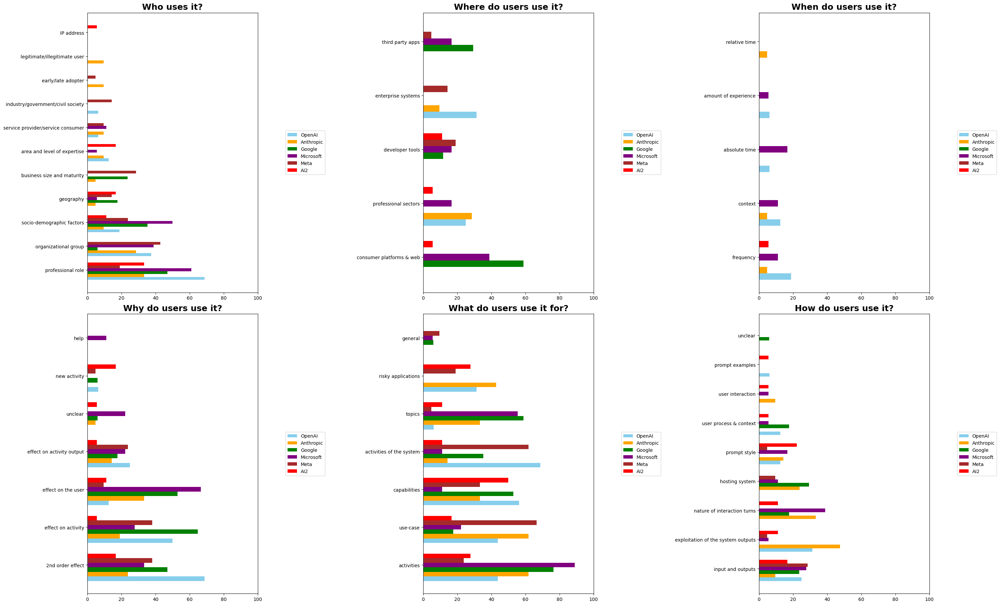

In [604]:
# Merged rows

fig, axes = plt.subplots(2, 3, figsize=(30, 18), sharex=False, sharey=False)
question_id = 0
index_id = 0

new_order = [
    'Who uses it?', 'Where do users use it?', 'When do users use it?',
    'Why do users use it?', 'What do users use it for?', 'How do users use it?'
]

companies = ["OpenAI", "Anthropic", "Google", "Microsoft", "Meta", "AI2"]

# Colors for each company
company_colors = {
    "OpenAI": "skyblue",
    "Anthropic": "orange",
    "Google": "green",
    "Microsoft": "purple",
    "Meta": "brown",
    "AI2": "red"
}

for question in new_order:

    temp_dic = count_dictionary[question][question + "_questionLevel"]

    # Extract data per company
    data_per_company = {company: temp_dic[company] for company in companies}

    df_count = pd.DataFrame(data_per_company).fillna(0)

    # Sort rows by total value
    df_count = df_count.loc[df_count.sum(axis=1).sort_values(ascending=False).index]

    # Combined axis for whole row → put in middle column
    ax = axes[index_id, question_id]

    # Add the row's title
    ax.annotate(
        question,
        xy=(0.5, 1.02),
        xycoords="axes fraction",
        ha="center",
        va="center",
        fontsize=18,
        fontweight="bold"
    )

    # Y-axis category positions
    bar_height = 0.12
    y = np.arange(len(df_count))

    # Plot each company as a different-colored bar group
    for i, company in enumerate(df_count.columns):
        denom = total_company[company]
        percent_vals = df_count[company] / denom * 100

        ax.barh(
            y + i * bar_height,
            percent_vals,
            height=bar_height,
            label=company,
            color=company_colors[company]
        )

    # Put y labels centered across the grouped bars
    ax.set_yticks(y + bar_height * (len(df_count.columns) / 2))
    ax.set_yticklabels(df_count.index, fontsize=10)

    ax.set_xlim(0, 100)

    # Legend on the right
    ax.legend(loc="center left", bbox_to_anchor=(1.15, 0.5))

    question_id += 1
    if question_id > 2:
        question_id = 0
        index_id = 1

plt.tight_layout()
plt.savefig("plots/units_frequencyQuestions_perCompany_percentage_merged.png")
plt.show()


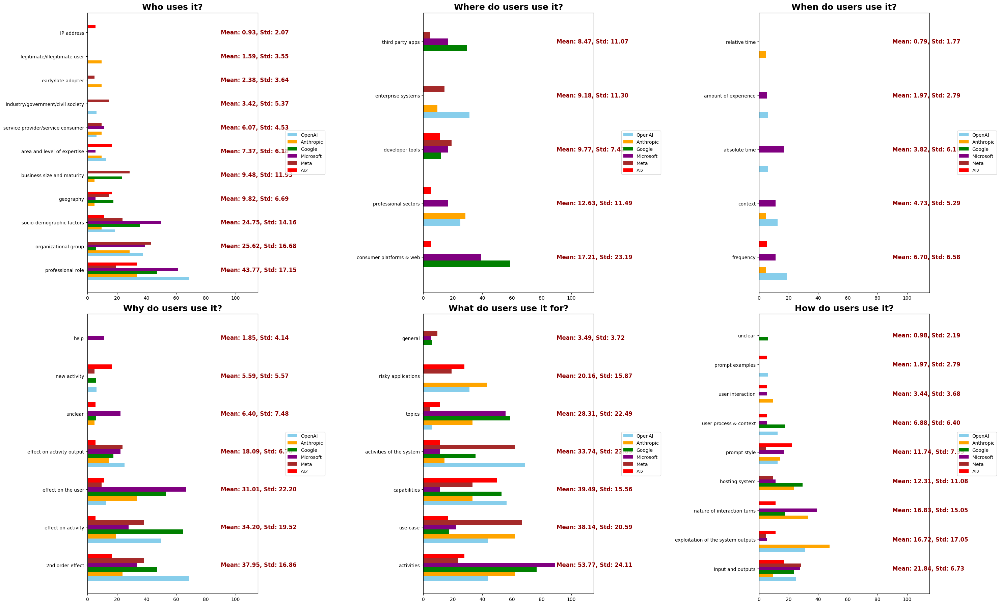

In [605]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Merged rows with variance annotations (fixed)
fig, axes = plt.subplots(2, 3, figsize=(30, 18), sharex=False, sharey=False)
question_id = 0
index_id = 0

new_order = [
    'Who uses it?', 'Where do users use it?', 'When do users use it?',
    'Why do users use it?', 'What do users use it for?', 'How do users use it?'
]

companies = ["OpenAI", "Anthropic", "Google", "Microsoft", "Meta", "AI2"]

# Colors for each company
company_colors = {
    "OpenAI": "skyblue",
    "Anthropic": "orange",
    "Google": "green",
    "Microsoft": "purple",
    "Meta": "brown",
    "AI2": "red"
}

for question in new_order:

    temp_dic = count_dictionary[question][question + "_questionLevel"]

    # Extract data per company (ensure columns are in the companies order)
    data_per_company = {company: temp_dic.get(company, {}) for company in companies}
    df_count = pd.DataFrame(data_per_company).fillna(0)

    # Sort rows by total value (optional)
    df_count = df_count.loc[df_count.sum(axis=1).sort_values(ascending=False).index]

    # Combined axis for whole row → place in grid
    ax = axes[index_id, question_id]

    # Row title
    ax.annotate(
        question,
        xy=(0.5, 1.02),
        xycoords="axes fraction",
        ha="center",
        va="center",
        fontsize=18,
        fontweight="bold"
    )

    # Y positions and bar layout
    bar_height = 0.12
    y = np.arange(len(df_count))

    # Build denominators array aligned to df_count.columns
    denom_array = np.array([total_company[col] for col in df_count.columns], dtype=float)

    # Plot each company as grouped horizontal bars (percentages)
    for i, company in enumerate(df_count.columns):
        percent_vals = (df_count[company] / denom_array[i]) * 100  # elementwise division using aligned denom
        ax.barh(
            y + i * bar_height,
            percent_vals,
            height=bar_height,
            label=company,
            color=company_colors.get(company, "gray")
        )

    # Center y labels across the groups
    ax.set_yticks(y + bar_height * (len(df_count.columns) / 2))
    ax.set_yticklabels(df_count.index, fontsize=10)

    # Extend x-axis to leave room for variance labels
    ax.set_xlim(0, 115)

    # Legend to the right
    ax.legend(loc="center left", bbox_to_anchor=(1.15, 0.5))

    # ----------------------------
    # Compute variances (on % values) and annotate
    # ----------------------------
    # Build a (n_rows x n_companies) array of percentages
    # Ensure the columns order matches denom_array
    pct_matrix = df_count.values / denom_array[np.newaxis, :] * 100  # shape (n_rows, n_companies)
    variances = np.nanstd(pct_matrix, axis=1)  # population variance; use ddof=1 with np.var(..., ddof=1) if you prefer sample variance
    means = np.nanmean(pct_matrix, axis=1)
    # Annotate variance for each row (centered vertically)
    for yi, var, mean in zip(y, variances, means):
        ax.text(
            90,  # x-position (a bit right of 100)
            yi + bar_height * (len(df_count.columns) / 2),
            f"Mean: {mean:.2f}, Std: {var:.2f}",
            va="center",
            ha="left",
            fontsize=12,
            color="darkred",
            fontweight="bold"
        )

    # Advance to next subplot position
    question_id += 1
    if question_id > 2:
        question_id = 0
        index_id += 1

plt.tight_layout()
plt.savefig("plots/units_frequencyQuestions_perCompany_percentage_merged_with_variance.png")
plt.show()


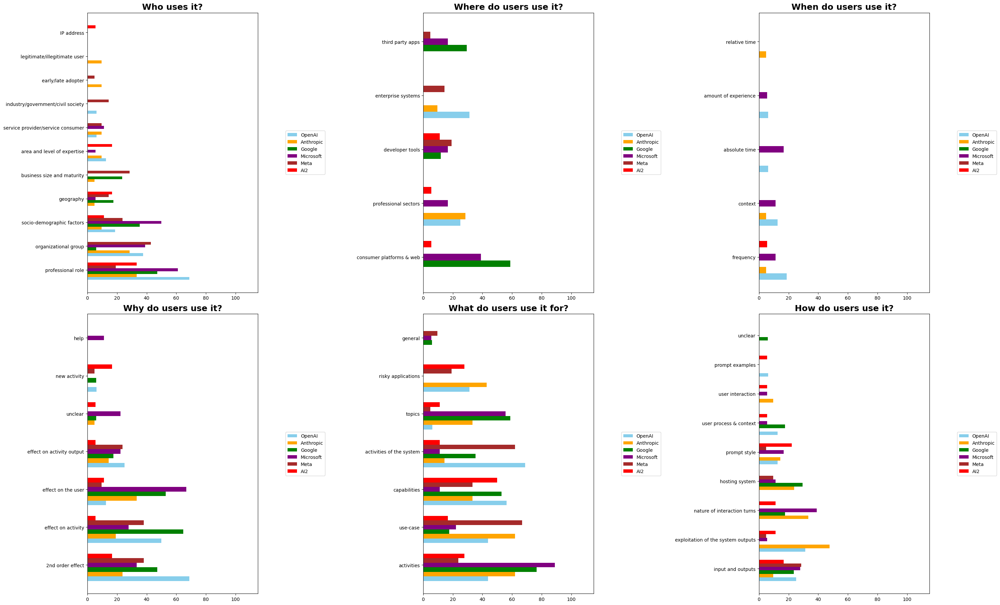

In [606]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Merged rows with variance annotations (fixed)
fig, axes = plt.subplots(2, 3, figsize=(30, 18), sharex=False, sharey=False)
question_id = 0
index_id = 0

new_order = [
    'Who uses it?', 'Where do users use it?', 'When do users use it?',
    'Why do users use it?', 'What do users use it for?', 'How do users use it?'
]

companies = ["OpenAI", "Anthropic", "Google", "Microsoft", "Meta", "AI2"]

# Colors for each company
company_colors = {
    "OpenAI": "skyblue",
    "Anthropic": "orange",
    "Google": "green",
    "Microsoft": "purple",
    "Meta": "brown",
    "AI2": "red"
}

for question in new_order:

    temp_dic = count_dictionary[question][question + "_questionLevel"]

    # Extract data per company (ensure columns are in the companies order)
    data_per_company = {company: temp_dic.get(company, {}) for company in companies}
    df_count = pd.DataFrame(data_per_company).fillna(0)

    # Sort rows by total value (optional)
    df_count = df_count.loc[df_count.sum(axis=1).sort_values(ascending=False).index]

    # Combined axis for whole row → place in grid
    ax = axes[index_id, question_id]

    # Row title
    ax.annotate(
        question,
        xy=(0.5, 1.02),
        xycoords="axes fraction",
        ha="center",
        va="center",
        fontsize=18,
        fontweight="bold"
    )

    # Y positions and bar layout
    bar_height = 0.12
    y = np.arange(len(df_count))

    # Build denominators array aligned to df_count.columns
    denom_array = np.array([total_company[col] for col in df_count.columns], dtype=float)

    # Plot each company as grouped horizontal bars (percentages)
    for i, company in enumerate(df_count.columns):
        percent_vals = (df_count[company] / denom_array[i]) * 100  # elementwise division using aligned denom
        ax.barh(
            y + i * bar_height,
            percent_vals,
            height=bar_height,
            label=company,
            color=company_colors.get(company, "gray")
        )

    # Center y labels across the groups
    ax.set_yticks(y + bar_height * (len(df_count.columns) / 2))
    ax.set_yticklabels(df_count.index, fontsize=10)

    # Extend x-axis to leave room for variance labels
    ax.set_xlim(0, 115)

    # Legend to the right
    ax.legend(loc="center left", bbox_to_anchor=(1.15, 0.5))

   
    # Advance to next subplot position
    question_id += 1
    if question_id > 2:
        question_id = 0
        index_id += 1

plt.tight_layout()
plt.savefig("plots/units_frequencyQuestions_perCompany_percentage_merged_without_variance.png")
plt.show()


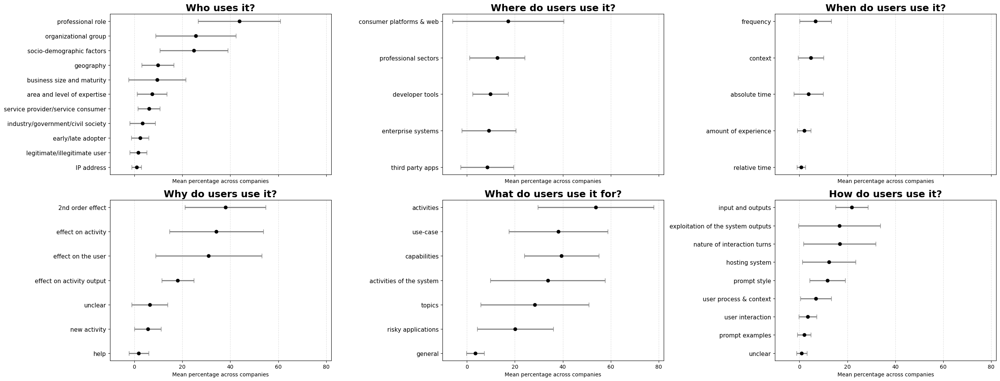

In [607]:
fig_ms, axes_ms = plt.subplots(2, 3, figsize=(26, 10), sharex=True)
question_id = 0
index_id = 0

for question in new_order:

    temp_dic = count_dictionary[question][question + "_questionLevel"]
    data_per_company = {company: temp_dic.get(company, {}) for company in companies}
    df_count = pd.DataFrame(data_per_company).fillna(0)

    # Sort rows by total frequency (same logic as main plot)
    df_count = df_count.loc[df_count.sum(axis=1).sort_values(ascending=False).index]

    denom_array = np.array([total_company[col] for col in df_count.columns], dtype=float)
    pct_matrix = df_count.values / denom_array[np.newaxis, :] * 100

    means = np.nanmean(pct_matrix, axis=1)
    stds = np.nanstd(pct_matrix, axis=1)

    ax = axes_ms[index_id, question_id]
    y = np.arange(len(df_count))

    # Mean ± Std
    ax.errorbar(
        means,
        y,
        xerr=stds,
        fmt="o",
        color="black",
        ecolor="gray",
        elinewidth=2,
        capsize=4
    )

    ax.set_yticks(y)
    ax.set_yticklabels(df_count.index, fontsize=11)
    ax.set_xlabel("Mean percentage across companies")
    ax.set_title(question, fontsize=18, fontweight="bold")

    ax.invert_yaxis()  # highest frequency on top
    ax.grid(axis="x", linestyle="--", alpha=0.4)

    question_id += 1
    if question_id > 2:
        question_id = 0
        index_id += 1

plt.tight_layout()
plt.savefig(
    "plots/units_frequencyQuestions_mean_std_forest_company.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()


### Plot units of analysis per document type

                                   Marketing materials  Policies  \
professional role                                 25.0       1.0   
organizational group                              22.0       0.0   
socio-demographic factors                          8.0       4.0   
business size and maturity                         9.0       0.0   
geography                                          5.0       0.0   
area and level of expertise                        3.0       0.0   
service provider/service consumer                  7.0       0.0   
industry/government/civil society                  3.0       0.0   
early/late adopter                                 1.0       0.0   
legitimate/illegitimate user                       1.0       0.0   
IP address                                         0.0       0.0   

                                   Developer guides  Model documentation  \
professional role                               3.0                  3.0   
organizational group           

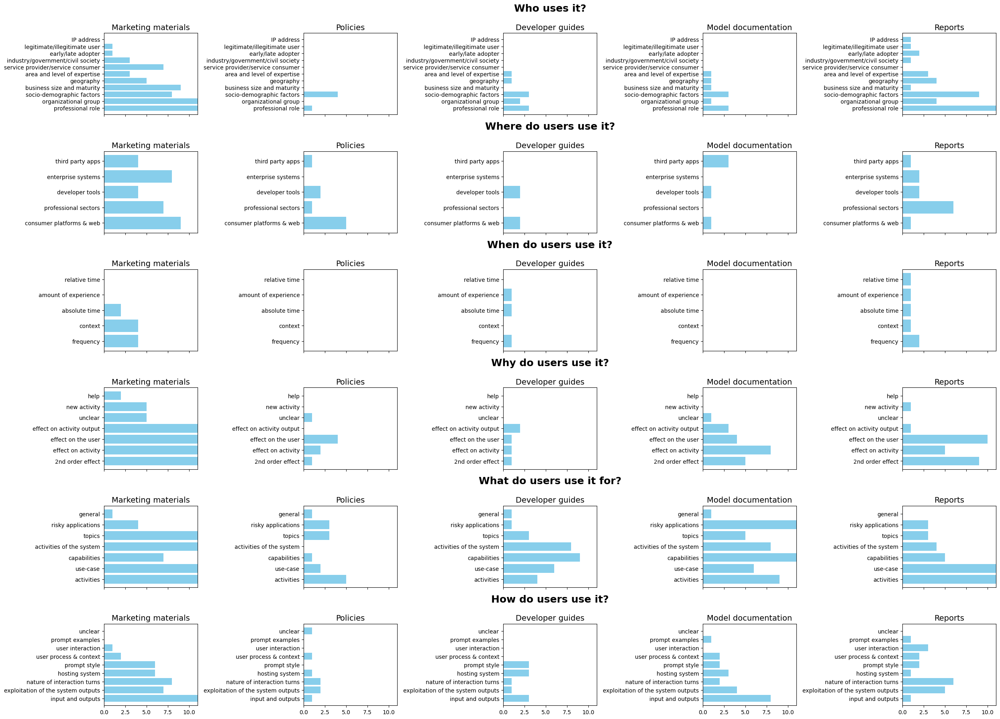

In [608]:
fig, axes = plt.subplots(6, 5, figsize=(25, 18), sharex=True, sharey=False)
#axes = axes.flatten()
question_id = 0

for question in new_order:
    # Create a new list with all the data for each company that we aggregate across temporalities.
    #data_per_company = {"OpenAI": {}, "Anthropic":{}, "Meta":{}, "Microsoft":{}, "Google":{}, "AI2":{}}
    #data_per_document = "Marketing materials": {}, "Reports":{}, "Model documentation":{}, "Policies":{}, "Developer guides":{}
    #for company in ["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]:
    #for temporality in count_dictionary[question]
    temp_dic = count_dictionary[question][question + "_questionLevel"]
    data_per_company = {}
    data_per_document = {}
    
    for document in ["Marketing materials", "Policies", "Developer guides", "Model documentation", "Reports"]:
        data_per_document[document] = temp_dic[document]

    df_count = pd.DataFrame(data_per_document).fillna(0)

    # Sort rows by total count (optional but makes plots more aligned)
    df_count = df_count.loc[df_count.sum(axis=1).sort_values(ascending=False).index]
    print(df_count)
    
    # Shared x-axis limit
    max_val = df_count.values.max()
    #df_count.index = df_count.index.astype(str)
    #axes[question_id, 0].set_ylabel(question, fontsize=16, rotation=0, labelpad=120)
    left_ax = axes[question_id, 2]
    left_ax.annotate(
        question,
        xy=(0.5, 1.3),
        xycoords='axes fraction',
        ha='center', va='center',
        fontsize=18, fontweight='bold'
    )
    
    # ---- Create plots ----
    company_id = 0
    for document in df_count.columns:
        axes[question_id, company_id].barh(df_count.index, df_count[document], color="skyblue")
        axes[question_id, company_id].set_title(document, fontsize=14)
        axes[question_id, company_id].set_xlim(0, max_val)
        company_id += 1
    
    
    question_id += 1

plt.tight_layout()
plt.savefig("plots/units_frequencyQuestions_perDocument.png")
#plt.show()    
    

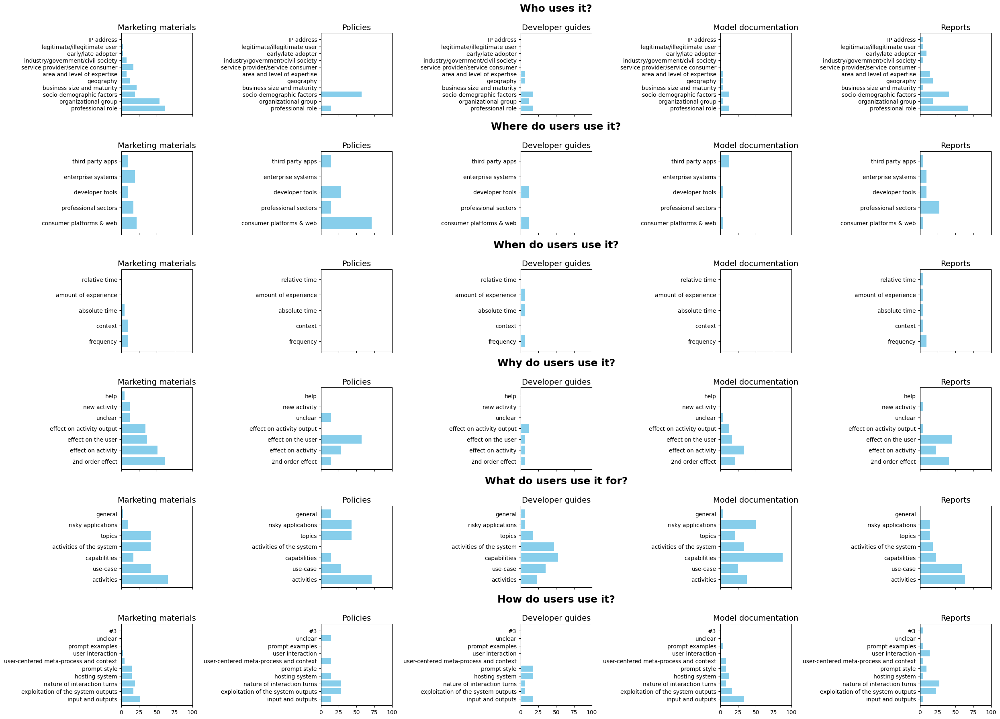

In [209]:
# Same but the denominator is the total number of documents of one type

fig, axes = plt.subplots(6, 5, figsize=(25, 18), sharex=True, sharey=False)
#axes = axes.flatten()
question_id = 0

for question in new_order:
    # Create a new list with all the data for each company that we aggregate across temporalities.
    #data_per_company = {"OpenAI": {}, "Anthropic":{}, "Meta":{}, "Microsoft":{}, "Google":{}, "AI2":{}}
    #data_per_document = "Marketing materials": {}, "Reports":{}, "Model documentation":{}, "Policies":{}, "Developer guides":{}
    #for company in ["OpenAI", "Anthropic",  "Google", "Microsoft", "Meta", "AI2"]:
    #for temporality in count_dictionary[question]
    temp_dic = count_dictionary[question][question + "_questionLevel"]
    data_per_document = {}
    
    for document in ["Marketing materials", "Policies", "Developer guides", "Model documentation", "Reports"]:
        data_per_document[document] = temp_dic[document]
    #print(data_per_document)

    df_count = pd.DataFrame(data_per_document).fillna(0)

    # Sort rows by total count (optional but makes plots more aligned)
    df_count = df_count.loc[df_count.sum(axis=1).sort_values(ascending=False).index]
    
    # Shared x-axis limit
    max_val = 100
    left_ax = axes[question_id, 2]
    left_ax.annotate(
        question,
        xy=(0.5, 1.3),
        xycoords='axes fraction',
        ha='center', va='center',
        fontsize=18, fontweight='bold'
    )
    
    # ---- Create plots ----
    company_id = 0
    for document in df_count.columns:
        dividor = dict_documents[document]['total']
        axes[question_id, company_id].barh(df_count.index, df_count[document] / dividor * 100, color="skyblue")
        axes[question_id, company_id].set_title(document, fontsize=14)
        axes[question_id, company_id].set_xlim(0, max_val)
        company_id += 1
    
    
    question_id += 1

plt.tight_layout()
plt.savefig("plots/units_frequencyQuestions_perDocument_percentage.png")
    

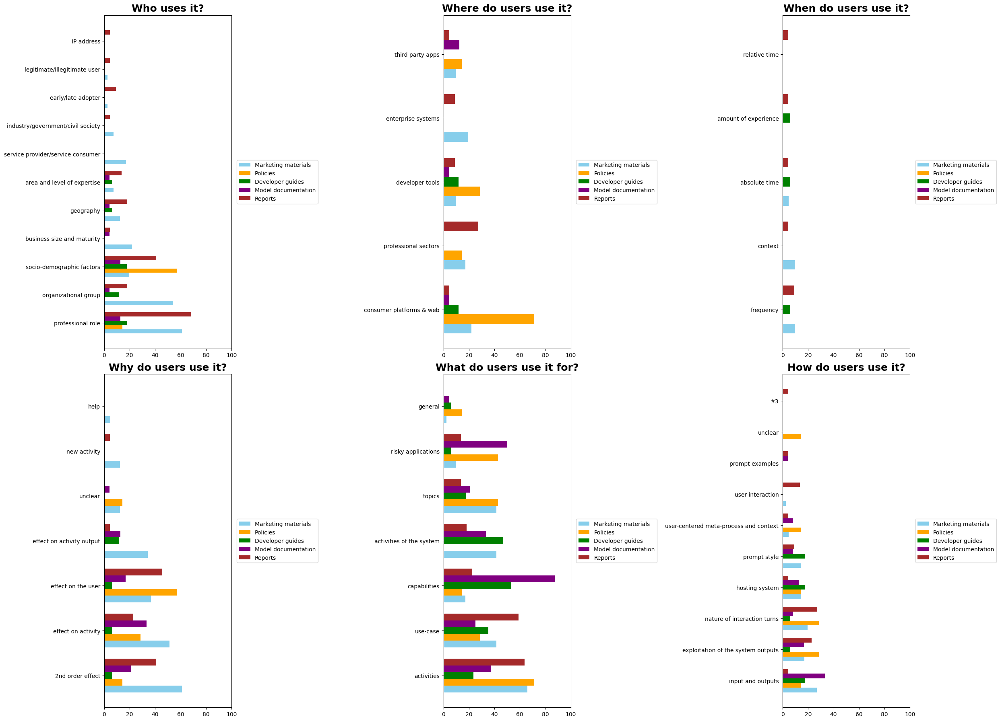

In [210]:


fig, axes = plt.subplots(2, 3, figsize=(25, 18), sharex=False, sharey=False)
question_id = 0
index_id=0

colors = {
    "Marketing materials": "skyblue",
    "Policies": "orange",
    "Developer guides": "green",
    "Model documentation": "purple",
    "Reports": "brown"
}

for question in new_order:

    temp_dic = count_dictionary[question][question + "_questionLevel"]
    data_per_document = {}

    for document in ["Marketing materials", "Policies", "Developer guides", "Model documentation", "Reports"]:
        data_per_document[document] = temp_dic[document]

    df_count = pd.DataFrame(data_per_document).fillna(0)

    # Sort categories by total usage
    df_count = df_count.loc[df_count.sum(axis=1).sort_values(ascending=False).index]

    ax = axes[index_id,question_id]

    # Title for the row
    ax.annotate(
        question,
        xy=(0.5, 1.02),
        xycoords="axes fraction",
        ha="center",
        va="center",
        fontsize=18,
        fontweight="bold"
    )

    # Compute y-positions for grouped bars
    bar_height = 0.15
    y_positions = np.arange(len(df_count))

    # Plot each document type in different color
    for i, document in enumerate(df_count.columns):
        divisor = dict_documents[document]["total"]
        values = df_count[document] / divisor * 100

        ax.barh(
            y_positions + i * bar_height,
            values,
            height=bar_height,
            color=colors[document],
            label=document
        )

    # Set y labels only once per row
    ax.set_yticks(y_positions + bar_height * 2)
    ax.set_yticklabels(df_count.index, fontsize=10)

    # X-axis range
    ax.set_xlim(0, 100)

    # Put legend on the right
    ax.legend(loc="center left", bbox_to_anchor=(1.02, 0.5))

    question_id += 1
    if question_id>2:
        question_id = 0
        index_id = 1

plt.tight_layout()
plt.savefig("plots/units_frequencyQuestions_perDocument_percentage_merged.png")
plt.show()


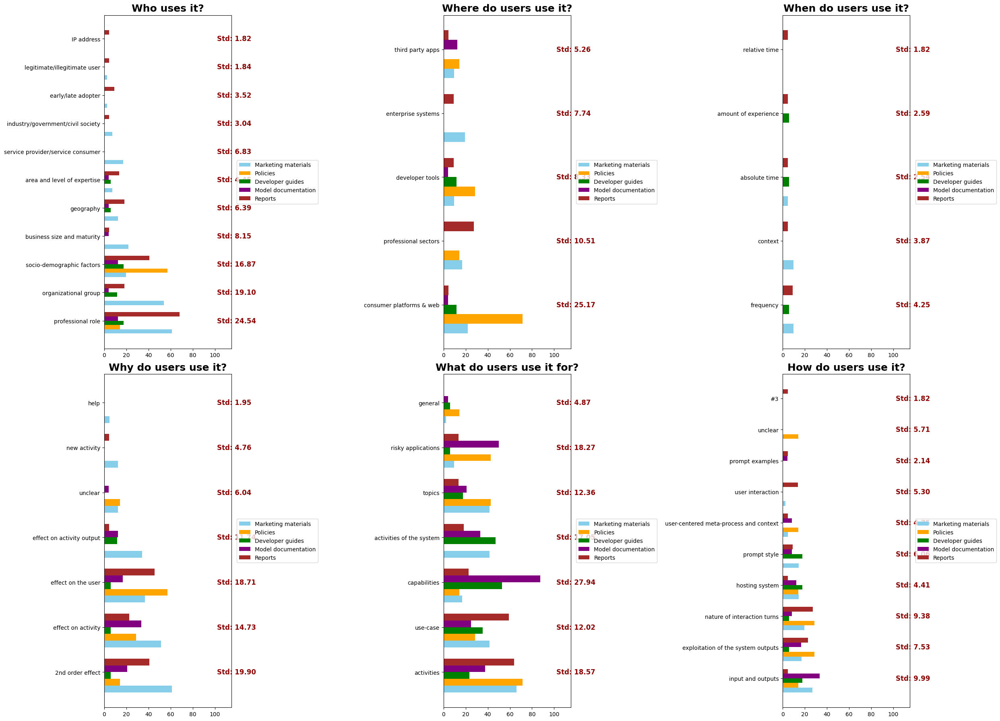

In [211]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 3, figsize=(25, 18), sharex=False, sharey=False)
question_id = 0
index_id = 0

colors = {
    "Marketing materials": "skyblue",
    "Policies": "orange",
    "Developer guides": "green",
    "Model documentation": "purple",
    "Reports": "brown"
}

for question in new_order:

    temp_dic = count_dictionary[question][question + "_questionLevel"]
    data_per_document = {doc: temp_dic[doc] for doc in colors.keys()}

    df_count = pd.DataFrame(data_per_document).fillna(0)
    df_count = df_count.loc[df_count.sum(axis=1).sort_values(ascending=False).index]

    ax = axes[index_id, question_id]

    # Row title
    ax.annotate(
        question,
        xy=(0.5, 1.02),
        xycoords="axes fraction",
        ha="center",
        va="center",
        fontsize=18,
        fontweight="bold"
    )

    # Grouped bar positions
    bar_height = 0.15
    y_positions = np.arange(len(df_count))

    # Plot each document type as a different color
    for i, doc in enumerate(df_count.columns):
        divisor = dict_documents[doc]["total"]  # total documents of this type
        values = df_count[doc] / divisor * 100

        ax.barh(
            y_positions + i * bar_height,
            values,
            height=bar_height,
            color=colors[doc],
            label=doc
        )

    # Y labels centered
    ax.set_yticks(y_positions + bar_height * (len(df_count.columns) / 2))
    ax.set_yticklabels(df_count.index, fontsize=10)

    # X-axis range extended for variance
    ax.set_xlim(0, 115)

    # Legend
    ax.legend(loc="center left", bbox_to_anchor=(1.02, 0.5))

    # ----------------------
    # Compute and annotate variance
    # ----------------------
    pct_matrix = np.array([df_count[doc] / dict_documents[doc]["total"] * 100 for doc in df_count.columns]).T
    variances = np.std(pct_matrix, axis=1)  # population variance; use ddof=1 for sample variance

    for yi, var in zip(y_positions, variances):
        ax.text(
            102,  # x-position just right of 100%
            yi + bar_height * (len(df_count.columns) / 2),
            f"Std: {var:.2f}",
            va="center",
            ha="left",
            fontsize=12,
            color="darkred",
            fontweight="bold"
        )

    # Move to next subplot
    question_id += 1
    if question_id > 2:
        question_id = 0
        index_id = 1

plt.tight_layout()
plt.savefig("plots/units_frequencyQuestions_perDocument_percentage_merged_with_variance.png")
plt.show()


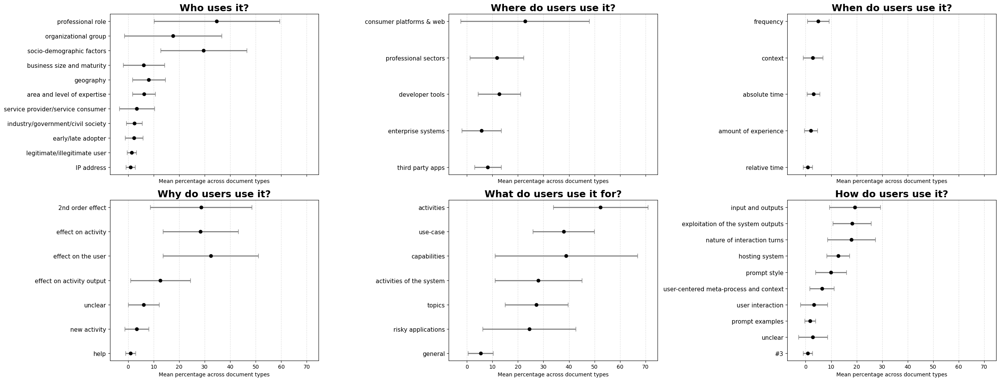

In [213]:
fig_ms, axes_ms = plt.subplots(2, 3, figsize=(26, 10), sharex=True)
question_id = 0
index_id = 0

for question in new_order:

    temp_dic = count_dictionary[question][question + "_questionLevel"]
    data_per_document = {doc: temp_dic[doc] for doc in colors.keys()}

    df_count = pd.DataFrame(data_per_document).fillna(0)
    df_count = df_count.loc[df_count.sum(axis=1).sort_values(ascending=False).index]

    # Build percentage matrix (rows = categories, cols = document types)
    pct_matrix = np.array([
        df_count[doc] / dict_documents[doc]["total"] * 100
        for doc in df_count.columns
    ]).T

    means = np.nanmean(pct_matrix, axis=1)
    stds = np.nanstd(pct_matrix, axis=1)

    ax = axes_ms[index_id, question_id]
    y = np.arange(len(df_count))

    # Mean ± Std (forest plot)
    ax.errorbar(
        means,
        y,
        xerr=stds,
        fmt="o",
        color="black",
        ecolor="gray",
        elinewidth=2,
        capsize=4
    )

    ax.set_yticks(y)
    ax.set_yticklabels(df_count.index, fontsize=11)
    ax.set_xlabel("Mean percentage across document types")
    ax.set_title(question, fontsize=18, fontweight="bold")

    ax.invert_yaxis()
    ax.grid(axis="x", linestyle="--", alpha=0.4)

    question_id += 1
    if question_id > 2:
        question_id = 0
        index_id += 1

plt.tight_layout()
plt.savefig(
    "plots/units_frequencyQuestions_perDocument_mean_std.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()


### Plot units of analysis per temporality

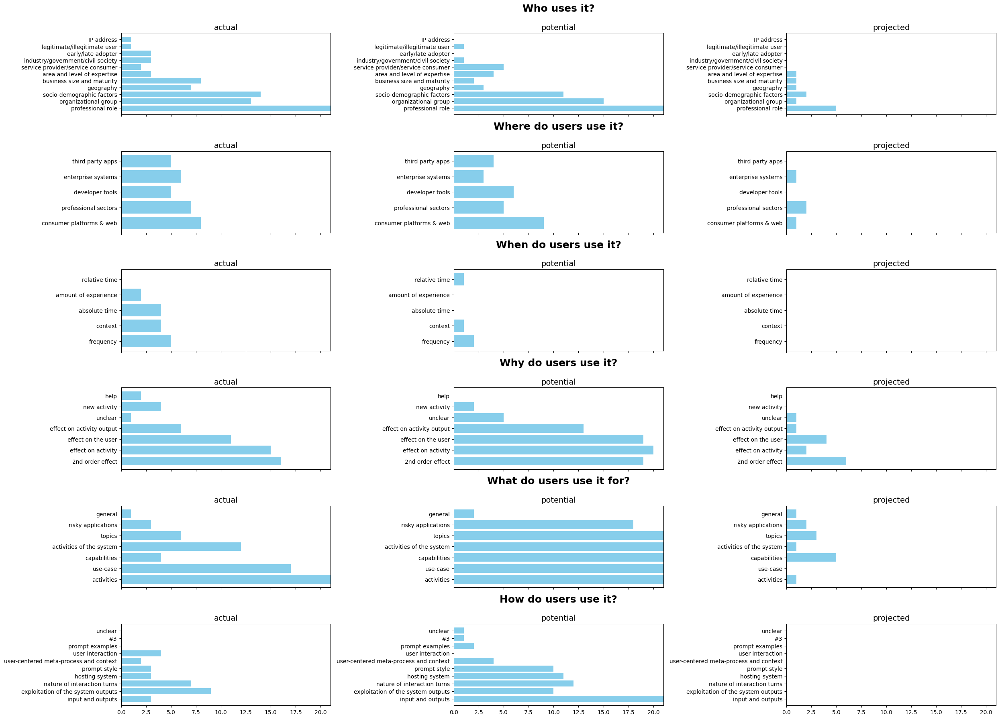

In [189]:
fig, axes = plt.subplots(6, 3, figsize=(25, 18), sharex=True, sharey=False)
#axes = axes.flatten()
question_id = 0

for question in new_order:
    temp_dic = count_dictionary[question]
    data_per_temporality = {}
    
    for temporality in ["actual", "potential", "projected"]:
        data_per_temporality[temporality] = temp_dic[question + "_" + temporality]["all"]

    df_count = pd.DataFrame(data_per_temporality).fillna(0)
    # Sort rows by total count (optional but makes plots more aligned)
    df_count = df_count.loc[df_count.sum(axis=1).sort_values(ascending=False).index]
    #print(df_count)
    
    # Shared x-axis limit
    max_val = df_count.values.max()
    #df_count.index = df_count.index.astype(str)
    #axes[question_id, 0].set_ylabel(question, fontsize=16, rotation=0, labelpad=120)
    left_ax = axes[question_id, 1]
    left_ax.annotate(
        question,
        xy=(0.5, 1.3),
        xycoords='axes fraction',
        ha='center', va='center',
        fontsize=18, fontweight='bold'
    )
    
    # ---- Create plots ----
    temporality_id = 0
    for temporality in df_count.columns:
        axes[question_id, temporality_id].barh(df_count.index, df_count[temporality], color="skyblue")
        axes[question_id, temporality_id].set_title(temporality, fontsize=14)
        axes[question_id, temporality_id].set_xlim(0, max_val)
        temporality_id += 1
    
    
    question_id += 1

plt.tight_layout()
plt.savefig("plots/units_frequencyQuestions_all_perTemporality.png")
#plt.show()    
    

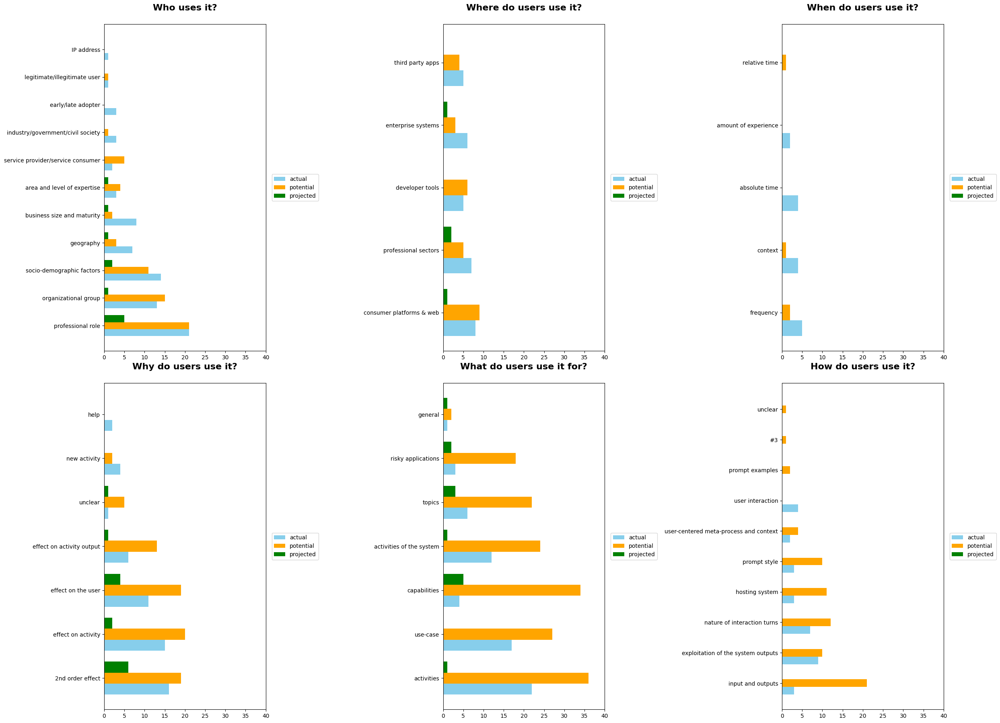

In [195]:
fig, axes = plt.subplots(2, 3, figsize=(25, 18), sharex=False, sharey=False)

question_id = 0
index_id = 0
colors = {"actual": "skyblue", "potential": "orange", "projected": "green"}

for question in new_order:
    temp_dic = count_dictionary[question]

    # Build dataframe
    data_per_temporality = {}
    for temporality in ["actual", "potential", "projected"]:
        data_per_temporality[temporality] = temp_dic[question + "_" + temporality]["all"]

    df_count = pd.DataFrame(data_per_temporality).fillna(0)
    df_count = df_count.loc[df_count.sum(axis=1).sort_values(ascending=False).index]

    # Select the middle axis (column 1)
    ax = axes[index_id,question_id]

    # Add row title
    ax.annotate(
        question,
        xy=(0.5, 1.05),
        xycoords='axes fraction',
        ha='center', va='center',
        fontsize=16, fontweight='bold'
    )

    # X-limit
    max_val = 40#df_count.values.max()

    # Create grouped bar plot
    bar_height = 0.25
    y_positions = np.arange(len(df_count))

    for i, temporality in enumerate(df_count.columns):
        ax.barh(
            y_positions + i*bar_height,
            df_count[temporality],
            height=bar_height,
            color=colors[temporality],
            label=temporality
        )

    # Y-axis labels once per row
    ax.set_yticks(y_positions + bar_height)
    ax.set_yticklabels(df_count.index)
    ax.set_xlim(0, max_val)
    ax.set_xlabel("")

    # Legend on the right
    ax.legend(loc="center left", bbox_to_anchor=(1.02, 0.5))

    # Hide the other axes in the row
    #axes[question_id, 0].axis('off')
    #axes[question_id, 2].axis('off')

    question_id += 1
    if question_id > 2:
        question_id =0
        index_id=1

plt.tight_layout()
plt.savefig("plots/units_frequencyQuestions_all_perTemporality_merged.png")

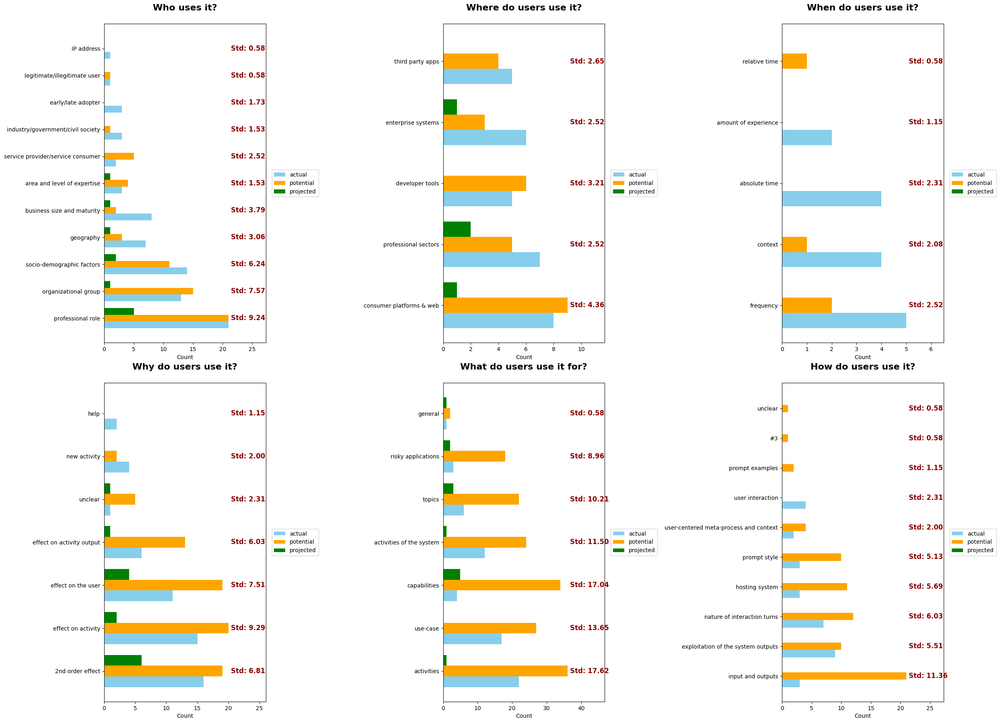

In [191]:

fig, axes = plt.subplots(2, 3, figsize=(25, 18), sharex=False, sharey=False)

question_id = 0
index_id = 0
colors = {"actual": "skyblue", "potential": "orange", "projected": "green"}

for question in new_order:
    temp_dic = count_dictionary[question]

    # Build dataframe
    data_per_temporality = {}
    for temporality in ["actual", "potential", "projected"]:
        data_per_temporality[temporality] = temp_dic[question + "_" + temporality]["all"]

    df_count = pd.DataFrame(data_per_temporality).fillna(0)
    df_count = df_count.loc[df_count.sum(axis=1).sort_values(ascending=False).index]

    # Select axis
    ax = axes[index_id, question_id]

    # Row title
    ax.annotate(
        question,
        xy=(0.5, 1.05),
        xycoords='axes fraction',
        ha='center', va='center',
        fontsize=16, fontweight='bold'
    )

    # X-limit
    max_val = df_count.values.max()

    # Horizontal bar positions
    bar_height = 0.25
    y_positions = np.arange(len(df_count))

    # Plot bars
    for i, temporality in enumerate(df_count.columns):
        ax.barh(
            y_positions + i * bar_height,
            df_count[temporality],
            height=bar_height,
            color=colors[temporality],
            label=temporality
        )

    # Y-axis labels
    ax.set_yticks(y_positions + bar_height)
    ax.set_yticklabels(df_count.index)
    ax.set_xlim(0, max_val * 1.3)   # extend axis to make room for variance text
    ax.set_xlabel("Count")

    # Legend
    ax.legend(loc="center left", bbox_to_anchor=(1.02, 0.5))

    
    variances = df_count.std(axis=1)

    for yi, var in zip(y_positions, variances):
        ax.text(
            max_val * 1.02,                   # x position to the right of bars
            yi + bar_height,                  # aligned with row label
            f"Std: {var:.2f}",                 # formatted variance
            va="center",
            ha="left",
            fontsize=12,
            color="darkred",                   # distinct color
            fontweight="bold"
        )

    # Step to next subplot
    question_id += 1
    if question_id > 2:
        question_id = 0
        index_id = 1

plt.tight_layout()
plt.savefig("plots/units_frequencyQuestions_all_perTemporality_merged_variance.png")


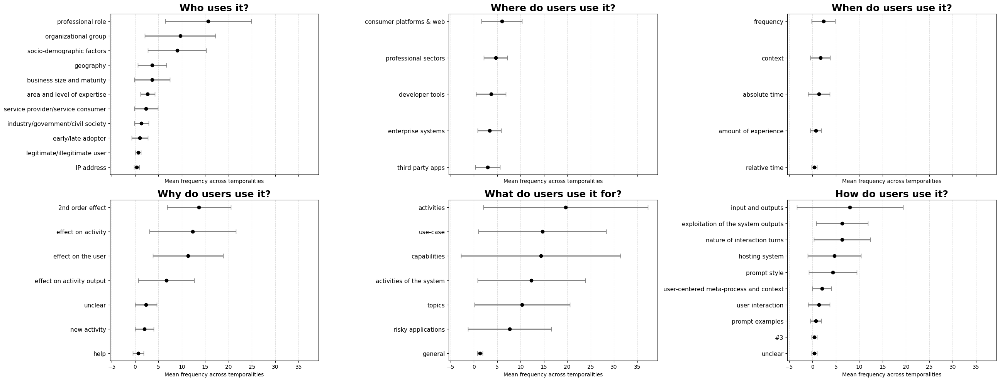

In [199]:
fig_ms, axes_ms = plt.subplots(2, 3, figsize=(26, 10), sharex=True)

question_id = 0
index_id = 0

for question in new_order:
    temp_dic = count_dictionary[question]

    # Build dataframe
    data_per_temporality = {
        temporality: temp_dic[question + "_" + temporality]["all"]
        for temporality in ["actual", "potential", "projected"]
    }

    df_count = pd.DataFrame(data_per_temporality).fillna(0)
    df_count = df_count.loc[df_count.sum(axis=1).sort_values(ascending=False).index]

    # Compute mean & std across temporalities
    means = df_count.mean(axis=1).values
    stds = df_count.std(axis=1).values

    ax = axes_ms[index_id, question_id]
    y = np.arange(len(df_count))

    # Mean ± Std (forest plot)
    ax.errorbar(
        means,
        y,
        xerr=stds,
        fmt="o",
        color="black",
        ecolor="gray",
        elinewidth=2,
        capsize=4
    )

    ax.set_yticks(y)
    ax.set_yticklabels(df_count.index, fontsize=11)
    ax.set_xlabel("Mean frequency across temporalities")
    ax.set_title(question, fontsize=18, fontweight="bold")

    ax.invert_yaxis()
    ax.grid(axis="x", linestyle="--", alpha=0.4)

    question_id += 1
    if question_id > 2:
        question_id = 0
        index_id += 1

plt.tight_layout()
plt.savefig(
    "plots/units_frequencyQuestions_all_perTemporality_mean_std.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()


# Study of co-occurences

In [358]:
def map_question_reporting_standard(row_label, df):
    print(row_label)

    format_dict = {"OpenAI": {}, "Anthropic":{}, "Meta":{}, "Microsoft":{}, "Google":{}, "AI2":{},\
                 "Marketing materials": {}, "Reports":{}, "Model documentation":{}, "Policies":{}, "Developer guides":{},\
                  "all":{}}
    
    start_idx = df.index.get_loc(row_label)
    # Get that row and the next three
    subset = df.iloc[start_idx+1:start_idx + 17]
    #print(subset)

    dict_to_populate = {row_label + "_actual": copy.deepcopy(format_dict), \
                       row_label + "_potential": copy.deepcopy(format_dict), \
                        row_label + "_projected": copy.deepcopy(format_dict), \
                       row_label + "_questionLevel": copy.deepcopy(format_dict)}

    
    for column_name in df.columns:
        if "LLM" not in column_name:
            if "Anthropic_21" not in column_name:
                if "Anthropic_16" not in column_name:
                    if "AI2_6" not in column_name:
                        if "AI2_7" not in column_name:
                            document_type = df[column_name]["Document categorization"]
                            company = df[column_name]["Company"]
                            information_actual = subset[column_name].loc["actual -category"]
                            information_potential = subset[column_name].loc["potential -category"]
                            information_projected = subset[column_name].loc["projected -category"]
                            if not pd.isna(information_actual):
                                temp_string = stringToList(information_actual)
                                for elem in temp_string:
                                    populateDict(elem, dict_to_populate[row_label + "_actual"][company])
                                    populateDict(elem, dict_to_populate[row_label + "_actual"][document_type])
                                    populateDict(elem, dict_to_populate[row_label + "_actual"]["all"])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"][company])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"][document_type])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"]["all"])
                            if not pd.isna(information_potential):
                                temp_string = stringToList(information_potential)
                                for elem in temp_string:
                                    populateDict(elem, dict_to_populate[row_label + "_potential"][company])
                                    populateDict(elem, dict_to_populate[row_label + "_potential"][document_type])
                                    populateDict(elem, dict_to_populate[row_label + "_potential"]["all"])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"][company])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"][document_type])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"]["all"])
                            if not pd.isna(information_projected):
                                temp_string = stringToList(information_projected)
                                for elem in temp_string:
                                    populateDict(elem, dict_to_populate[row_label + "_projected"][company])
                                    populateDict(elem, dict_to_populate[row_label + "_projected"][document_type])
                                    populateDict(elem, dict_to_populate[row_label + "_projected"]["all"])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"][company])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"][document_type])
                                    populateDict(elem, dict_to_populate[row_label + "_questionLevel"]["all"])

    return dict_to_populate


list_useQuestions = ["Who uses it?",  "Where do users use it?", "When do users use it?", "Why do users use it?",\
                     "What do users use it for?",\
                     "How do users use it?" ] #, 
count_dictionary = {}
for row_label in list_useQuestions:
    count_dictionary[row_label] = map_question_reporting_standard(row_label, df)


Who uses it?
Where do users use it?
When do users use it?
Why do users use it?
What do users use it for?
How do users use it?


In [359]:
dictionary_indices = {}
list_indices = []
for question in count_dictionary:
    temp= {**count_dictionary[question][question + "_actual"]['all'], \
          **count_dictionary[question][question + "_potential"]['all'],\
          **count_dictionary[question][question + "_projected"]['all']}
    dictionary_indices[question] = list(temp.keys())
    list_indices.append(list(temp.keys()))

def flatten(xss):
    return [x for xs in xss for x in xs]
list_indices_flat = ["Document categorization", "Company"] + flatten(list_indices)
df_units = pd.DataFrame(index=list_indices_flat)

In [360]:
list_useQuestions = ["Who uses it?",  "Where do users use it?", "What do users use it for?",\
                     "How do users use it?" , "When do users use it?", "Why do users use it?"] #, 

for column_name in df.columns:
        if "LLM" not in column_name:
            if "Anthropic_21" not in column_name:
                if "Anthropic_16" not in column_name:
                    if "AI2_6" not in column_name:
                        if "AI2_7" not in column_name:

                            temp_string = []
                            for row_label in list_useQuestions:
                                start_idx = df.index.get_loc(row_label)
                                subset = df.iloc[start_idx+1:start_idx + 17]

                                document_type = df[column_name]["Document categorization"]
                                company = df[column_name]["Company"]
                                information_actual = subset[column_name].loc["actual -category"]
                                information_potential = subset[column_name].loc["potential -category"]
                                information_projected = subset[column_name].loc["projected -category"]
                                
                                if not pd.isna(information_actual):
                                    temp_string.append(stringToList(information_actual))        
                                if not pd.isna(information_potential):
                                    temp_string.append(stringToList(information_potential))
                                if not pd.isna(information_projected):
                                    temp_string.append(stringToList(information_projected))
                            temp_string = list(set(flatten(temp_string)))
                            df_units[column_name] = df_units.index.isin(temp_string).astype(int)
                            df_units.at["Document categorization", column_name] = document_type
                            df_units.at["Company", column_name] = company


/var/folders/96/blzs496n26j3l5wls5rml_500000gn/T/ipykernel_53267/240905515.py:30: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Marketing materials' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_units.at["Document categorization", column_name] = document_type
/var/folders/96/blzs496n26j3l5wls5rml_500000gn/T/ipykernel_53267/240905515.py:30: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Marketing materials' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_units.at["Document categorization", column_name] = document_type
/var/folders/96/blzs496n26j3l5wls5rml_500000gn/T/ipykernel_53267/240905515.py:30: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Marketing m

In [361]:
who_clustering = {"organizational group": ['industry', 'company', 'department'], \
                "business size and maturity": ['business size', 'business maturity'],\
                "industry/government/civil society": ['for-profit/non-profit', 'public/private sector', 'regulated/unregulated industries'],\
                 "professional roles": ['professional/personal', 'professional role', 'career stage'],\
                 "area and level of expertise": ['expertise', 'field of study'], \
                 "geographies": ["country", "state", "geography"],\
                 "early or late adopter": ['innovator/adopter', 'early/late adopter'],\
                  'service provider or consumer': ['service provider/service consumer'],\
                  'socio-demographic factors': ['user','nationality','language','age','income','disability'],\
                  'IP address':['ip address'],\
                  'legitimate or illegitimate user':['legitimate/illegitimate user']
                 }

# Handle the clustering of the who
for new_row in who_clustering:
    row_values = (df_units.loc[who_clustering[new_row]].astype(bool).any(axis=0)).astype(int)
    row_values = pd.DataFrame([row_values], index=[new_row])
    #df_units.loc[new_row] = row_values
    df_units = pd.concat([df_units.iloc[:2], row_values, df_units.iloc[2:]])


    
    for old_row in who_clustering[new_row]:
        df_units = df_units.drop(old_row, axis=0)
print(df_units)

old_list = dictionary_indices['Who uses it?']
new_list = []
for elem in old_list:
    group_name = elem
    for key, values in who_clustering.items():
        if elem in values:
            group_name = key
            break
    new_list.append(group_name)
new_list = (list(set(new_list)))
dictionary_indices['Who uses it?'] = new_list
print(new_list)



new_order_list = []
existing_df_order = df_units.index.tolist()
for elem in existing_df_order:
    if elem in dictionary_indices['Who uses it?']:
        new_order_list.append(elem)
dictionary_indices['Who uses it?'] = new_order_list


                                         OpenAI_marketing_1  \
Document categorization                 Marketing materials   
Company                                              OpenAI   
legitimate or illegitimate user                           0   
IP address                                                0   
socio-demographic factors                                 0   
service provider or consumer                              0   
early or late adopter                                     0   
geographies                                               0   
area and level of expertise                               0   
professional roles                                        1   
industry/government/civil society                         0   
business size and maturity                                0   
organizational group                                      1   
customer loyalty                                          0   
underspecified background                              

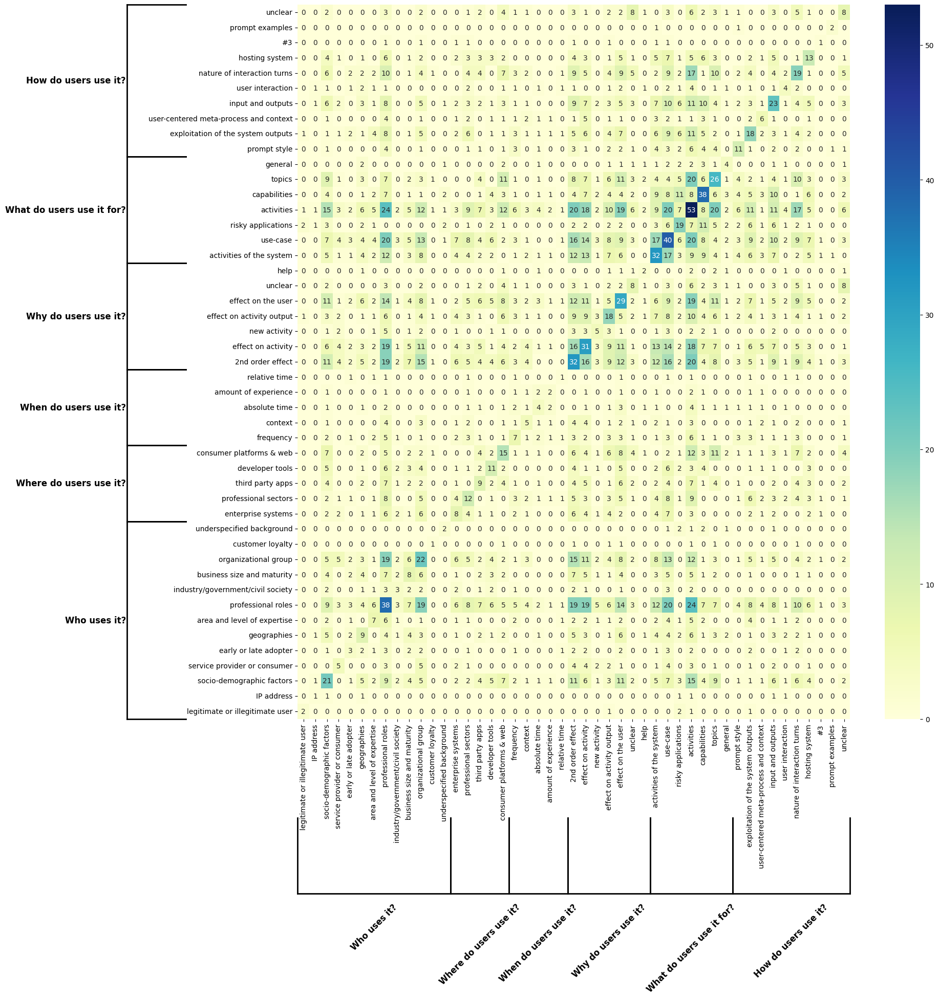

In [362]:


# --- Assume numeric_df is already your numeric data (from df_units.iloc[2:]) ---
numeric_df = df_units.iloc[2:].apply(pd.to_numeric, errors='coerce').fillna(0)

# Compute co-occurrence matrix
cooccurrence = numeric_df.dot(numeric_df.T)

# Ensure all row/column labels are strings and stripped
cooccurrence.index = cooccurrence.index.astype(str).str.strip()
cooccurrence.columns = cooccurrence.columns.astype(str).str.strip()

# --- Plot heatmap ---
plt.figure(figsize=(20, 20))
ax = sns.heatmap(cooccurrence, annot=True, cmap="YlGnBu")
ax.invert_yaxis()  # optional: match usual matrix layout

# --- U-shaped brackets for row groups ---
# --- Row brackets ---
for group_name, members in dictionary_indices.items():
    valid_members = [m for m in members if m in cooccurrence.index]
    if not valid_members:
        continue

    # Get integer positions
    start = [i for i, label in enumerate(cooccurrence.index) if label == valid_members[0]][0]
    end = [i for i, label in enumerate(cooccurrence.index) if label == valid_members[-1]][-1] + 1

    x_left = -14.5
    width = 5
    # Vertical line
    ax.plot([x_left, x_left], [start, end], color='black', lw=2, clip_on=False)
    # Top cap
    ax.plot([x_left, x_left + width], [start, start], color='black', lw=2, clip_on=False)
    # Bottom cap
    ax.plot([x_left, x_left + width], [end, end], color='black', lw=2, clip_on=False)

    # Label
    ax.text(x_left - 0.1, (start + end)/2, group_name,
            va='center', ha='right', fontsize=12, fontweight='bold', clip_on=False)

# --- U-shaped brackets for column groups ---
for group_name, members in dictionary_indices.items():
    valid_members = [m for m in members if m in cooccurrence.columns]
    if not valid_members:
        continue

    # Get integer positions
    start = [i for i, label in enumerate(cooccurrence.columns) if label == valid_members[0]][0]
    end = [i for i, label in enumerate(cooccurrence.columns) if label == valid_members[-1]][-1] + 1

    y_top = -11.5   # above heatmap
    height = 5   # vertical cap length

    # Horizontal line (U shape)
    ax.plot([start, end], [y_top, y_top], color='black', lw=2, clip_on=False)
    # Vertical caps pointing downward (toward labels)
    ax.plot([start, start], [y_top, y_top + height], color='black', lw=2, clip_on=False)
    ax.plot([end, end], [y_top, y_top + height], color='black', lw=2, clip_on=False)

    # Group name (centered above the U)
    ax.text((start + end)/2, y_top - 0.55, group_name,
            ha='center', va='top', fontsize=12, fontweight='bold', clip_on=False,rotation=45)
plt.tight_layout()
plt.savefig("plots/cooccurrence_units_all.png", dpi=300, bbox_inches="tight")
plt.show()


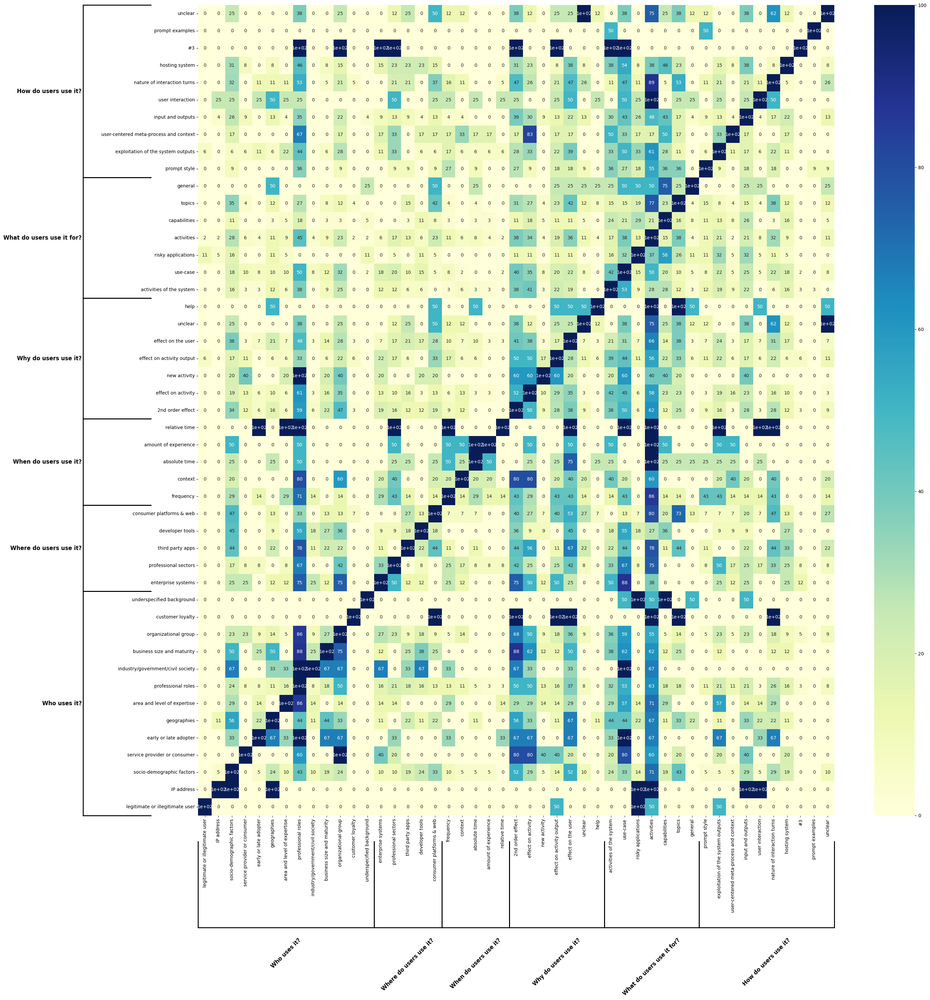

In [363]:
cooccurrence_normalized = cooccurrence.div(cooccurrence.max(axis=1), axis=0)
cooccurrence_normalized  = cooccurrence_normalized.round(2)*100
plt.figure(figsize=(30, 30))
ax = sns.heatmap(cooccurrence_normalized, annot=True, cmap="YlGnBu")
ax.invert_yaxis()  # optional: match usual matrix layout

# --- U-shaped brackets for row groups ---
# --- Row brackets ---
for group_name, members in dictionary_indices.items():
    valid_members = [m for m in members if m in cooccurrence.index]
    if not valid_members:
        continue

    # Get integer positions
    start = [i for i, label in enumerate(cooccurrence.index) if label == valid_members[0]][0]
    end = [i for i, label in enumerate(cooccurrence.index) if label == valid_members[-1]][-1] + 1

    x_left = -8.5
    width = 5
    # Vertical line
    ax.plot([x_left, x_left], [start, end], color='black', lw=2, clip_on=False)
    # Top cap
    ax.plot([x_left, x_left + width], [start, start], color='black', lw=2, clip_on=False)
    # Bottom cap
    ax.plot([x_left, x_left + width], [end, end], color='black', lw=2, clip_on=False)

    # Label
    ax.text(x_left - 0.1, (start + end)/2, group_name,
            va='center', ha='right', fontsize=12, fontweight='bold', clip_on=False)

# --- U-shaped brackets for column groups ---
for group_name, members in dictionary_indices.items():
    valid_members = [m for m in members if m in cooccurrence.columns]
    if not valid_members:
        continue

    # Get integer positions
    start = [i for i, label in enumerate(cooccurrence.columns) if label == valid_members[0]][0]
    end = [i for i, label in enumerate(cooccurrence.columns) if label == valid_members[-1]][-1] + 1

    y_top = -6.5   # above heatmap
    height = 5   # vertical cap length

    # Horizontal line (U shape)
    ax.plot([start, end], [y_top, y_top], color='black', lw=2, clip_on=False)
    # Vertical caps pointing downward (toward labels)
    ax.plot([start, start], [y_top, y_top + height], color='black', lw=2, clip_on=False)
    ax.plot([end, end], [y_top, y_top + height], color='black', lw=2, clip_on=False)

    # Group name (centered above the U)
    ax.text((start + end)/2, y_top - 0.55, group_name,
            ha='center', va='top', fontsize=12, fontweight='bold', clip_on=False,rotation=45)
plt.tight_layout()

plt.savefig("plots/cooccurence_units_all_percentage.png", dpi=300, bbox_inches="tight")

In [364]:
temp_cooccurrence = cooccurrence_normalized.copy()
temp_list = dictionary_indices['Where do users use it?'] + dictionary_indices['When do users use it?']
temp_cooccurrence = temp_cooccurrence.drop(index=temp_list, columns=temp_list, errors="ignore")

out = (
    temp_cooccurrence.stack()                                  # (row, column, value)
      .reset_index()
      .rename(columns={'level_0': 'row',
                       'level_1': 'column',
                       0: 'value'})
      .query("row != column")                   # ✅ remove row==column
      .sort_values('value', ascending=False)    # sort high → low
)
out = out[out['row'] != "#3"]
out = out[out['column'] != "#3"]
out = out[out['row'] != "unclear"]
out = out[out['column'] != "unclear"]
print(out)
#print(out[0:20])
out.to_csv("plots/list_cooccurrences.csv", index=False)

                        row                           column  value
42               IP address                      geographies  100.0
1170       user interaction                       activities  100.0
60               IP address                       activities  100.0
169   early or late adopter                         use-case  100.0
562            new activity               professional roles  100.0
...                     ...                              ...    ...
516        2nd order effect                  prompt examples    0.0
518      effect on activity  legitimate or illegitimate user    0.0
519      effect on activity                       IP address    0.0
529      effect on activity                 customer loyalty    0.0
530      effect on activity        underspecified background    0.0

[1122 rows x 3 columns]


In [365]:
latex_table = out[0:22].to_latex(index=False, caption='Ranked co-occurences', label='tab:cooccurences', float_format="%.2f")
latex_table = out[22:44].to_latex(index=False, caption='Ranked co-occurences', label='tab:cooccurences', float_format="%.2f")
latex_table = out[44:66].to_latex(index=False, caption='Ranked co-occurences', label='tab:cooccurences', float_format="%.2f")

print(latex_table)

\begin{table}
\caption{Ranked co-occurences}
\label{tab:cooccurences}
\begin{tabular}{llr}
\toprule
row & column & value \\
\midrule
early or late adopter & 2nd order effect & 67.00 \\
geographies & activities & 67.00 \\
early or late adopter & business size and maturity & 67.00 \\
early or late adopter & effect on activity & 67.00 \\
early or late adopter & organizational group & 67.00 \\
early or late adopter & nature of interaction turns & 67.00 \\
early or late adopter & effect on the user & 67.00 \\
industry/government/civil society & 2nd order effect & 67.00 \\
industry/government/civil society & activities & 67.00 \\
industry/government/civil society & socio-demographic factors & 67.00 \\
industry/government/civil society & organizational group & 67.00 \\
industry/government/civil society & business size and maturity & 67.00 \\
effect on the user & activities & 66.00 \\
professional roles & activities & 63.00 \\
2nd order effect & activities & 62.00 \\
business size and maturity

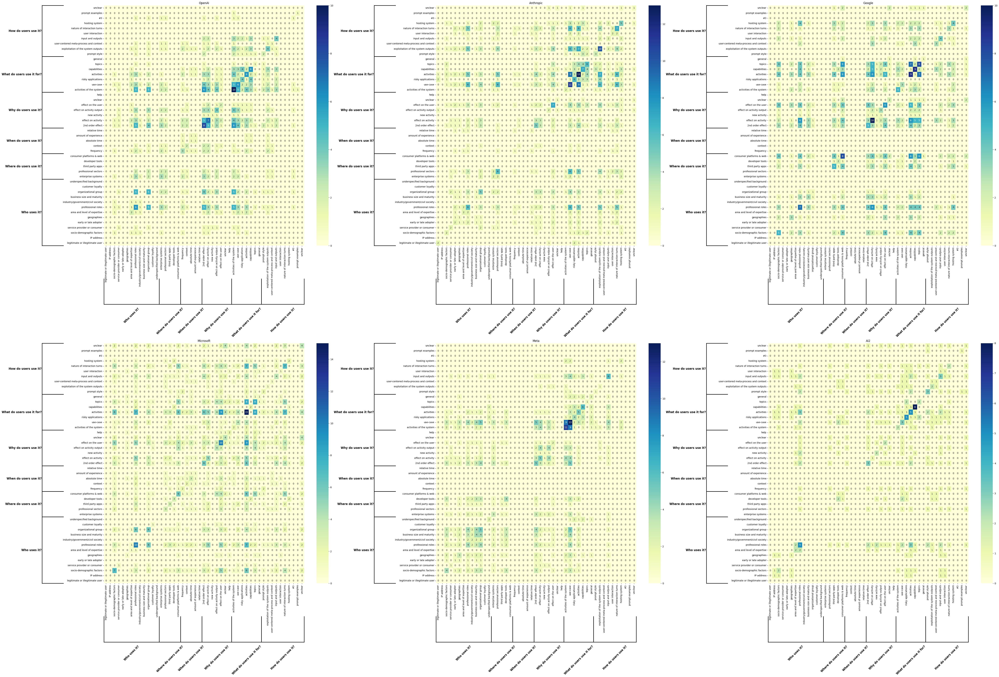

In [366]:
fig, axes = plt.subplots(2, 3, figsize=(60, 40))
row_id =0
column_id=0

for company in companies:

    # Condition: Select columns where the value in 'row2' is greater than 5
    row_to_check = 'Company'
    condition_value = company

    # Create a boolean mask for columns based on the condition in 'row2'
    column_mask = df.loc[row_to_check] == condition_value

    # Select columns using the boolean mask
    df_temp = df_units.loc[:, column_mask]

    
    #df_temp = df_units[df_units["Company" == company]]
    # --- Assume numeric_df is already your numeric data (from df_units.iloc[2:]) ---
    numeric_df = df_temp.iloc[2:].apply(pd.to_numeric, errors='coerce').fillna(0)
    
    # Compute co-occurrence matrix
    cooccurrence = numeric_df.dot(numeric_df.T)
    
    # Ensure all row/column labels are strings and stripped
    cooccurrence.index = cooccurrence.index.astype(str).str.strip()
    cooccurrence.columns = cooccurrence.columns.astype(str).str.strip()

    ax = axes[row_id, column_id]
    sns.heatmap(cooccurrence, annot=True, cmap="YlGnBu", ax=ax)
    ax.set_title(company)
    ax.invert_yaxis()  # optional: match usual matrix layout

    # --- U-shaped brackets for row groups ---
    # --- Row brackets ---
    for group_name, members in dictionary_indices.items():
        valid_members = [m for m in members if m in cooccurrence.index]
        if not valid_members:
            continue
    
        # Get integer positions
        start = [i for i, label in enumerate(cooccurrence.index) if label == valid_members[0]][0]
        end = [i for i, label in enumerate(cooccurrence.index) if label == valid_members[-1]][-1] + 1
    
        x_left = -14.5
        width = 5
        # Vertical line
        ax.plot([x_left, x_left], [start, end], color='black', lw=2, clip_on=False)
        # Top cap
        ax.plot([x_left, x_left + width], [start, start], color='black', lw=2, clip_on=False)
        # Bottom cap
        ax.plot([x_left, x_left + width], [end, end], color='black', lw=2, clip_on=False)
    
        # Label
        ax.text(x_left - 0.1, (start + end)/2, group_name,
                va='center', ha='right', fontsize=12, fontweight='bold', clip_on=False)
    
    # --- U-shaped brackets for column groups ---
    for group_name, members in dictionary_indices.items():
        valid_members = [m for m in members if m in cooccurrence.columns]
        if not valid_members:
            continue
    
        # Get integer positions
        start = [i for i, label in enumerate(cooccurrence.columns) if label == valid_members[0]][0]
        end = [i for i, label in enumerate(cooccurrence.columns) if label == valid_members[-1]][-1] + 1
    
        y_top = -11.5   # above heatmap
        height = 5   # vertical cap length
    
        # Horizontal line (U shape)
        ax.plot([start, end], [y_top, y_top], color='black', lw=2, clip_on=False)
        # Vertical caps pointing downward (toward labels)
        ax.plot([start, start], [y_top, y_top + height], color='black', lw=2, clip_on=False)
        ax.plot([end, end], [y_top, y_top + height], color='black', lw=2, clip_on=False)
    
        # Group name (centered above the U)
        ax.text((start + end)/2, y_top - 0.55, group_name,
                ha='center', va='top', fontsize=12, fontweight='bold', clip_on=False,rotation=45)

    column_id += 1
    if column_id > 2:
        column_id = 0
        row_id = 1

plt.tight_layout()    
plt.savefig("plots/cooccurrence_units_companies.png", dpi=300, bbox_inches="tight")
plt.show()


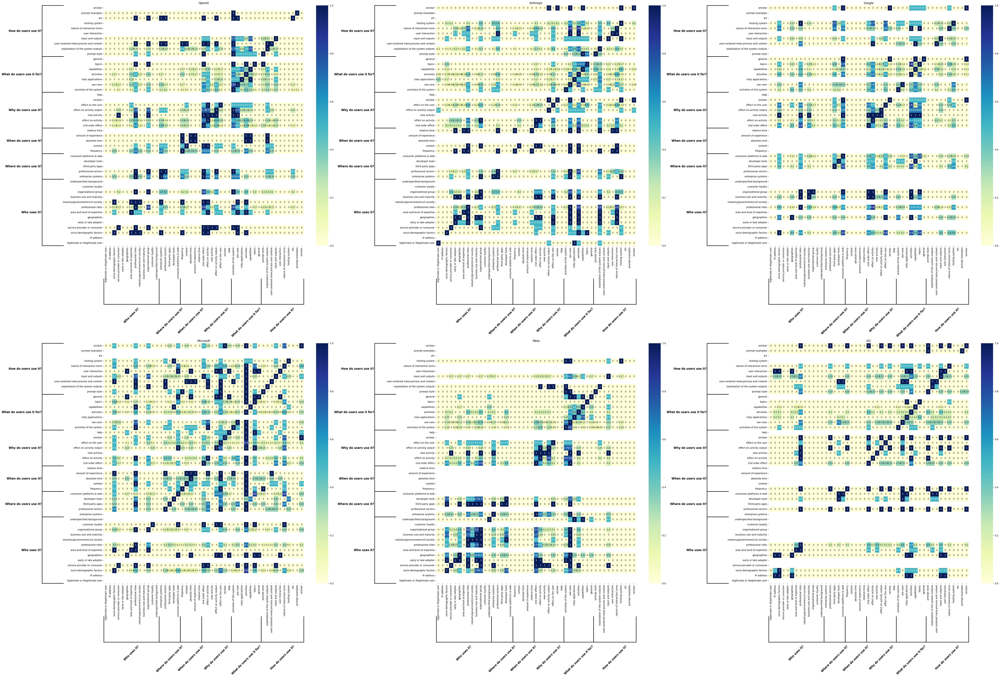

In [367]:
fig, axes = plt.subplots(2, 3, figsize=(60, 40))
row_id =0
column_id=0

for company in companies:

    # Condition: Select columns where the value in 'row2' is greater than 5
    row_to_check = 'Company'
    condition_value = company

    # Create a boolean mask for columns based on the condition in 'row2'
    column_mask = df.loc[row_to_check] == condition_value

    # Select columns using the boolean mask
    df_temp = df_units.loc[:, column_mask]

    
    #df_temp = df_units[df_units["Company" == company]]
    # --- Assume numeric_df is already your numeric data (from df_units.iloc[2:]) ---
    numeric_df = df_temp.iloc[2:].apply(pd.to_numeric, errors='coerce').fillna(0)
    
    # Compute co-occurrence matrix
    cooccurrence = numeric_df.dot(numeric_df.T)
    cooccurrence = cooccurrence.div(cooccurrence.max(axis=1), axis=0)
    cooccurrence  = cooccurrence.round(2)
    
    # Ensure all row/column labels are strings and stripped
    cooccurrence.index = cooccurrence.index.astype(str).str.strip()
    cooccurrence.columns = cooccurrence.columns.astype(str).str.strip()

    ax = axes[row_id, column_id]
    sns.heatmap(cooccurrence, annot=True, cmap="YlGnBu", ax=ax)
    ax.set_title(company)
    ax.invert_yaxis()  # optional: match usual matrix layout

    # --- U-shaped brackets for row groups ---
    # --- Row brackets ---
    for group_name, members in dictionary_indices.items():
        valid_members = [m for m in members if m in cooccurrence.index]
        if not valid_members:
            continue
    
        # Get integer positions
        start = [i for i, label in enumerate(cooccurrence.index) if label == valid_members[0]][0]
        end = [i for i, label in enumerate(cooccurrence.index) if label == valid_members[-1]][-1] + 1
    
        x_left = -14.5
        width = 5
        # Vertical line
        ax.plot([x_left, x_left], [start, end], color='black', lw=2, clip_on=False)
        # Top cap
        ax.plot([x_left, x_left + width], [start, start], color='black', lw=2, clip_on=False)
        # Bottom cap
        ax.plot([x_left, x_left + width], [end, end], color='black', lw=2, clip_on=False)
    
        # Label
        ax.text(x_left - 0.1, (start + end)/2, group_name,
                va='center', ha='right', fontsize=12, fontweight='bold', clip_on=False)
    
    # --- U-shaped brackets for column groups ---
    for group_name, members in dictionary_indices.items():
        valid_members = [m for m in members if m in cooccurrence.columns]
        if not valid_members:
            continue
    
        # Get integer positions
        start = [i for i, label in enumerate(cooccurrence.columns) if label == valid_members[0]][0]
        end = [i for i, label in enumerate(cooccurrence.columns) if label == valid_members[-1]][-1] + 1
    
        y_top = -11.5   # above heatmap
        height = 5   # vertical cap length
    
        # Horizontal line (U shape)
        ax.plot([start, end], [y_top, y_top], color='black', lw=2, clip_on=False)
        # Vertical caps pointing downward (toward labels)
        ax.plot([start, start], [y_top, y_top + height], color='black', lw=2, clip_on=False)
        ax.plot([end, end], [y_top, y_top + height], color='black', lw=2, clip_on=False)
    
        # Group name (centered above the U)
        ax.text((start + end)/2, y_top - 0.55, group_name,
                ha='center', va='top', fontsize=12, fontweight='bold', clip_on=False,rotation=45)

    column_id += 1
    if column_id > 2:
        column_id = 0
        row_id = 1

plt.tight_layout()    
plt.savefig("plots/cooccurrence_units_companies_percentage.png", dpi=300, bbox_inches="tight")
plt.show()


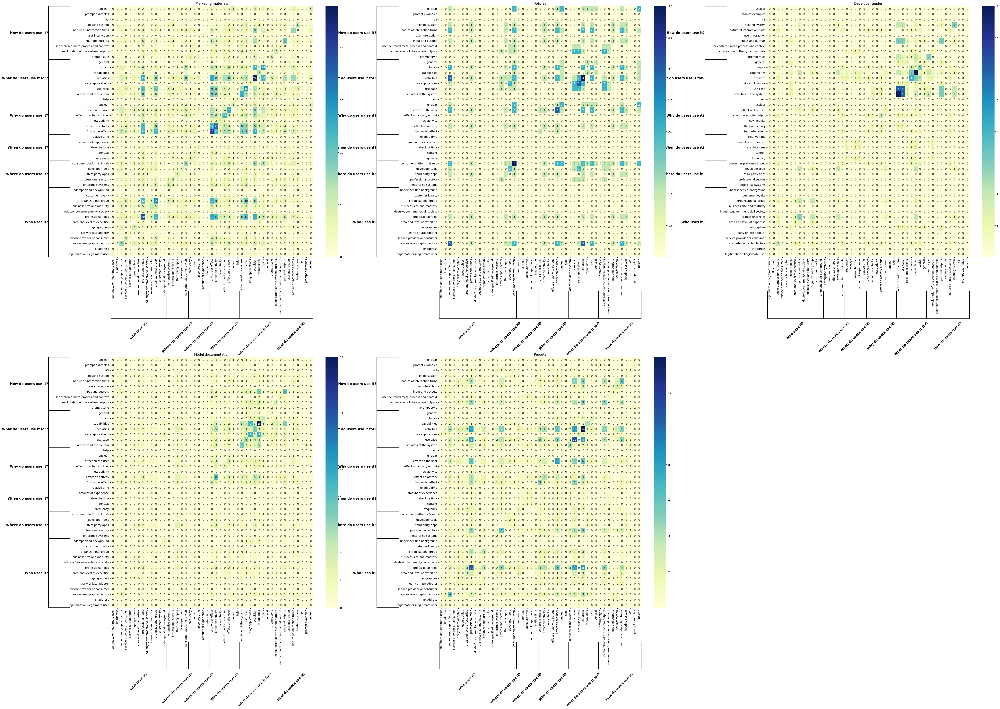

In [368]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(60, 40))

# Create a 3x2 grid — all cells same size
gs = GridSpec(2, 3, figure=fig, hspace=0.4, wspace=0.3)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[1, 0])
ax5 = fig.add_subplot(gs[1, 1])

fig_list = [ax1, ax2, ax3, ax4, ax5]
fig_id=0

document_list = ["Marketing materials", "Policies", "Developer guides", "Model documentation", "Reports"]

for document_type in document_list:
    ax = fig_list[fig_id]

    # Condition: Select columns where the value in 'row2' is greater than 5
    row_to_check = 'Document categorization'
    condition_value = document_type

    # Create a boolean mask for columns based on the condition in 'row2'
    column_mask = df.loc[row_to_check] == condition_value

    # Select columns using the boolean mask
    df_temp = df_units.loc[:, column_mask]

    
    #df_temp = df_units[df_units["Company" == company]]
    # --- Assume numeric_df is already your numeric data (from df_units.iloc[2:]) ---
    numeric_df = df_temp.iloc[2:].apply(pd.to_numeric, errors='coerce').fillna(0)
    
    # Compute co-occurrence matrix
    cooccurrence = numeric_df.dot(numeric_df.T)
    
    # Ensure all row/column labels are strings and stripped
    cooccurrence.index = cooccurrence.index.astype(str).str.strip()
    cooccurrence.columns = cooccurrence.columns.astype(str).str.strip()

    sns.heatmap(cooccurrence, annot=True, cmap="YlGnBu", ax=ax)
    ax.set_title(document_type)
    ax.invert_yaxis()  # optional: match usual matrix layout

    # --- U-shaped brackets for row groups ---
    # --- Row brackets ---
    for group_name, members in dictionary_indices.items():
        valid_members = [m for m in members if m in cooccurrence.index]
        if not valid_members:
            continue
    
        # Get integer positions
        start = [i for i, label in enumerate(cooccurrence.index) if label == valid_members[0]][0]
        end = [i for i, label in enumerate(cooccurrence.index) if label == valid_members[-1]][-1] + 1
    
        x_left = -14.5
        width = 5
        # Vertical line
        ax.plot([x_left, x_left], [start, end], color='black', lw=2, clip_on=False)
        # Top cap
        ax.plot([x_left, x_left + width], [start, start], color='black', lw=2, clip_on=False)
        # Bottom cap
        ax.plot([x_left, x_left + width], [end, end], color='black', lw=2, clip_on=False)
    
        # Label
        ax.text(x_left - 0.1, (start + end)/2, group_name,
                va='center', ha='right', fontsize=12, fontweight='bold', clip_on=False)
    
    # --- U-shaped brackets for column groups ---
    for group_name, members in dictionary_indices.items():
        valid_members = [m for m in members if m in cooccurrence.columns]
        if not valid_members:
            continue
    
        # Get integer positions
        start = [i for i, label in enumerate(cooccurrence.columns) if label == valid_members[0]][0]
        end = [i for i, label in enumerate(cooccurrence.columns) if label == valid_members[-1]][-1] + 1
    
        y_top = -11.5   # above heatmap
        height = 5   # vertical cap length
    
        # Horizontal line (U shape)
        ax.plot([start, end], [y_top, y_top], color='black', lw=2, clip_on=False)
        # Vertical caps pointing downward (toward labels)
        ax.plot([start, start], [y_top, y_top + height], color='black', lw=2, clip_on=False)
        ax.plot([end, end], [y_top, y_top + height], color='black', lw=2, clip_on=False)
    
        # Group name (centered above the U)
        ax.text((start + end)/2, y_top - 0.55, group_name,
                ha='center', va='top', fontsize=12, fontweight='bold', clip_on=False,rotation=45)

    fig_id+=1

plt.savefig("plots/cooccurrence_units_documents.png", dpi=300, bbox_inches="tight")
plt.show()


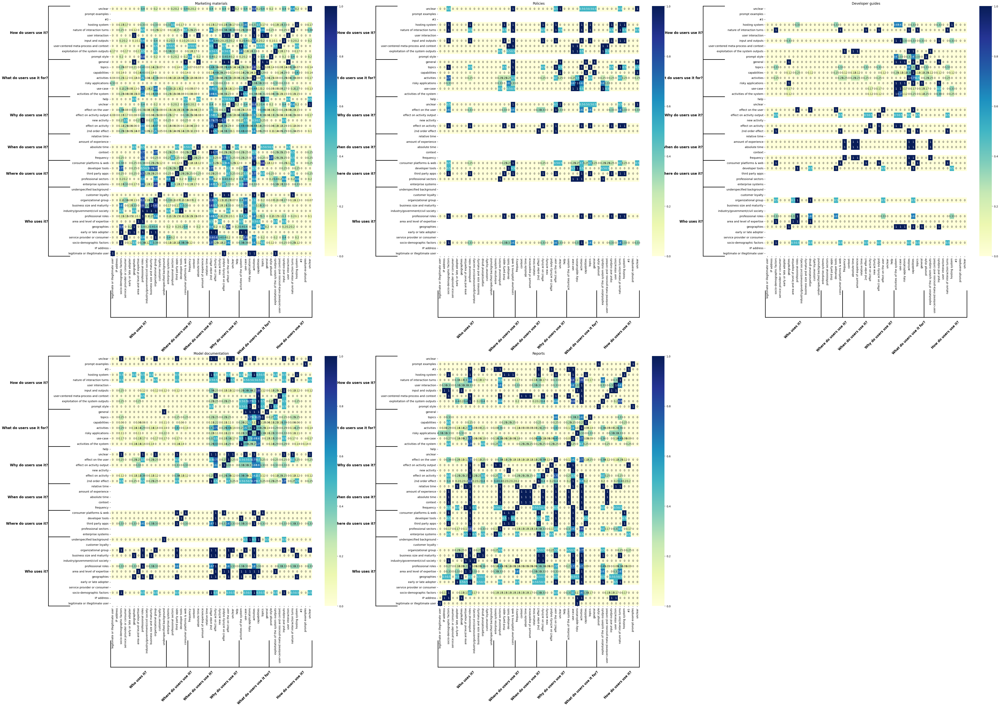

In [226]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(60, 40))

# Create a 3x2 grid — all cells same size
gs = GridSpec(2, 3, figure=fig, hspace=0.4, wspace=0.3)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[1, 0])
ax5 = fig.add_subplot(gs[1, 1])

fig_list = [ax1, ax2, ax3, ax4, ax5]
fig_id=0

document_list = ["Marketing materials", "Policies", "Developer guides", "Model documentation", "Reports"]

for document_type in document_list:
    ax = fig_list[fig_id]

    # Condition: Select columns where the value in 'row2' is greater than 5
    row_to_check = 'Document categorization'
    condition_value = document_type

    # Create a boolean mask for columns based on the condition in 'row2'
    column_mask = df.loc[row_to_check] == condition_value

    # Select columns using the boolean mask
    df_temp = df_units.loc[:, column_mask]

    
    #df_temp = df_units[df_units["Company" == company]]
    # --- Assume numeric_df is already your numeric data (from df_units.iloc[2:]) ---
    numeric_df = df_temp.iloc[2:].apply(pd.to_numeric, errors='coerce').fillna(0)
    
    # Compute co-occurrence matrix
    cooccurrence = numeric_df.dot(numeric_df.T)
    cooccurrence = cooccurrence.div(cooccurrence.max(axis=1), axis=0)
    cooccurrence  = cooccurrence.round(2)
    
    # Ensure all row/column labels are strings and stripped
    cooccurrence.index = cooccurrence.index.astype(str).str.strip()
    cooccurrence.columns = cooccurrence.columns.astype(str).str.strip()

    sns.heatmap(cooccurrence, annot=True, cmap="YlGnBu", ax=ax)
    ax.set_title(document_type)
    ax.invert_yaxis()  # optional: match usual matrix layout

    # --- U-shaped brackets for row groups ---
    # --- Row brackets ---
    for group_name, members in dictionary_indices.items():
        valid_members = [m for m in members if m in cooccurrence.index]
        if not valid_members:
            continue
    
        # Get integer positions
        start = [i for i, label in enumerate(cooccurrence.index) if label == valid_members[0]][0]
        end = [i for i, label in enumerate(cooccurrence.index) if label == valid_members[-1]][-1] + 1
    
        x_left = -14.5
        width = 5
        # Vertical line
        ax.plot([x_left, x_left], [start, end], color='black', lw=2, clip_on=False)
        # Top cap
        ax.plot([x_left, x_left + width], [start, start], color='black', lw=2, clip_on=False)
        # Bottom cap
        ax.plot([x_left, x_left + width], [end, end], color='black', lw=2, clip_on=False)
    
        # Label
        ax.text(x_left - 0.1, (start + end)/2, group_name,
                va='center', ha='right', fontsize=12, fontweight='bold', clip_on=False)
    
    # --- U-shaped brackets for column groups ---
    for group_name, members in dictionary_indices.items():
        valid_members = [m for m in members if m in cooccurrence.columns]
        if not valid_members:
            continue
    
        # Get integer positions
        start = [i for i, label in enumerate(cooccurrence.columns) if label == valid_members[0]][0]
        end = [i for i, label in enumerate(cooccurrence.columns) if label == valid_members[-1]][-1] + 1
    
        y_top = -11.5   # above heatmap
        height = 5   # vertical cap length
    
        # Horizontal line (U shape)
        ax.plot([start, end], [y_top, y_top], color='black', lw=2, clip_on=False)
        # Vertical caps pointing downward (toward labels)
        ax.plot([start, start], [y_top, y_top + height], color='black', lw=2, clip_on=False)
        ax.plot([end, end], [y_top, y_top + height], color='black', lw=2, clip_on=False)
    
        # Group name (centered above the U)
        ax.text((start + end)/2, y_top - 0.55, group_name,
                ha='center', va='top', fontsize=12, fontweight='bold', clip_on=False,rotation=45)

    fig_id+=1

plt.savefig("plots/cooccurrence_units_documents_percentage.png", dpi=300, bbox_inches="tight")
plt.show()


# Plot similarities

In [297]:
# Prepare the right pandas dataframe
context = ['Who uses it?', 'Where do users use it?', 'When do users use it?']
interaction = ['Why do users use it?', 'What do users use it for?', 'How do users use it?']


list_df = []
for question in new_order:

    temp_dic = count_dictionary[question][question + "_questionLevel"]

    # Extract data per company
    data_per_company = {}
    for company in companies:
        denom = total_company[company]
        base_dic = temp_dic[company] 
        new_dict = {key: value / denom * 100 for key, value in base_dic.items()}
        data_per_company[company] = new_dict
        
    df_count = pd.DataFrame(data_per_company).fillna(0)
    df_count['units'] = df_count.index
    df_count['question'] = question
    df_count = df_count.reset_index(drop=True)
    if question in context:
        df_count['type'] = 'context'
    else:
        df_count['type'] = 'interaction'

    list_df.append(df_count)

base_df = pd.concat(list_df, axis=0)
   


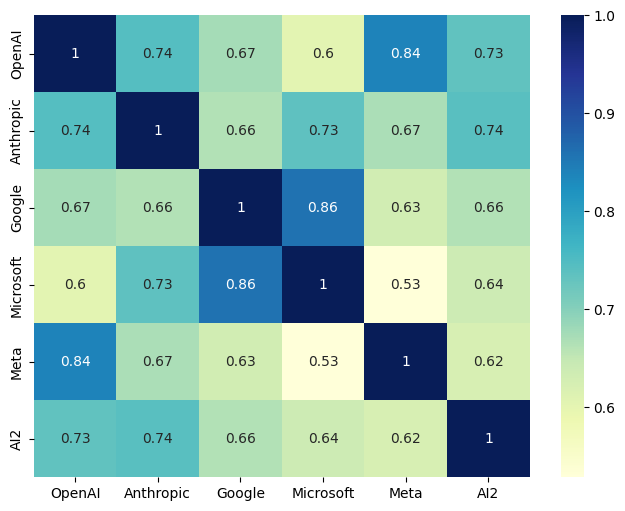

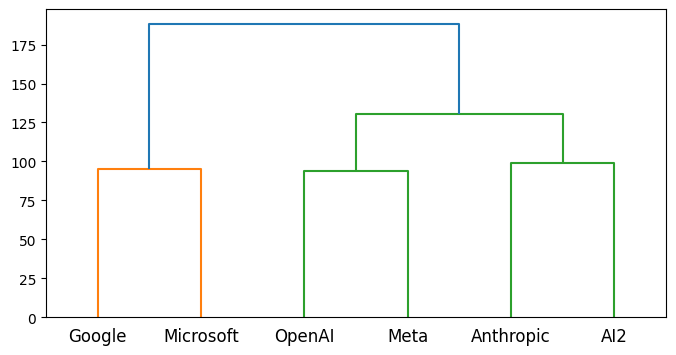

In [298]:
# Compute the distribution

def compute_distribution(df_distribution):
    similarity_matrix = pd.DataFrame(
        cosine_similarity(df_distribution.T),
        index=df_distribution.columns,
        columns=df_distribution.columns
    )
    #print(similarity_matrix)
    return similarity_matrix

def plot_similarity_matrix(similarity_matrix, title):
    plt.figure(figsize=(8,6))
    sns.heatmap(similarity_matrix, annot=True, cmap="YlGnBu")
    #plt.title("Company Similarity (Cosine)")
    plt.savefig("plots/units_similarity_" + title + ".png")
    plt.show()

def plot_similarity_cluster(df_distribution, title):
    plt.figure(figsize=(8, 4))
    Z = linkage(df_distribution.T, method='ward')
    dendrogram(Z, labels=df_distribution.columns)
    #plt.title("Company Clustering")
    plt.savefig("plots/units_similarity_clustering_" + title + ".png")
    plt.show()

df_distribution = base_df[companies]
similarity_matrix = compute_distribution(df_distribution)
plot_similarity_matrix(similarity_matrix, "all_company")
plot_similarity_cluster(df_distribution, "all_company")

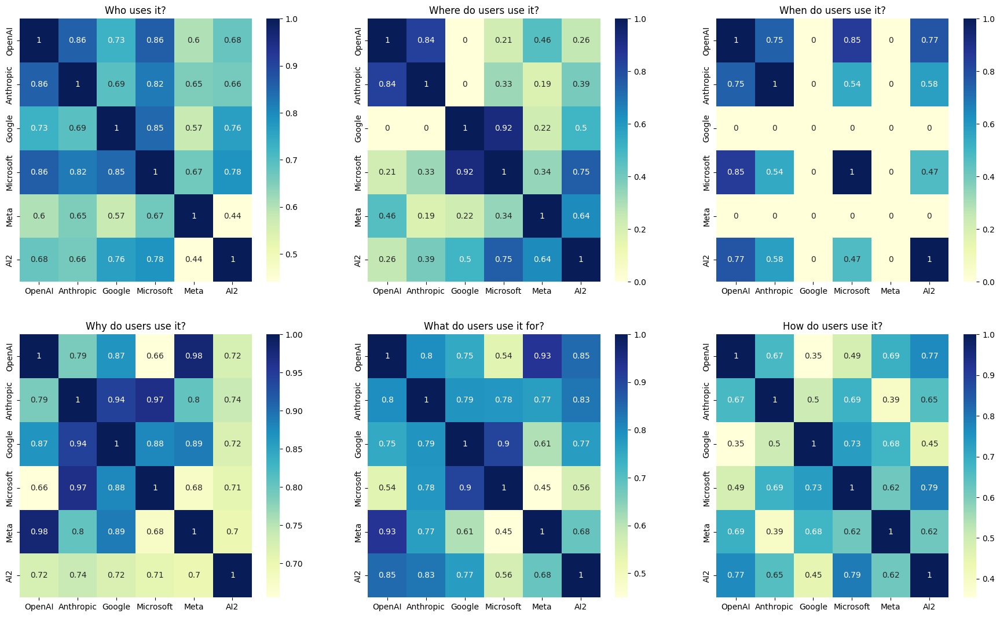

In [299]:
# Compute the distribution for each question

def similarities_question(base_df, dimension_list, title, new_order):

    fig, axes = plt.subplots(2, 3, figsize=(22, 13), sharex=False, sharey=False)
    question_id = 0
    index_id = 0
    
    for question in new_order:
        ax = axes[index_id, question_id]
        
        df_distribution = base_df[base_df['question'] == question]
        df_distribution = df_distribution[dimension_list]
        similarity_matrix = compute_distribution(df_distribution)
    
        sns.heatmap(similarity_matrix, annot=True, cmap="YlGnBu", ax=ax)
        ax.set_title(question)
        
        question_id += 1
        if question_id > 2:
            question_id = 0
            index_id += 1
        
    fig.savefig("plots/units_similarity_question_" + title + ".png")    

similarities_question(base_df, companies, 'company', new_order)

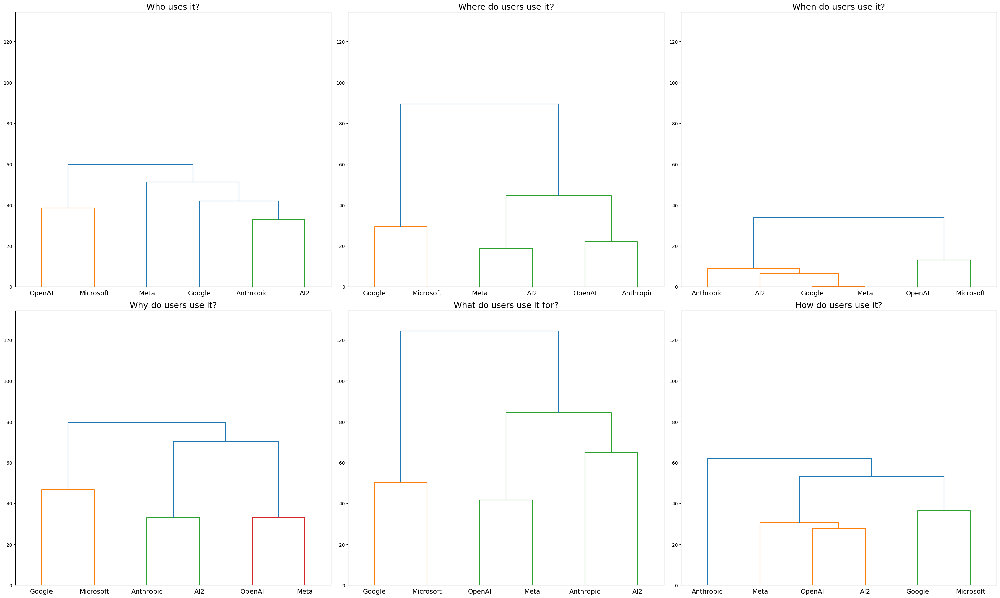

In [300]:
def dendograms_questions(base_df, dimension_list, title, new_order):
    
    fig, axes = plt.subplots(2, 3, figsize=(30, 18), sharex=False, sharey=False)
    
    # First pass: compute y-limits across all dendrograms
    global_min = np.inf
    global_max = -np.inf
    all_dcoords = []
    
    for question in new_order:
        df_distribution = base_df[base_df['question'] == question]
        df_distribution = df_distribution[dimension_list]
    
        # Compute linkage
        Z = linkage(df_distribution.T, method='ward')
    
        # Compute dendrogram without plotting to extract coord bounds
        ddata = dendrogram(Z, no_plot=True)

        # collect all distances
        dcoords = ddata["dcoord"]
        all_dcoords.extend(dcoords)
    
    # Compute global y-limits
    all_vals = [v for d in all_dcoords for v in d]
    global_min = min(all_vals)
    global_max = max(all_vals)
    
    # ------------------------------------------------------------
    # Second pass: create the actual subplots
    # ------------------------------------------------------------
    
    question_id = 0
    row = 0
    
    for i, question in enumerate(new_order):
        col = i % 3
        row = i // 3
    
        ax = axes[row, col]
    
        df_distribution = base_df[base_df['question'] == question]
        df_distribution = df_distribution[dimension_list]
    
        # Compute linkage
        Z = linkage(df_distribution.T, method='ward')
    
        dendrogram(
            Z,
            labels=df_distribution.columns,
            ax=ax,
            leaf_rotation=0,
            leaf_font_size=14,
        )
    
        ax.set_ylim(global_min, global_max+10)
        ax.set_title(question, fontsize=18)
    
    # ------------------------------------------------------------
    # Layout adjustments to make labels visible
    # ------------------------------------------------------------
    
    
    # Increase left margin enough so y-labels never clip
    plt.subplots_adjust(left=0.18, right=0.98, top=0.95, bottom=0.05)
    plt.tight_layout()
    plt.savefig("plots/units_similarity_clustering_question_" + title + ".png")    
    plt.show()

dendograms_questions(base_df, companies, 'companies', new_order)

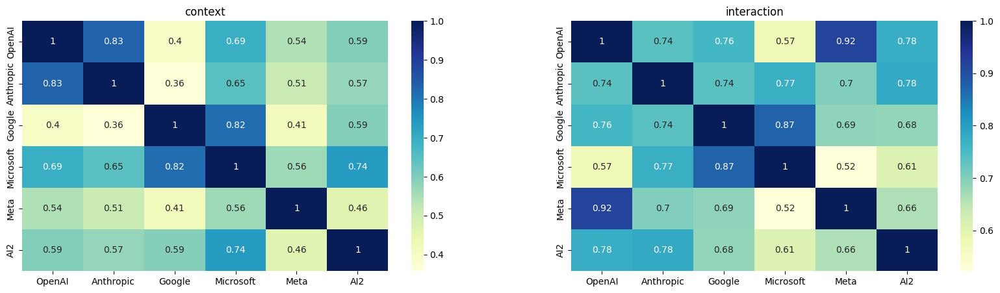

In [301]:
# Compute the distribution for each type of question

def similarity_questionType(base_df, dimension_list, title, new_order):

    fig, axes = plt.subplots(1, 2, figsize=(20, 5), sharex=False, sharey=False)
    idx = 0
    for type_question in ['context', 'interaction']:
        ax = axes[idx]
        
        df_distribution = base_df[base_df['type'] == type_question]
        df_distribution = df_distribution[dimension_list]
        similarity_matrix = compute_distribution(df_distribution)
    
        sns.heatmap(similarity_matrix, annot=True, cmap="YlGnBu", ax=ax)
        ax.set_title(type_question)
        
        idx+=1
        
    fig.savefig("plots/units_similarity_questionType_" + title + ".png")    

similarity_questionType(base_df, companies, 'companies', new_order)

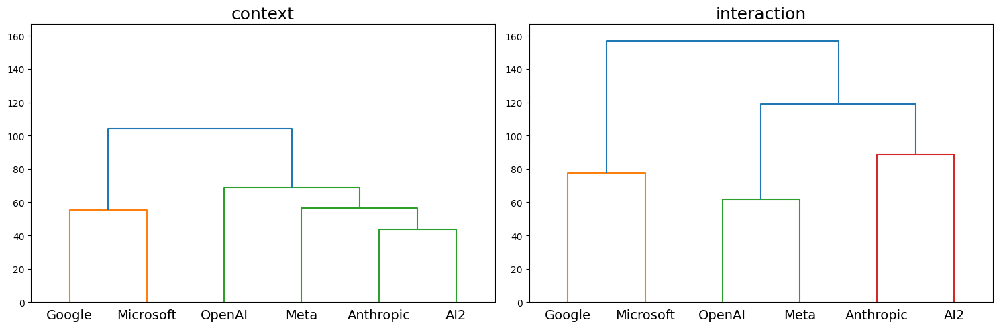

In [302]:
def dendograms_questionType(base_df, dimension_list, title, new_order):

    fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharex=False, sharey=False)
    
    # First pass: compute y-limits across all dendrograms
    global_min = np.inf
    global_max = -np.inf
    all_dcoords = []
    
    idx = 0
    for type_question in ['context', 'interaction']:
        ax = axes[idx]
        df_distribution = base_df[base_df['type'] == type_question]
        df_distribution = df_distribution[dimension_list]
    
        # Compute linkage
        Z = linkage(df_distribution.T, method='ward')
    
        # Compute dendrogram without plotting to extract coord bounds
        ddata = dendrogram(Z, no_plot=True)
    
        # collect all distances
        dcoords = ddata["dcoord"]
        all_dcoords.extend(dcoords)
    
    # Compute global y-limits
    all_vals = [v for d in all_dcoords for v in d]
    global_min = min(all_vals)
    global_max = max(all_vals)
    
    # ------------------------------------------------------------
    # Second pass: create the actual subplots
    # ------------------------------------------------------------



    idx = 0
    for type_question in ['context', 'interaction']:
        ax = axes[idx]
        df_distribution = base_df[base_df['type'] == type_question]
        df_distribution = df_distribution[dimension_list]
    
        # Compute linkage
        Z = linkage(df_distribution.T, method='ward')
    
        dendrogram(
            Z,
            labels=df_distribution.columns,
            ax=ax,
            leaf_rotation=0,
            leaf_font_size=14,
        )
    
        ax.set_ylim(global_min, global_max+10)
        ax.set_title(type_question, fontsize=18)
        idx+=1
    
    # ------------------------------------------------------------
    # Layout adjustments to make labels visible
    # ------------------------------------------------------------
    
    
    # Increase left margin enough so y-labels never clip
    plt.subplots_adjust(left=0.18, right=0.98, top=0.95, bottom=0.05)
    plt.tight_layout()
    plt.savefig("plots/units_similarity_clustering_questionType_" + title+ ".png")    
    plt.show()
dendograms_questionType(base_df, companies, 'companies', new_order)

In [303]:
# Prepare the right pandas dataframe
context = ['Who uses it?', 'Where do users use it?', 'When do users use it?']
interaction = ['Why do users use it?', 'What do users use it for?', 'How do users use it?']
document_types = ["Marketing materials", "Policies", "Developer guides", "Model documentation", "Reports"]

list_df = []
for question in new_order:

    temp_dic = count_dictionary[question][question + "_questionLevel"]

    # Extract data per document type
    data_per_document = {}
    for document in document_types:
        denom = dict_documents[document]['total']
        base_dic = temp_dic[document] 
        new_dict = {key: value / denom * 100 for key, value in base_dic.items()}
        data_per_document[document] = new_dict
        
    df_count = pd.DataFrame(data_per_document).fillna(0)
    df_count['units'] = df_count.index
    df_count['question'] = question
    df_count = df_count.reset_index(drop=True)
    if question in context:
        df_count['type'] = 'context'
    else:
        df_count['type'] = 'interaction'

    list_df.append(df_count)

base_df = pd.concat(list_df, axis=0)
base_df = base_df.rename(columns={'Marketing materials': 'Marketing',\
                                  'Developer guides': 'Guides',\
                                    'Model documentation': 'Documentation'}) 
document_types = ["Marketing", "Policies", "Guides", "Documentation", "Reports"]


In [294]:
base_df

,Marketing,Policies,Guides,Documentation,Reports,units,question,type
0,60.975610,14.285714,17.647059,12.500000,54.545455,professional role,Who uses it?,context
1,36.585366,0.000000,0.000000,0.000000,9.090909,company,Who uses it?,context
2,17.073171,0.000000,0.000000,0.000000,0.000000,service provider/service consumer,Who uses it?,context
3,12.195122,0.000000,0.000000,0.000000,4.545455,business maturity,Who uses it?,context
4,9.756098,0.000000,0.000000,4.166667,0.000000,business size,Who uses it?,context
...,...,...,...,...,...,...,...,...
5,14.634146,14.285714,17.647059,12.500000,4.545455,hosting system,How do users use it?,interaction
6,2.439024,0.000000,0.000000,0.000000,13.636364,user interaction,How do users use it?,interaction
7,0.000000,14.285714,0.000000,0.000000,0.000000,unclear,How do users use it?,interaction
8,0.000000,0.000000,0.000000,4.166667,4.545455,prompt examples,How do users use it?,interaction


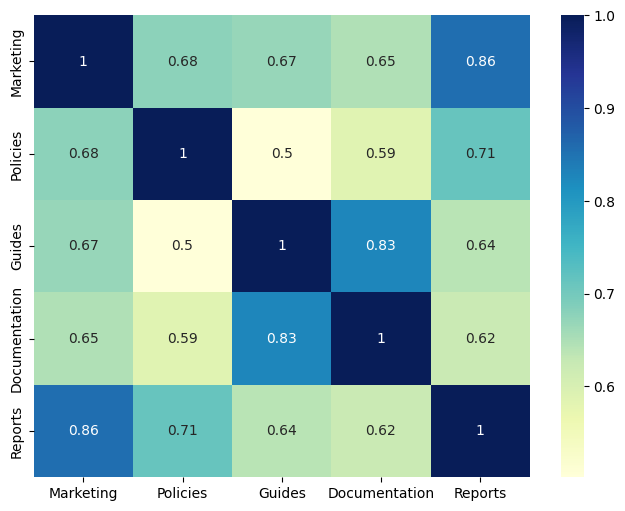

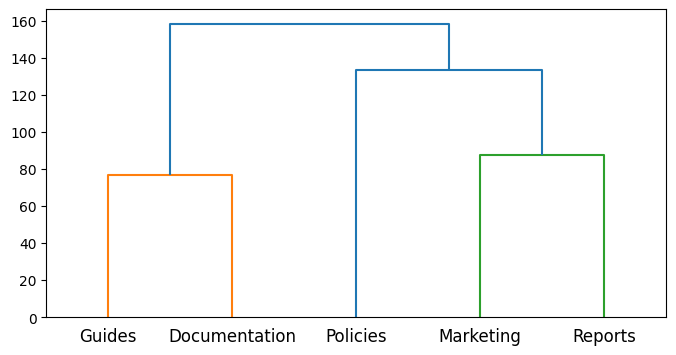

In [295]:
df_distribution = base_df[document_types]
similarity_matrix = compute_distribution(df_distribution)
plot_similarity_matrix(similarity_matrix, "all_document")
plot_similarity_cluster(df_distribution, "all_document")

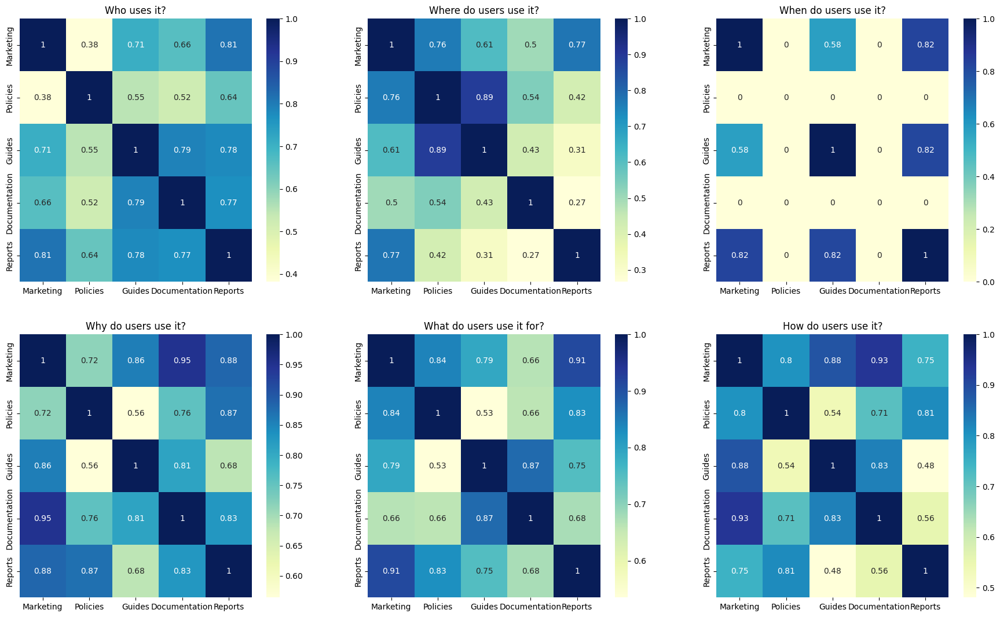

In [296]:
similarities_question(base_df, document_types, 'documents', new_order)

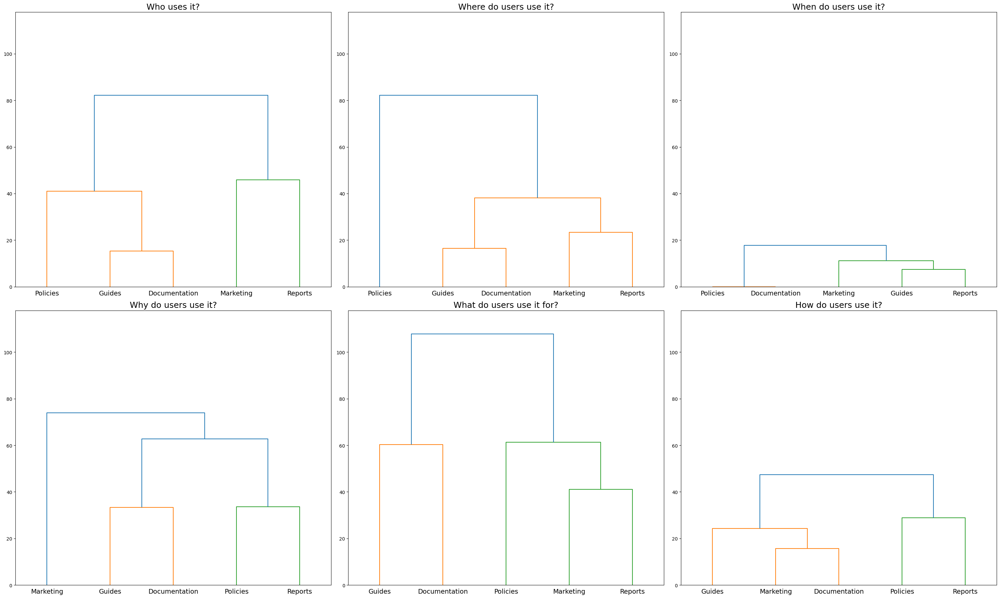

In [282]:
dendograms_questions(base_df, document_types, 'documents', new_order)

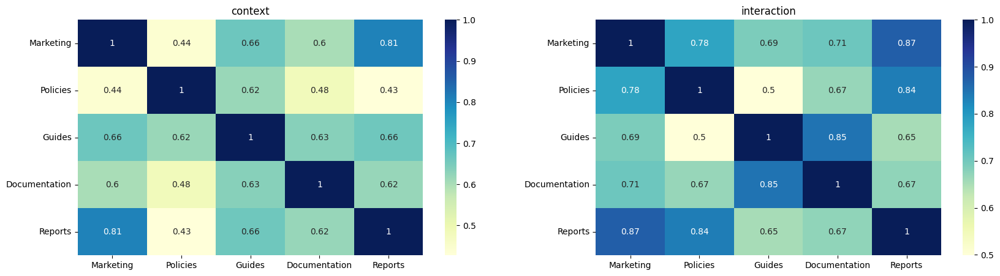

In [264]:
similarity_questionType(base_df, document_types, 'documents', new_order)

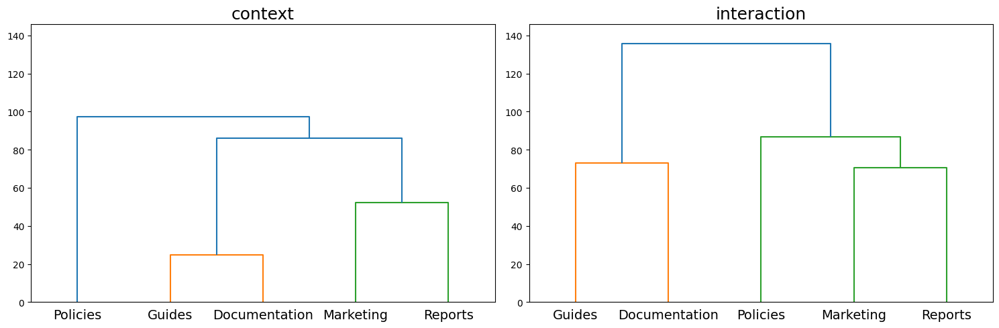

In [265]:
dendograms_questionType(base_df, document_types, 'documents', new_order)

# Analysis of methods - basic counts

In [637]:
df_methods = df.copy()

row = "Method #1"
df_methods.loc[row] = df_methods.loc[row].replace("", "unstated")
df_methods.loc[row] = df_methods.loc[row].fillna("unstated")

string_to_find = ['LLM', "Anthropic_21", "Anthropic_16", "AI2_6", "AI2_7"]
for elem in string_to_find:
    # Create a list of columns to drop
    columns_to_drop = [col for col in df_methods.columns if elem in col]
    # Drop the columns
    df_methods = df_methods.drop(columns=columns_to_drop)


In [638]:

def add_or_append_to_dict(my_dict, key):
    """
    Adds a value to a dictionary under a given key.
    If the key exists and its value is a list, the value is appended to the list.
    If the key exists and its value is not a list, the old value is replaced with a list
    containing the old value and the new value.
    If the key does not exist, a new key-value pair is created, where the value is a list
    containing the new value.
    """
    if key:
        if key in my_dict:
            my_dict[key] += 1
        else:
            my_dict[key] = 1
    return my_dict

dict_methods = {}
dict_methods_documentType = {}
dict_methods_company = {}
for column_name in df_methods.columns:
    documentType = df_methods[column_name]["Document categorization"]
    company = df_methods[column_name]["Company"]
    if documentType not in dict_methods_documentType:
        dict_methods_documentType[documentType] = {}
    if company not in dict_methods_company:
        dict_methods_company[company] = {}
    for i in range(1, 7):
        if not pd.isnull(df_methods[column_name]["Method #"+str(i)]):
            method_string = df_methods[column_name]["Method #"+str(i)]
            method_string = method_string.lower()
            # Clean the string
            method_string = method_string.replace("Interactions", "Interaction")
            method_string = method_string.replace("interactions", "interaction")
            method_string = method_string.replace("ambiguous", "unstated")
            method_string = method_string.replace("models", "model")
            method_string = " ".join(method_string.split())
            method_string = method_string.rstrip()
            dict_methods = add_or_append_to_dict(dict_methods, method_string)
            dict_methods_documentType[documentType] = add_or_append_to_dict(dict_methods_documentType, method_string)
            dict_methods_company[company] = add_or_append_to_dict(dict_methods_company, method_string)
            
dict_methods = {key: value for key, value in sorted(dict_methods.items())}

In [639]:
dict_methods

{'axiomatic - deductive inference - interaction': 21,
 'axiomatic - deductive inference - model': 5,
 'axiomatic - extrapolation or projection - interaction': 11,
 'axiomatic - extrapolation or projection - model': 2,
 'axiomatic - extrapolation or projection - unstated': 1,
 'axiomatic - unstated - model': 1,
 'empirical (implied) - interaction (implied) - observational (implied) - field (implied) - unstated': 7,
 'empirical (implied) - interaction (implied) - observational (implied) - field - self-report': 1,
 'empirical (implied) - interaction (implied) - observational - field (implied) - behavioral': 1,
 'empirical (implied) - interaction (implied) - observational - field - unstated': 1,
 'empirical (implied) - interaction (implied) - unstated - unstated - unstated': 1,
 'empirical (implied) - interaction - unstated - unstated - unstated': 3,
 'empirical (implied) - model (implied) - experimental - lab - behavioral': 1,
 'empirical (implied) - model (implied) - observational (impli

## Count without implied

In [8]:
cooccurence_list_withoutImplied = {}
dict_methods_withoutImplied = {}
for column_name in df_methods.columns:
    documentType = df_methods[column_name]["Document categorization"]
    company = df_methods[column_name]["Company"]
    cooccurence_list_withoutImplied[column_name] = {'nb_method':0, 'list_method':[], 'Company':"", "DocCategory":""}
    
   
    for i in range(1, 7):
        if not pd.isnull(df_methods[column_name]["Method #"+str(i)]):
            method_string = df_methods[column_name]["Method #"+str(i)]
            method_string = method_string.lower()
            # Clean the string
            method_string = method_string.replace("Interactions", "Interaction")
            method_string = method_string.replace("interactions", "interaction")
            method_string = method_string.replace("ambiguous", "unstated")
            method_string = method_string.replace("models", "model")
            method_string = method_string.replace(" (implied)", "")
            method_string = " ".join(method_string.split())
            method_string = method_string.rstrip()
            dict_methods_withoutImplied = add_or_append_to_dict(dict_methods_withoutImplied, method_string)
            cooccurence_list_withoutImplied[column_name]['nb_method'] += 1
            cooccurence_list_withoutImplied[column_name]['list_method'].append(method_string)
            cooccurence_list_withoutImplied[column_name]['Company'] = df_methods[column_name]['Company']
            cooccurence_list_withoutImplied[column_name]['DocCategory'] = df_methods[column_name]['Document categorization']
            
            
dict_methods_withoutImplied = {k: v for k, v in sorted(dict_methods_withoutImplied.items(), key=lambda item: item[1], reverse=True)}

In [9]:
dict_methods_withoutImplied

{'empirical - model - experimental - lab - behavioral': 41,
 'unstated': 22,
 'axiomatic - deductive inference - interaction': 21,
 'empirical - interaction - observational - field - behavioral': 15,
 'empirical - interaction - observational - field - self-report': 15,
 'axiomatic - extrapolation or projection - interaction': 11,
 'empirical - interaction - observational - field - unstated': 10,
 'empirical - interaction - experimental - lab - behavioral': 7,
 'empirical - interaction - unstated - unstated - unstated': 5,
 'empirical - model - experimental - lab - self-report': 5,
 'empirical - model - observational - lab - behavioral': 5,
 'empirical - model - observational - field - behavioral': 4,
 'axiomatic - deductive inference - model': 4,
 'empirical - interaction - experimental - field - behavioral': 3,
 'empirical - interaction - experimental - lab - self-report': 3,
 'empirical - interaction - unstated - field - unstated': 3,
 'empirical - model - observational - lab - self-

In [10]:
dict_axiomatic = {}
dict_empiricalInteraction = {}
dict_empiricalModel = {}

for key, value in (dict_methods_withoutImplied.items()):
    key = key.replace(" - ", " & ")
    if "axiomatic" in key:
        key = key.replace("axiomatic & ", "")
        dict_axiomatic[key] = value
    if "empirical & interaction" in key:
        key = key.replace("empirical & interaction & ", "")
        dict_empiricalInteraction[key] = value
    if "empirical & model" in key:
        key = key.replace("empirical & model & ", "")
        dict_empiricalModel[key] = value


In [11]:
print(dict_axiomatic)
total_sum = sum(dict_axiomatic.values()) 
print(total_sum)

{'deductive inference & interaction': 21, 'extrapolation or projection & interaction': 11, 'deductive inference & model': 4, 'extrapolation or projection & model': 2, 'extrapolation or projection & unstated': 1, 'deductive inference & unstated': 1, 'unstated & unstated & unstated & unstated': 1}
41


In [12]:
print(dict_empiricalInteraction)
total_sum = sum(dict_empiricalInteraction.values()) 
print(total_sum)

{'observational & field & behavioral': 15, 'observational & field & self-report': 15, 'observational & field & unstated': 10, 'experimental & lab & behavioral': 7, 'unstated & unstated & unstated': 5, 'experimental & field & behavioral': 3, 'experimental & lab & self-report': 3, 'unstated & field & unstated': 3, 'observational & lab & behavioral': 2, 'experimental & field & self-report': 1, 'experimental & lab & unstated': 1, 'observational & unstated & behavioral': 1, 'experimental & unstated & unstated': 1, 'unstated & lab & unstated': 1, 'observational & lab & self-report': 1, 'unstated & unstated & behavioral': 1, 'observational & unstated & self-report': 1}
71


In [13]:
print(dict_empiricalModel)
total_sum = sum(dict_empiricalModel.values()) 
print(total_sum)

{'experimental & lab & behavioral': 41, 'experimental & lab & self-report': 5, 'observational & lab & behavioral': 5, 'observational & field & behavioral': 4, 'observational & lab & self-report': 2, 'observational & field & self-report': 2, 'experimental & unstated & unstated': 2, 'experimental & unstated & behavioral': 2, 'experimental & lab & unstated': 1, 'observational & unstated & behavioral': 1}
65


### Count with "clean" methods

In [14]:
dict_methods_clean = {}
for column_name in df_methods.columns:
    documentType = df_methods[column_name]["Document categorization"]
    company = df_methods[column_name]["Company"]
    
    for i in range(1, 7):
        if not pd.isnull(df_methods[column_name]["Method #"+str(i)]):
            method_string = df_methods[column_name]["Method #"+str(i)]
            method_string = method_string.lower()
            # Clean the string
            method_string = method_string.replace("Interactions", "Interaction")
            method_string = method_string.replace("interactions", "interaction")
            method_string = method_string.replace("ambiguous", "unstated")
            method_string = method_string.replace("models", "model")
            method_string = method_string.replace(" (implied)", "")
            method_string = " ".join(method_string.split())
            method_string = method_string.rstrip()
            if "empirical - interaction" in method_string and "unstated" in method_string:
                method_string =  "empirical - interaction - unstated - unstated - unstated"
            if "empirical - model" in method_string and "unstated" in method_string:
                method_string =  "empirical - model - unstated - unstated - unstated"
            dict_methods_clean = add_or_append_to_dict(dict_methods_clean, method_string)
            
            
dict_methods_clean = {key: value for key, value in sorted(dict_methods_clean.items())}

In [15]:
dict_methods_clean

{'axiomatic - deductive inference - interaction': 21,
 'axiomatic - deductive inference - model': 4,
 'axiomatic - deductive inference - unstated': 1,
 'axiomatic - extrapolation or projection - interaction': 11,
 'axiomatic - extrapolation or projection - model': 2,
 'axiomatic - extrapolation or projection - unstated': 1,
 'axiomatic - unstated - unstated - unstated - unstated': 1,
 'empirical - interaction - experimental - field - behavioral': 3,
 'empirical - interaction - experimental - field - self-report': 1,
 'empirical - interaction - experimental - lab - behavioral': 7,
 'empirical - interaction - experimental - lab - self-report': 3,
 'empirical - interaction - observational - field - behavioral': 15,
 'empirical - interaction - observational - field - self-report': 15,
 'empirical - interaction - observational - lab - behavioral': 2,
 'empirical - interaction - observational - lab - self-report': 1,
 'empirical - interaction - unstated - unstated - unstated': 24,
 'empirica

In [16]:
total_sum = sum(dict_methods_clean.values()) - dict_methods["unstated"]
print(total_sum)

number_axiomatic = 0
number_empiricalInteraction = 0
number_empiricalModel = 0
number_containsUnstated = 0
for key, value in (dict_methods_clean.items()):
    if "axiomatic" in key:
        number_axiomatic += value
    elif "empirical - interaction" in key:
        number_empiricalInteraction += value
    elif "empirical - model" in key:
        number_empiricalModel += value
    elif "unstated" in key:
        number_containsUnstated += value
    else:
        print(key)
print("# axiomatic: ", number_axiomatic)
print("# empirical - interaction: ", number_empiricalInteraction)
print("# empirical - model: ", number_empiricalModel)
print("# remaining unstated: ", number_containsUnstated)

178
# axiomatic:  41
# empirical - interaction:  71
# empirical - model:  65
# remaining unstated:  23


### Study of cooccurences

In [17]:
cooccurence_list_withoutImplied

{'OpenAI_marketing_1': {'nb_method': 1,
  'list_method': ['empirical - interaction - unstated - unstated - unstated'],
  'Company': 'OpenAI',
  'DocCategory': 'Marketing materials'},
 'OpenAI_marketing_2': {'nb_method': 6,
  'list_method': ['empirical - interaction - observational - field - behavioral',
   'empirical - model - experimental - lab - behavioral',
   'empirical - model - experimental - lab - self-report',
   'empirical - unstated - unstated - unstated - unstated',
   'empirical - model - experimental - lab - unstated',
   'empirical - interaction - observational - field - self-report'],
  'Company': 'OpenAI',
  'DocCategory': 'Marketing materials'},
 'OpenAI_marketing_3': {'nb_method': 4,
  'list_method': ['empirical - model - observational - unstated - behavioral',
   'empirical - model - experimental - lab - behavioral',
   'empirical - interaction - observational - field - behavioral',
   'axiomatic - extrapolation or projection - interaction'],
  'Company': 'OpenAI',
 

In [18]:
df_coccurence = pd.DataFrame(cooccurence_list_withoutImplied)

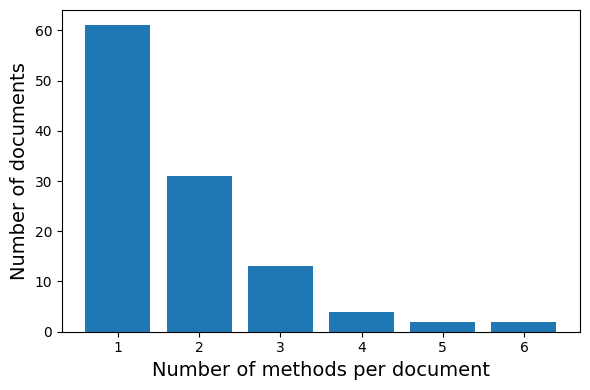

In [19]:
nb_methods = df_coccurence.loc["nb_method"].dropna().astype(int)


counts = nb_methods.value_counts().sort_index()

plt.figure(figsize=(6, 4))
plt.bar(counts.index, counts.values)

plt.xlabel("Number of methods per document", fontsize=14)
plt.ylabel("Number of documents", fontsize=14)
#plt.title("Distribution of number of methods per document")
plt.xticks(counts.index, fontsize=10)
plt.tight_layout()
#plt.show()
plt.savefig("plots/nbMethods_doc.png")

In [20]:
from collections import Counter


# -----------------------------
# 1. Load data from dictionary
# -----------------------------
data = cooccurence_list_withoutImplied  # replace with your actual dict name

rows = []
for doc_id, info in data.items():
    rows.append({
        "doc_id": doc_id,
        "Company": info.get("Company"),
        "nb_method": info.get("nb_method")
    })

df_co = pd.DataFrame(rows)

# Drop missing companies (e.g., 'Unnamed: 133')
df_co = df_co.dropna(subset=["Company"])

# -----------------------------
# 2. Prepare plotting setup
# -----------------------------
companies = sorted(df_co["Company"].unique())
max_methods = int(df_co["nb_method"].max())
bins = list(range(1, max_methods + 1))

n_companies = len(companies)
fig, axes = plt.subplots(
    nrows=1,
    ncols=n_companies,
    figsize=(3.2 * n_companies, 3),
    sharey=True
)

if n_companies == 1:
    axes = [axes]

# -----------------------------
# 3. Plot one bar chart per company
# -----------------------------
for ax, company in zip(axes, companies):
    values = df_co.loc[df_co["Company"] == company, "nb_method"]
    counts = Counter(values)

    #heights = [counts.get(b, 0) for b in bins]
    heights = [counts.get(b, 0) / len(values) for b in bins]


    ax.bar(bins, heights)
    ax.set_title(company, fontsize=12)
    ax.set_xlabel("Number of methods", fontsize=12)
    ax.set_xticks(bins)
    ax.set_xlim(0.5, max_methods + 0.5)

# Shared y-axis label
#axes[0].set_ylabel("Number of documents")
axes[0].set_ylabel("Proportion of documents", fontsize=12)

# -----------------------------
# 4. Final layout tweaks
# -----------------------------
#fig.suptitle("Distribution of Number of Methods per Document (by Company)",            fontsize=12, y=1.05)

plt.tight_layout()
plt.savefig(
    "plots/nb_methods_distribution_per_company.png",
    dpi=300,
    bbox_inches="tight"
)
plt.close()


In [21]:
from collections import Counter


# -----------------------------
# 1. Load data from dictionary
# -----------------------------
data = cooccurence_list_withoutImplied  # replace with your actual dict name

rows = []
for doc_id, info in data.items():
    rows.append({
        "doc_id": doc_id,
        "DocCategory": info.get("DocCategory"),
        "nb_method": info.get("nb_method")
    })

df_co = pd.DataFrame(rows)

# Drop missing companies (e.g., 'Unnamed: 133')
df_co = df_co.dropna(subset=["DocCategory"])

# -----------------------------
# 2. Prepare plotting setup
# -----------------------------
companies = sorted(df_co["DocCategory"].unique())
max_methods = int(df_co["nb_method"].max())
bins = list(range(1, max_methods + 1))

n_companies = len(companies)
fig, axes = plt.subplots(
    nrows=1,
    ncols=n_companies,
    figsize=(3.2 * n_companies, 3),
    sharey=True
)

if n_companies == 1:
    axes = [axes]

# -----------------------------
# 3. Plot one bar chart per company
# -----------------------------
for ax, company in zip(axes, companies):
    values = df_co.loc[df_co["DocCategory"] == company, "nb_method"]
    counts = Counter(values)

    #heights = [counts.get(b, 0) for b in bins]
    heights = [counts.get(b, 0) / len(values) for b in bins]


    ax.bar(bins, heights)
    ax.set_title(company, fontsize=12)
    ax.set_xlabel("Number of methods", fontsize=12)
    ax.set_xticks(bins)
    ax.set_xlim(0.5, max_methods + 0.5)

# Shared y-axis label
#axes[0].set_ylabel("Number of documents")
axes[0].set_ylabel("Proportion of documents", fontsize=12)

# -----------------------------
# 4. Final layout tweaks
# -----------------------------
#fig.suptitle("Distribution of Number of Methods per Document (by Company)",            fontsize=12, y=1.05)

plt.tight_layout()
plt.savefig(
    "plots/nb_methods_distribution_per_docType.png",
    dpi=300,
    bbox_inches="tight"
)
plt.close()


In [22]:
from itertools import combinations

all_method_lists = []

for doc_id, doc in cooccurence_list_withoutImplied.items():
    methods = doc.get("list_method", [])
    # remove obvious placeholders if you want
    methods = [m for m in methods if m != "unstated"]
    if len(methods) > 1:
        all_method_lists.append(methods)
        
co_occurrence = defaultdict(int)

for methods in all_method_lists:
    # unique methods per document (important!)
    methods = list(set(methods))
    
    for m1, m2 in combinations(methods, 2):
        co_occurrence[(m1, m2)] += 1
        co_occurrence[(m2, m1)] += 1  # symmetric

all_methods = sorted(set(
    m for methods in all_method_lists for m in methods
))

co_matrix = pd.DataFrame(
    0,
    index=all_methods,
    columns=all_methods
)

for (m1, m2), count in co_occurrence.items():
    co_matrix.loc[m1, m2] = count

co_matrix_norm = co_matrix.div(co_matrix.sum(axis=1), axis=0)


plt.figure(figsize=(14, 12))

sns.heatmap(
    co_matrix_norm,        # or co_matrix
    cmap="YlGnBu",
    square=True,
    linewidths=0.5,
    cbar_kws={"label": "Co-occurrence proportion"},
)

plt.title("Method Co-occurrence Matrix", fontsize=16)
plt.xlabel("Method")
plt.ylabel("Method")

plt.tight_layout()
plt.savefig("plots/method_cooccurrence_matrix.png", dpi=300)
plt.close()


In [23]:
series_flat = co_matrix_norm.stack()

# 3. Sort the Series by its values
# By default, sort_values() sorts in ascending order
series_sorted = series_flat.sort_values(ascending=False)

print("\n\nList of all cells ordered by value (as a Series with multi-index):")
print(series_sorted[0:20])



List of all cells ordered by value (as a Series with multi-index):
empirical - interaction - observational - unstated - behavioral  empirical - model - observational - field - behavioral           1.000000
axiomatic - deductive inference - unstated                       empirical - model - experimental - unstated - behavioral         1.000000
axiomatic - extrapolation or projection - unstated               empirical - interaction - observational - field - behavioral     1.000000
empirical - model - experimental - unstated - unstated           empirical - model - experimental - lab - behavioral              0.666667
empirical - interaction - experimental - lab - self-report       empirical - model - experimental - lab - behavioral              0.600000
axiomatic - deductive inference - interaction                    empirical - model - experimental - lab - behavioral              0.533333
empirical - model - experimental - unstated - behavioral         axiomatic - deductive inference 

In [30]:
co_matrix_norm_simplified = co_matrix_norm[~co_matrix_norm.index.str.contains('unstated')]

# Specify the character you want to check for (e.g., '!')
char_to_remove = 'unstated'
# Get a list of column names that contain the character
cols_to_drop = co_matrix_norm_simplified.columns[co_matrix_norm_simplified.columns.str.contains(char_to_remove, regex=False)]
# Drop the columns using the drop() method with axis=1
co_matrix_norm_simplified = co_matrix_norm_simplified.drop(columns=cols_to_drop)

plt.figure(figsize=(14, 12))

sns.heatmap(
    co_matrix_norm_simplified,        # or co_matrix
    cmap="YlGnBu",
    square=True,
    linewidths=0.5,
    cbar_kws={"label": "Co-occurrence proportion"},
)

#plt.title("Method Co-occurrence Matrix", fontsize=16)
#plt.xlabel("Method")
#plt.ylabel("Method")

plt.tight_layout()
plt.savefig("plots/method_cooccurrence_matrix_simplified.png", dpi=300)
plt.close()

In [27]:
series_flat = co_matrix_norm_simplified.stack()
# By default, sort_values() sorts in ascending order
series_sorted = series_flat.sort_values(ascending=False)

print("\n\nList of all cells ordered by value (as a Series with multi-index):")
print(series_sorted[0:20])



List of all cells ordered by value (as a Series with multi-index):
empirical - interaction - experimental - lab - self-report     empirical - model - experimental - lab - behavioral              0.600000
axiomatic - deductive inference - interaction                  empirical - model - experimental - lab - behavioral              0.533333
empirical - interaction - observational - lab - behavioral     empirical - model - experimental - lab - behavioral              0.500000
empirical - model - observational - field - self-report        empirical - interaction - observational - field - behavioral     0.500000
                                                               empirical - interaction - observational - field - self-report    0.500000
empirical - interaction - experimental - lab - behavioral      empirical - model - experimental - lab - behavioral              0.384615
empirical - model - experimental - lab - self-report           empirical - model - experimental - lab - behav

### Methods / companies / documents

In [39]:
dict_methods_clean = {}
for column_name in df_methods.columns:
    documentType = df_methods[column_name]["Document categorization"]
    company = df_methods[column_name]["Company"]
    dict_methods_clean[column_name] = {'method': [], 'company': company, 'docCategory': documentType}
    for i in range(1, 7):
        if not pd.isnull(df_methods[column_name]["Method #"+str(i)]):
            method_string = df_methods[column_name]["Method #"+str(i)]
            method_string = method_string.lower()
            # Clean the string
            method_string = method_string.replace("Interactions", "Interaction")
            method_string = method_string.replace("interactions", "interaction")
            method_string = method_string.replace("ambiguous", "unstated")
            method_string = method_string.replace("models", "model")
            method_string = method_string.replace(" (implied)", "")
            method_string = " ".join(method_string.split())
            method_string = method_string.rstrip()
            #if "empirical - interaction" in method_string and "unstated" in method_string:
            #    method_string =  "empirical - interaction - unstated - unstated - unstated"
            #if "empirical - model" in method_string and "unstated" in method_string:
            #    method_string =  "empirical - model - unstated - unstated - unstated"
            #dict_methods_clean = add_or_append_to_dict(dict_methods_clean, method_string)
            dict_methods_clean[column_name]['method'].append(method_string)
            
            
#dict_methods_clean = {key: value for key, value in sorted(dict_methods_clean.items())}


In [40]:
df_methods_clean = pd.DataFrame(dict_methods_clean)

In [43]:
df_methods_clean

,OpenAI_marketing_1,OpenAI_marketing_2,OpenAI_marketing_3,OpenAI_marketing_4,OpenAI_marketing_5,OpenAI_report_1,OpenAI_report_2,OpenAI_report_3,OpenAI_report_4,OpenAI_report_5,...,Microsoft_10,Microsoft_11,Microsoft_12,Microsoft_13,Microsoft_14,Microsoft_15,Microsoft_16,Microsoft_17,Microsoft_18,Unnamed: 133
method,[empirical - interaction - unstated - unstated...,[empirical - interaction - observational - fie...,[empirical - model - observational - unstated ...,[unstated],[empirical - model - observational - lab - beh...,[empirical - interaction - experimental - fiel...,[empirical - model - experimental - lab - beha...,[empirical - model - experimental - lab - beha...,[empirical - model - experimental - lab - beha...,[empirical - model - experimental - lab - beha...,...,[axiomatic - deductive inference - model],[empirical - interaction - observational - fie...,[unstated],[empirical - interaction - unstated - unstated...,[axiomatic - deductive inference - interaction],[empirical - interaction - observational - fie...,[empirical - interaction - unstated - field - ...,[unstated],[empirical - interaction - unstated - field - ...,[unstated]
company,OpenAI,OpenAI,OpenAI,OpenAI,OpenAI,OpenAI,OpenAI,OpenAI,OpenAI,OpenAI,...,Microsoft,Microsoft,Microsoft,Microsoft,Microsoft,Microsoft,Microsoft,Microsoft,Microsoft,NaN
docCategory,Marketing materials,Marketing materials,Marketing materials,Marketing materials,Marketing materials,Reports,Model documentation,Model documentation,Model documentation,Model documentation,...,Model documentation,Reports,Developer guides,Developer guides,Developer guides,Reports,Marketing materials,Marketing materials,Marketing materials,NaN


In [44]:

# df is your original dataframe
# index = ['method', 'company', 'docCategory']

# Transpose so documents become rows
df_long = df_methods_clean.T.reset_index().rename(columns={"index": "document"})

# Rename columns explicitly (safe)
df_long = df_long.rename(columns={
    "method": "method",
    "company": "Company",
    "docCategory": "DocCategory"
})

# Drop empty documents
df_long = df_long.dropna(subset=["Company"])

# Ensure method column is a list
df_long["method"] = df_long["method"].apply(
    lambda x: x if isinstance(x, list) else []
)

# Explode methods → one method per row
df_exploded = df_long.explode("method")

# Optional cleanup
df_exploded["method"] = df_exploded["method"].str.strip()


In [45]:
df_exploded

,document,method,Company,DocCategory
0,OpenAI_marketing_1,empirical - interaction - unstated - unstated ...,OpenAI,Marketing materials
1,OpenAI_marketing_2,empirical - interaction - observational - fiel...,OpenAI,Marketing materials
1,OpenAI_marketing_2,empirical - model - experimental - lab - behav...,OpenAI,Marketing materials
1,OpenAI_marketing_2,empirical - model - experimental - lab - self-...,OpenAI,Marketing materials
1,OpenAI_marketing_2,empirical - unstated - unstated - unstated - u...,OpenAI,Marketing materials
...,...,...,...,...
108,Microsoft_15,empirical - interaction - observational - fiel...,Microsoft,Reports
109,Microsoft_16,empirical - interaction - unstated - field - u...,Microsoft,Marketing materials
109,Microsoft_16,empirical - interaction - experimental - field...,Microsoft,Marketing materials
110,Microsoft_17,unstated,Microsoft,Marketing materials


In [49]:
import math

def two_row_grid(n):
    ncols = math.ceil(n / 2)
    return 2, ncols


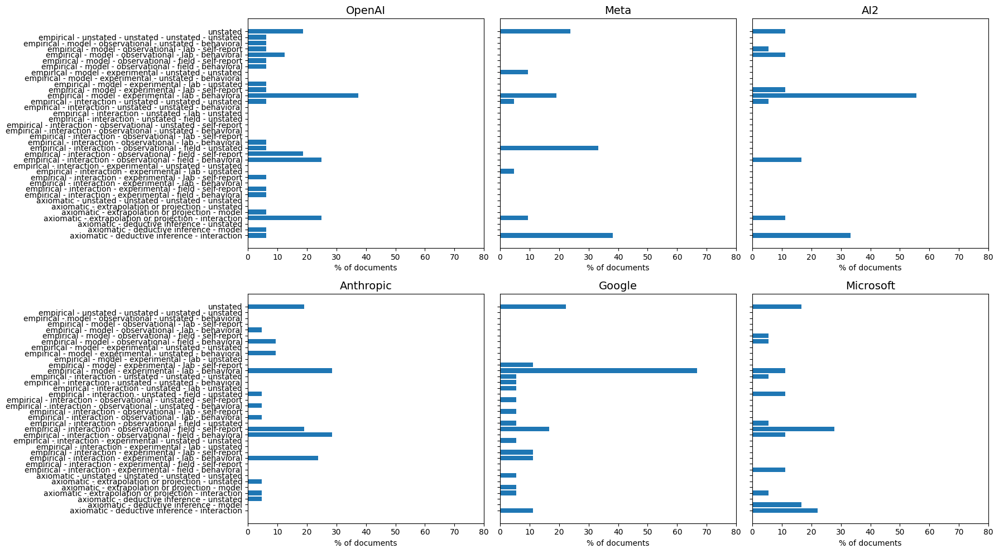

In [65]:
companies = df_exploded["Company"].dropna().unique()
nrows, ncols = two_row_grid(len(companies))

# Get all unique methods and sort alphabetically
all_methods = sorted(df_exploded["method"].dropna().unique())

fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(6 * ncols, 5 * nrows),
    sharey=True  # share y-axis across all subplots
)

axes = axes.flatten()

for ax, company in zip(axes, companies):
    temp = df_exploded[df_exploded["Company"] == company].copy()
    temp["method"] = temp["method"].astype(str)
    n_docs = temp["document"].nunique()

    # Count unique documents per method
    counts = temp.groupby("method")["document"].nunique()

    # Make sure all methods are represented, fill missing with 0
    counts = counts.reindex(all_methods, fill_value=0)
    percentages = counts / n_docs * 100

    ax.barh(all_methods, percentages.values)
    ax.set_title(company, fontsize=14)
    ax.set_xlabel("% of documents")
    ax.set_xlim(0, 80)

# Remove empty axes
for ax in axes[len(companies):]:
    ax.axis("off")

plt.tight_layout()
plt.savefig("plots/methods_company.png")

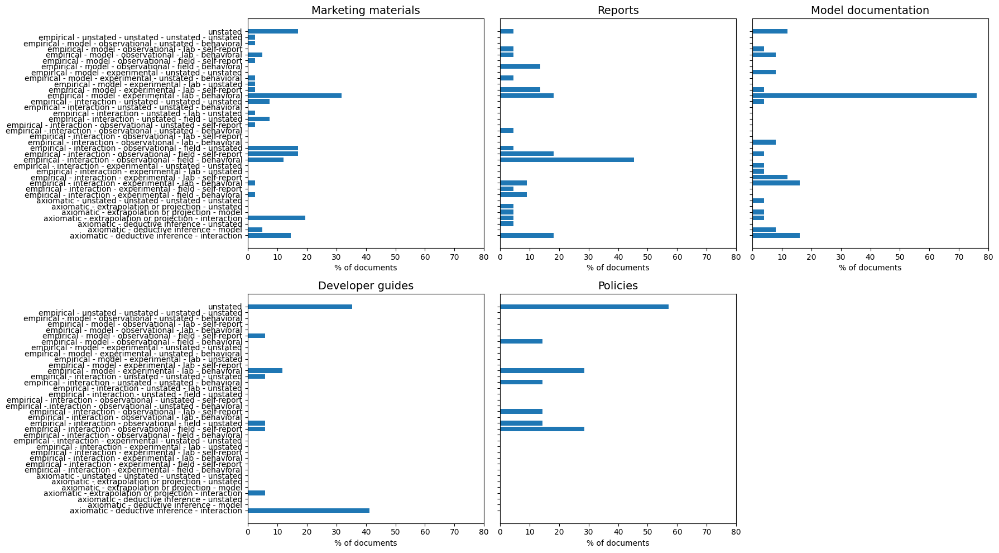

In [66]:
doc_types = df_exploded["DocCategory"].dropna().unique()
nrows, ncols = two_row_grid(len(doc_types))

# Get all unique methods and sort alphabetically
all_methods = sorted(df_exploded["method"].dropna().unique())

fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(6 * ncols, 5 * nrows),
    sharey=True  # share y-axis across all subplots
)

axes = axes.flatten()

for ax, doc_type in zip(axes, doc_types):
    temp = df_exploded[df_exploded["DocCategory"] == doc_type].copy()
    temp["method"] = temp["method"].astype(str)
    n_docs = temp["document"].nunique()

    # Count unique documents per method
    counts = temp.groupby("method")["document"].nunique()

    # Reindex to include all methods alphabetically, fill missing with 0
    counts = counts.reindex(all_methods, fill_value=0)
    percentages = counts / n_docs * 100

    ax.barh(all_methods, percentages.values)
    ax.set_title(doc_type, fontsize=14)
    ax.set_xlabel("% of documents")
    ax.set_xlim(0, 80)

# Remove empty axes
for ax in axes[len(doc_types):]:
    ax.axis("off")

plt.tight_layout()
plt.savefig("plots/methods_document.png")

# Analysis of methods x information

In [531]:

def add_or_append_to_dict(my_dict, key):
    """
    Adds a value to a dictionary under a given key.
    If the key exists and its value is a list, the value is appended to the list.
    If the key exists and its value is not a list, the old value is replaced with a list
    containing the old value and the new value.
    If the key does not exist, a new key-value pair is created, where the value is a list
    containing the new value.
    """
    if key:
        if key in my_dict:
            my_dict[key] += 1
        else:
            my_dict[key] = 1
    return my_dict

In [532]:
# Load file
df_raw = pd.read_excel('annotations_2601_full.xlsx', sheet_name='Clean_doc', index_col=0, nrows=147)

# Drop empty / unnamed columns
df_raw = df_raw.loc[:, ~df_raw.columns.str.contains("^Unnamed")]

df_raw = df_raw.loc[:, ~df_raw.columns.str.contains("LLM")]
df_raw = df_raw.loc[:, ~df_raw.columns.str.contains("Anthropic_21")]
df_raw = df_raw.loc[:, ~df_raw.columns.str.contains("Anthropic_16")]
df_raw = df_raw.loc[:, ~df_raw.columns.str.contains("AI2_6")]
df_raw = df_raw.loc[:, ~df_raw.columns.str.contains("AI2_7")]
df_raw = df_raw.loc[:, ~df_raw.columns.str.contains("_old")]
df_raw_clean = df_raw.copy()


In [517]:
# OPTION 1 for processing docs
idx_row = -1
for index, row in df_raw.iterrows():
    idx_row +=1
    if isinstance(index, str) and ("-method" in index) and ("quote" not in index) and ("Method #" not in index):
        for column_name, value in row.items():
            current_method = value
            if pd.isna(current_method):
                clean_method = ["NA"]
                df_raw_clean.iloc[idx_row][column_name] = [clean_method][0]
            elif current_method == "None":
                clean_method = ["NA"]
                df_raw_clean.iloc[idx_row][column_name] = [clean_method][0]
            else:
                current_method = current_method.lower()
                current_method = current_method.replace("unstated", "no method")
                current_method = current_method.split(',')
                
                processed_current_method = []
                for met in current_method:
                    processed_current_method.append(met.strip())
                current_method = list(set(processed_current_method))
                clean_method = []
                
                for individual_method in current_method:
                    if "#" not in individual_method:
                        clean_method.append(individual_method)
                    else:
                        actual_method = df_raw.loc["Method " + individual_method, column_name]
                        actual_method = actual_method.lower()
                        actual_method = actual_method.replace("Interactions", "Interaction")
                        actual_method = actual_method.replace("interactions", "interaction")
                        actual_method = actual_method.replace("ambiguous", "unstated")
                        actual_method = actual_method.replace("models", "model")
                        actual_method = actual_method.replace(" (implied)", "")
                        actual_method = actual_method.rstrip()
                        clean_method.append(actual_method)
                #print(clean_method)
                #df_raw_clean.loc[index, column_name] = df_raw.loc[index, column_name].astype(object)
                #df_raw_clean.loc[index, column_name] = [clean_method]
                df_raw_clean.iloc[idx_row][column_name] = [clean_method][0]




/var/folders/96/blzs496n26j3l5wls5rml_500000gn/T/ipykernel_77301/3671705163.py:41: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_raw_clean.iloc[idx_row][column_name] = [clean_method][0]
/var/folders/96/blzs496n26j3l5wls5rml_500000gn/T/ipy

In [533]:
# OPTION 2 for processing docs


idx_row = -1
for index, row in df_raw.iterrows():
    idx_row +=1
    if isinstance(index, str) and ("-method" in index) and ("quote" not in index) and ("Method #" not in index):
        for column_name, value in row.items():
            current_method = value
            if pd.isna(current_method):
                clean_method = ["NA"]
                df_raw_clean.iloc[idx_row][column_name] = [clean_method][0]
            elif current_method == "None":
                clean_method = ["NA"]
                df_raw_clean.iloc[idx_row][column_name] = [clean_method][0]
            else:
                current_method = current_method.lower()
                current_method = current_method.replace("unstated", "no method")
                current_method = current_method.split(',')
                
                
                processed_current_method = []
                for met in current_method:
                    processed_current_method.append(met.strip())
                current_method = list(set(processed_current_method))
                clean_method = []
                
                for individual_method in current_method:
                    if "#" not in individual_method:
                        clean_method.append(individual_method)
                    else:
                        actual_method = df_raw.loc["Method " + individual_method, column_name]
                        actual_method = actual_method.lower()
                        actual_method = actual_method.replace("Interactions", "Interaction")
                        actual_method = actual_method.replace("interactions", "interaction")
                        actual_method = actual_method.replace("ambiguous", "unstated")
                        actual_method = actual_method.replace("models", "model")
                        actual_method = actual_method.replace(" (implied)", "")
                        actual_method = actual_method.rstrip()
                        ### Processing simplification
                        if "empirical - model" in  actual_method:
                            actual_method = "empirical - model"
                        if "empirical - interaction" in  actual_method:
                            actual_method = "empirical - interaction"
                        clean_method.append(actual_method)
                #print(clean_method)
                #df_raw_clean.loc[index, column_name] = df_raw.loc[index, column_name].astype(object)
                #df_raw_clean.loc[index, column_name] = [clean_method]
                df_raw_clean.iloc[idx_row][column_name] = [clean_method][0]




/var/folders/96/blzs496n26j3l5wls5rml_500000gn/T/ipykernel_77301/2028783720.py:49: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_raw_clean.iloc[idx_row][column_name] = [clean_method][0]
/var/folders/96/blzs496n26j3l5wls5rml_500000gn/T/ipy

In [534]:

df_raw_clean["temporality"] = "TBD"
df_raw_clean["question"] = "TBD"
df_raw_clean = df_raw_clean.drop("Link")


In [535]:
list_useQuestions = ["Which genAI do users use?", "Who uses it?",  "Where do users use it?", "When do users use it?", "What do users use it for?",\
                       "Why do users use it?", "How do users use it?"]   


# --- SAFETY: make sure we're working on the real dataframe ---
df_raw_clean = df_raw_clean.copy()

# --- Column positions (faster + safer) ---
question_col = df_raw_clean.columns.get_loc("question")
temporality_col = df_raw_clean.columns.get_loc("temporality")

# --- Convert use-question index labels → positional indices ---
use_question_positions = [
    df_raw_clean.index.get_loc(idx)
    for idx in list_useQuestions
    if idx in df_raw_clean.index
]


In [536]:

# --- Main assignment loop ---
for index_question in use_question_positions:

    # Guard against running past the end
    end = min(index_question + 16, len(df_raw_clean))

    # Question ID (index label of the question row)
    question_id = df_raw_clean.index[index_question]

    # Assign question ID to the whole block
    df_raw_clean.iloc[index_question:end, question_col] = question_id

    # Assign temporalities
    if index_question + 1 < end:
        df_raw_clean.iloc[index_question + 1 : index_question + 6, temporality_col] = "actual"

    if index_question + 6 < end:
        df_raw_clean.iloc[index_question + 6 : index_question + 11, temporality_col] = "potential"

    if index_question + 11 < end:
        df_raw_clean.iloc[index_question + 11 : end, temporality_col] = "projected"


In [537]:
df_raw_clean = df_raw_clean[0:124]
df_raw_clean = df_raw_clean[df_raw_clean.index.notna()]


substring = 'method'
# Get all rows where the index contains the substring
filtered_df = df_raw_clean[df_raw_clean.index.str.contains(substring)]

filtered_df = filtered_df[~filtered_df.index.str.contains("quote")]

In [538]:
clean_dic_question = {}
clean_dic_temporality = {}
clean_dic_question_temporality = {}

for index, row in filtered_df.iterrows():
    temporality = row["temporality"]
    question = row["question"]
    name = question + " - " + temporality
    clean_dic_question_temporality[name] = {'count': 0, 'method':{}}
    if question not in clean_dic_question:
        clean_dic_question[question] = {'count': 0, 'method':{}}
    if temporality not in clean_dic_temporality:
        clean_dic_temporality[temporality] = {'count': 0, 'method':{}}
    for column_name, value in row.items():
        if column_name != "temporality" and column_name != "question":
            if isinstance(value, list) and value != ["NA"]:
                clean_dic_question_temporality[name]['count'] += 1
                clean_dic_question[question]['count'] += 1
                clean_dic_temporality[temporality]['count'] += 1
                for individual_method in value:
                    add_or_append_to_dict(clean_dic_question_temporality[name]['method'], individual_method)
                    add_or_append_to_dict(clean_dic_question[question]['method'], individual_method)
                    add_or_append_to_dict(clean_dic_temporality[temporality]['method'], individual_method)


In [539]:
clean_dic_question = {}
clean_dic_temporality = {}
clean_dic_question_temporality = {}

for index, row in filtered_df.iterrows():
    temporality = row["temporality"]
    question = row["question"]
    name = question + " - " + temporality

    if name not in clean_dic_question_temporality:
        clean_dic_question_temporality[name] = {'count': 0, 'method': {}}

    if question not in clean_dic_question:
        clean_dic_question[question] = {'count': 0, 'method': {}}

    if temporality not in clean_dic_temporality:
        clean_dic_temporality[temporality] = {'count': 0, 'method': {}}

    for column_name, value in row.items():
        if column_name not in ("temporality", "question"):
            if isinstance(value, list)  and value != ["NA"]:
                clean_dic_question_temporality[name]['count'] += 1
                clean_dic_question[question]['count'] += 1
                clean_dic_temporality[temporality]['count'] += 1

                for individual_method in value:
                    add_or_append_to_dict(
                        clean_dic_question_temporality[name]['method'],
                        individual_method
                    )
                    add_or_append_to_dict(
                        clean_dic_question[question]['method'],
                        individual_method
                    )
                    add_or_append_to_dict(
                        clean_dic_temporality[temporality]['method'],
                        individual_method
                    )

In [540]:
import textwrap


def wrap_labels(labels, width=30):
    return ["\n".join(textwrap.wrap(label, width)) for label in labels]

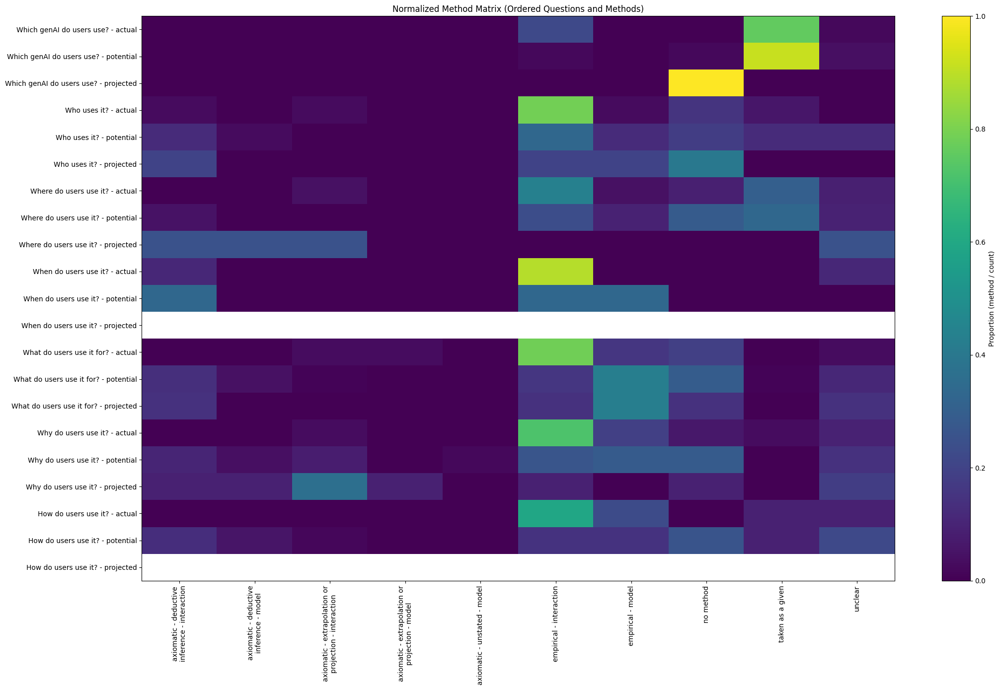

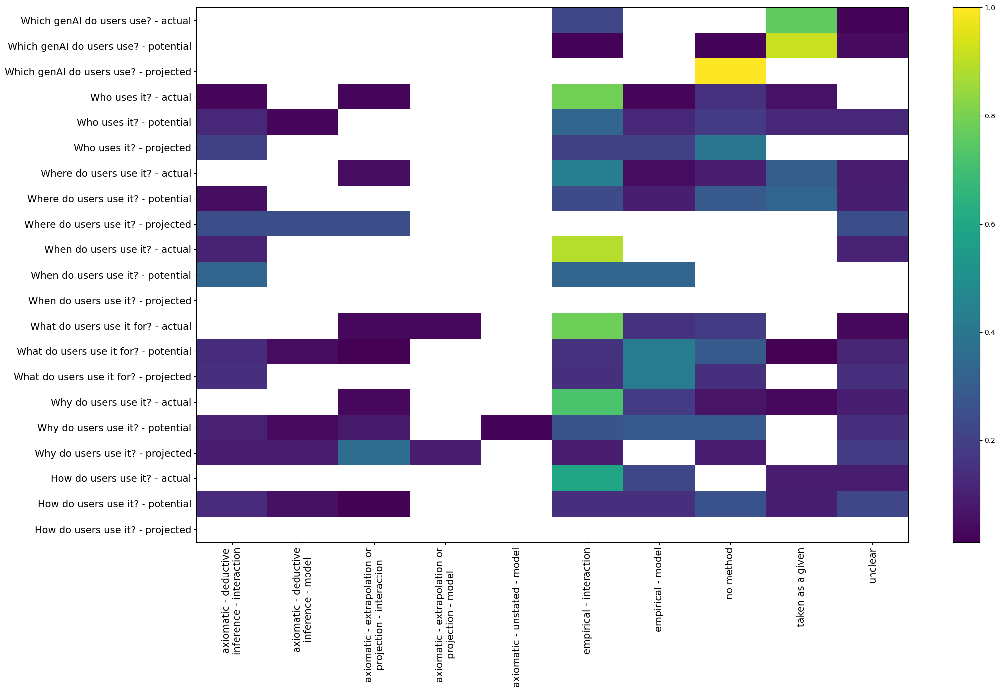

In [541]:

data = clean_dic_question_temporality  # replace with your variable name

rows = []

for key, entry in data.items():
    question_part, temporal = key.rsplit(" - ", 1)
    total = entry["count"]

    for method, value in entry["method"].items():
        rows.append({
            "question": question_part,
            "temporal": temporal,
            "method": method,
            "value": value / total
        })

df = pd.DataFrame(rows)

question_order = [
    "Which genAI do users use?",
    "Who uses it?",
    "Where do users use it?",
    "When do users use it?",
    "What do users use it for?",
    "Why do users use it?",
    "How do users use it?"
]

temporal_order = ["actual", "potential", "projected"]

df["question"] = pd.Categorical(
    df["question"],
    categories=question_order,
    ordered=True
)

df["temporal"] = pd.Categorical(
    df["temporal"],
    categories=temporal_order,
    ordered=True
)
df["row_label"] = (
    df["question"].astype(str)
    + " - "
    + df["temporal"].astype(str)
)

matrix = df.pivot_table(
    index="row_label",
    columns="method",
    values="value",
    fill_value=0
)

# enforce method alphabetical order
matrix = matrix.reindex(sorted(matrix.columns), axis=1)

# enforce row order
row_order = [
    f"{q} - {t}"
    for q in question_order
    for t in temporal_order
]

matrix = matrix.reindex(row_order)

wrapped_columns = wrap_labels(matrix.columns, width=30)
#matrix = matrix.drop(columns=['NA'])


plt.figure(figsize=(22, 14))
plt.imshow(matrix.values, aspect="auto")
plt.colorbar(label="Proportion (method / count)")

plt.xticks(
    ticks=range(len(matrix.columns)),
    labels=wrapped_columns,#matrix.columns,
    rotation=90
)

plt.yticks(
    ticks=range(len(matrix.index)),
    labels=matrix.index
)

plt.title("Normalized Method Matrix (Ordered Questions and Methods)")
plt.tight_layout()
plt.show()

masked = np.ma.masked_where(matrix.values == 0, matrix.values)


cmap = plt.cm.viridis.copy()
cmap.set_bad(color="white")


plt.figure(figsize=(22, 14))
plt.imshow(masked, aspect="auto", cmap=cmap)
plt.colorbar(label="")


plt.xticks(
ticks=range(len(matrix.columns)),
labels=wrapped_columns, #matrix.columns,
rotation=90,
fontsize=14
)


plt.yticks(
ticks=range(len(matrix.index)),
labels=matrix.index,
    fontsize=14
)


#plt.title("Normalized Method Matrix (zeros shown as white)")
plt.tight_layout()
plt.savefig("plots/method_informationTemporality_simplified.png")
#plt.show()

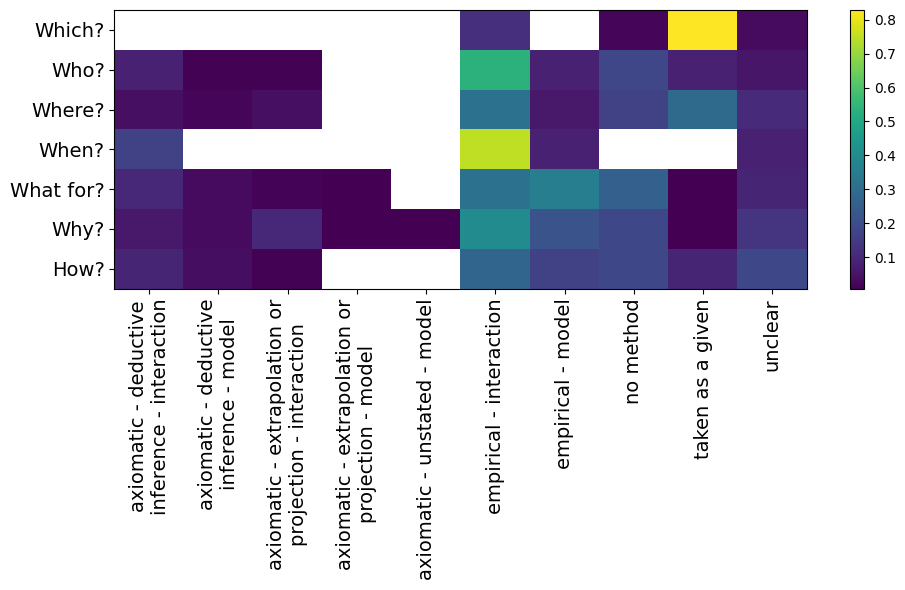

In [548]:

data = clean_dic_question
  # replace with your variable name

rows = []

for question, entry in data.items():
    total = entry["count"]
    for method, value in entry["method"].items():
        rows.append({
            "question": question,
            "method": method,
            "value": value / total
        })

df = pd.DataFrame(rows)

matrix = df.pivot_table(
    index="question",
    columns="method",
    values="value",
    fill_value=0
)

# enforce alphabetical order of methods
matrix = matrix.reindex(sorted(matrix.columns), axis=1)
wrapped_columns = wrap_labels(matrix.columns, width=30)

question_order = [
    "Which genAI do users use?",
    "Who uses it?",
    "Where do users use it?",
    "When do users use it?",
    "What do users use it for?",
    "Why do users use it?",
    "How do users use it?"
]

matrix = matrix.reindex(question_order)
#matrix = matrix.drop(columns=['NA'])

masked = np.ma.masked_where(matrix.values == 0, matrix.values)

cmap = plt.cm.viridis.copy()
cmap.set_bad(color="white")

plt.figure(figsize=(10, 6))
plt.imshow(masked, aspect="auto", cmap=cmap)
plt.colorbar(label="")

plt.xticks(
    ticks=range(len(matrix.columns)),
    labels=wrapped_columns, #matrix.columns,
    rotation=90,
    fontsize=14
)

plt.yticks(
    ticks=range(len(matrix.index)),
    labels=["Which?",
    "Who?",
    "Where?",
    "When?",
    "What for?",
    "Why?",
    "How?"],#matrix.index,
    fontsize=14
)

#plt.title("Normalized Method Matrix by Question (Zeros in White)")
plt.tight_layout()
plt.savefig("plots/method_information_simplified.png")


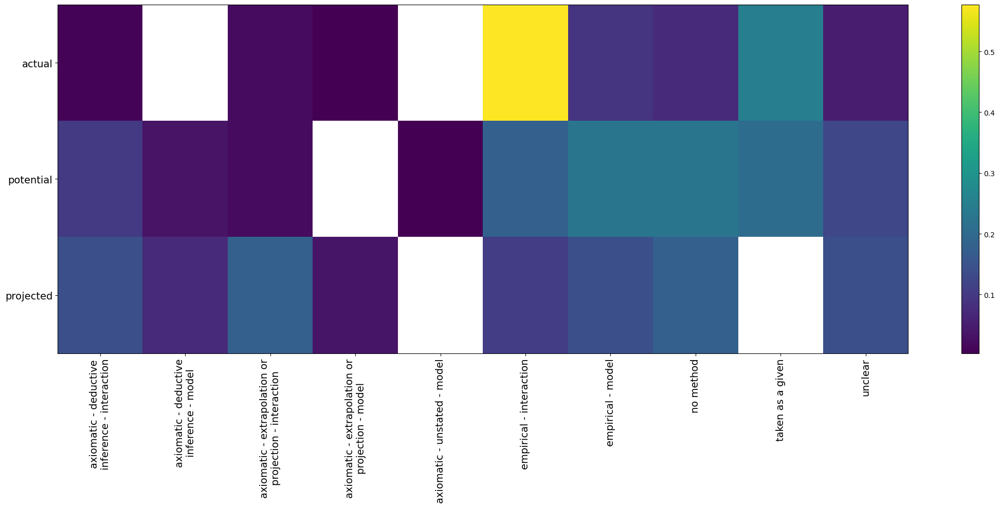

In [543]:

data = clean_dic_temporality
  # replace with your variable name

rows = []

for question, entry in data.items():
    total = entry["count"]
    for method, value in entry["method"].items():
        rows.append({
            "temporality": question,
            "method": method,
            "value": value / total
        })

df = pd.DataFrame(rows)

matrix = df.pivot_table(
    index="temporality",
    columns="method",
    values="value",
    fill_value=0
)

# enforce alphabetical order of methods
matrix = matrix.reindex(sorted(matrix.columns), axis=1)
wrapped_columns = wrap_labels(matrix.columns, width=30)

question_order = [
    "actual", "potential", "projected"
]

matrix = matrix.reindex(question_order)
#matrix = matrix.drop(columns=['NA'])

masked = np.ma.masked_where(matrix.values == 0, matrix.values)

cmap = plt.cm.viridis.copy()
cmap.set_bad(color="white")

plt.figure(figsize=(22, 10))
plt.imshow(masked, aspect="auto", cmap=cmap)
plt.colorbar(label="")

plt.xticks(
    ticks=range(len(matrix.columns)),
    labels=wrapped_columns, #matrix.columns,
    rotation=90,
    fontsize=14
)

plt.yticks(
    ticks=range(len(matrix.index)),
    labels=matrix.index,
    fontsize=14
)

#plt.title("Normalized Method Matrix by Question (Zeros in White)")
plt.tight_layout()
plt.savefig("plots/method_temporality_simplified.png")
